Nama: Triyoza Aprianda

### Import modul

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import itertools
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.feature_selection import mutual_info_classif, SelectKBest, VarianceThreshold
from scipy.stats import skew, skewtest, pearsonr, normaltest, t, ttest_ind
from scipy.stats.mstats import spearmanr
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, RobustScaler, OrdinalEncoder, OneHotEncoder
from google.colab import files
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, precision_recall_curve, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

def classif_pr(x, y, estimator, th):
    y_pred = estimator.predict_proba(x)[:,1] > th
    print(classification_report(y, y_pred, labels = [1,0]))

def classif(x, y, estimator):
    y_pred = estimator.predict(x)
    print(classification_report(y, y_pred, labels = [1,0]))

### Data

In [ ]:
#devset = pd.read_csv('/content/gdrive/MyDrive/SV_DS/Data/model_development_set.csv', delimiter = ',')
#backtest = pd.read_csv('/content/gdrive/MyDrive/SV_DS/Data/model_backtesting_set.csv', delimiter = ',')

In [ ]:
devset = pd.read_csv('model_development_set.csv')
backtest = pd.read_csv('model_backtesting_set.csv')

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
devset.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,label
0,8b9f55ee19f0356ba6b3f03485e6922d,bc7b9e0d078c0c01f622b38cfcd7ee9c,20521.0,rio de janeiro,RJ,20521.0,-22.927008,-43.230270,rio de janeiro,RJ,276e586682c7afb8f69a92fb276dc884,delivered,2017-03-20 21:55:02,2017-03-20 21:55:02,2017-03-23 12:22:48,2017-03-30 13:57:07,2017-04-12 00:00:00,1.0,29b85c2f1ec5f4d02b03737a8fd3698b,44073f8b7e41514de3b7815dd0237f4f,2017-03-26 21:55:02,183.00,16.58,1.0,credit_card,4.0,199.58,moveis_decoracao,23.0,922.0,1.0,850.0,16.0,19.0,15.0,71070.0,brasilia,DF,furniture_decor,0
1,5dddbfbf5ba7c90dcb52c18d7835b756,2004ba7732339d9be65f2236d8887ae4,22450.0,rio de janeiro,RJ,22450.0,-22.987642,-43.228795,rio de janeiro,RJ,bf25ff262495b0b876bc4f594f736ecf,delivered,2018-05-10 11:23:03,2018-05-10 11:51:37,2018-05-16 15:29:00,2018-05-22 19:03:49,2018-06-14 00:00:00,1.0,53b36df67ebb7c41585e8d54d6772e08,7d13fca15225358621be4086e1eb0964,2018-05-16 11:51:37,115.00,0.00,1.0,credit_card,10.0,115.00,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,14050.0,ribeirao preto,SP,watches_gifts,1
2,c7f26440b498a90f758f26eda34f1801,e64711458e5538f51bc01c3388443450,20040.0,rio de janeiro,RJ,20040.0,-22.903826,-43.177436,rio de janeiro,RJ,b686713e41eabb681b6e7948118f24f7,delivered,2018-03-19 12:14:50,2018-03-19 12:30:39,2018-03-20 17:58:50,2018-04-02 22:36:51,2018-04-19 00:00:00,1.0,ee406bf28024d97771c4b1e8b7e8e219,7a67c85e85bb2ce8582c35f2203ad736,2018-03-23 12:30:39,144.99,17.28,1.0,credit_card,3.0,162.27,cool_stuff,54.0,629.0,1.0,1050.0,36.0,24.0,22.0,3426.0,sao paulo,SP,cool_stuff,1
3,05e86ce92eb1b627c2296627078d237c,480ca1a9f688a4c482177efdeeb5c3a3,21330.0,rio de janeiro,RJ,21330.0,-22.881837,-43.358881,rio de janeiro,RJ,d17ebef6117650c283479ff4dca49c6f,delivered,2017-07-20 12:00:22,2017-07-20 12:10:08,2017-07-24 16:24:55,2017-07-31 19:03:53,2017-08-21 00:00:00,1.0,b71ed32edb9ce4684e10a11309011b60,5a93f3ab0ef4c84ed5e1b5dbf23978bc,2017-08-03 12:10:08,10.00,15.10,1.0,credit_card,5.0,50.20,alimentos_bebidas,30.0,690.0,2.0,500.0,25.0,9.0,18.0,12250.0,monteiro lobato,SP,food_drink,1
4,552215a43eb8963b5ea631bde3e63bc5,dbc6ce0dfea576d88ea65af28d09b69e,56460.0,petrolandia,PE,56460.0,-8.982786,-38.222378,petrolandia,PE,08451f484ac3dba5140399d0b7e0a829,delivered,2018-01-02 10:32:22,2018-01-03 04:33:26,2018-01-08 19:42:58,2018-01-22 22:19:07,2018-02-14 00:00:00,1.0,df3a82b424a1bb351c314547f6644066,4e922959ae960d389249c378d1c939f5,2018-01-12 04:33:26,65.00,25.73,1.0,boleto,1.0,90.73,cool_stuff,35.0,534.0,2.0,200.0,20.0,10.0,20.0,12327.0,jacarei,SP,cool_stuff,1


In [ ]:
devset.shape

(13645, 40)

In [ ]:
backtest.shape

(5858, 39)

In [ ]:
devset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_id                    13645 non-null  object 
 1   customer_unique_id             13645 non-null  object 
 2   customer_zip_code_prefix       13645 non-null  float64
 3   customer_city                  13645 non-null  object 
 4   customer_state                 13645 non-null  object 
 5   geolocation_zip_code_prefix    13645 non-null  float64
 6   geolocation_lat                13645 non-null  float64
 7   geolocation_lng                13645 non-null  float64
 8   geolocation_city               13645 non-null  object 
 9   geolocation_state              13645 non-null  object 
 10  order_id                       13645 non-null  object 
 11  order_status                   13645 non-null  object 
 12  order_purchase_timestamp       13645 non-null 

In [ ]:
# Ubah tipe data tangal(timestamp) yang masih object menjadi datetime
# agar tidak bermasalah saat malakukakan EDA fitur kategorik

devset_dt = devset.copy(deep=True)

devset_dt['order_purchase_timestamp'] = pd.to_datetime(devset_dt['order_purchase_timestamp'])
devset_dt['order_approved_at'] = pd.to_datetime(devset_dt['order_approved_at'])
devset_dt['order_delivered_carrier_date'] = pd.to_datetime(devset_dt['order_delivered_carrier_date'])
devset_dt['order_delivered_customer_date'] = pd.to_datetime(devset_dt['order_delivered_customer_date'])
devset_dt['order_estimated_delivery_date'] = pd.to_datetime(devset_dt['order_estimated_delivery_date'])
devset_dt['shipping_limit_date'] = pd.to_datetime(devset_dt['shipping_limit_date'])

devset_dt.select_dtypes('datetime').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 6 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_purchase_timestamp       13645 non-null  datetime64[ns]
 1   order_approved_at              13642 non-null  datetime64[ns]
 2   order_delivered_carrier_date   13645 non-null  datetime64[ns]
 3   order_delivered_customer_date  13645 non-null  datetime64[ns]
 4   order_estimated_delivery_date  13645 non-null  datetime64[ns]
 5   shipping_limit_date            13645 non-null  datetime64[ns]
dtypes: datetime64[ns](6)
memory usage: 639.7 KB


In [ ]:
#devset['order_item_id'].unique()

In [ ]:
devset_dt_num = devset_dt.select_dtypes('number')
devset_dt_cat = devset_dt.select_dtypes('object')
devset_dt_ts = devset_dt.select_dtypes('datetime')

In [ ]:
devset_dt_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   customer_zip_code_prefix     13645 non-null  float64
 1   geolocation_zip_code_prefix  13645 non-null  float64
 2   geolocation_lat              13645 non-null  float64
 3   geolocation_lng              13645 non-null  float64
 4   order_item_id                13645 non-null  float64
 5   price                        13645 non-null  float64
 6   freight_value                13645 non-null  float64
 7   payment_sequential           13644 non-null  float64
 8   payment_installments         13644 non-null  float64
 9   payment_value                13644 non-null  float64
 10  product_name_lenght          13453 non-null  float64
 11  product_description_lenght   13453 non-null  float64
 12  product_photos_qty           13453 non-null  float64
 13  product_weight_g

In [ ]:
devset_dt_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   customer_id                    13645 non-null  object
 1   customer_unique_id             13645 non-null  object
 2   customer_city                  13645 non-null  object
 3   customer_state                 13645 non-null  object
 4   geolocation_city               13645 non-null  object
 5   geolocation_state              13645 non-null  object
 6   order_id                       13645 non-null  object
 7   order_status                   13645 non-null  object
 8   product_id                     13645 non-null  object
 9   seller_id                      13645 non-null  object
 10  payment_type                   13644 non-null  object
 11  product_category_name          13453 non-null  object
 12  seller_city                    13645 non-null  object
 13  s

In [ ]:
# drop kolom yang kurang diperlukan
devset_dt.drop(['customer_id', 'customer_unique_id', 
                'product_id', 'seller_id', 'order_id', 'order_item_id'], axis =1, inplace=True)

### EDA

In [ ]:
# Pisahkan numerik dengan kategorik, datetime
devset_dt_num = devset_dt.select_dtypes('number')
devset_dt_cat = devset_dt.select_dtypes('object')
devset_dt_ts = devset_dt.select_dtypes('datetime')

#### Univariat numerik

In [ ]:
devset_dt_num.head()

,customer_zip_code_prefix,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label
0,20521.0,20521.0,-22.927008,-43.230270,183.00,16.58,1.0,4.0,199.58,23.0,922.0,1.0,850.0,16.0,19.0,15.0,71070.0,0
1,22450.0,22450.0,-22.987642,-43.228795,115.00,0.00,1.0,10.0,115.00,33.0,523.0,3.0,584.0,16.0,11.0,13.0,14050.0,1
2,20040.0,20040.0,-22.903826,-43.177436,144.99,17.28,1.0,3.0,162.27,54.0,629.0,1.0,1050.0,36.0,24.0,22.0,3426.0,1
3,21330.0,21330.0,-22.881837,-43.358881,10.00,15.10,1.0,5.0,50.20,30.0,690.0,2.0,500.0,25.0,9.0,18.0,12250.0,1
4,56460.0,56460.0,-8.982786,-38.222378,65.00,25.73,1.0,1.0,90.73,35.0,534.0,2.0,200.0,20.0,10.0,20.0,12327.0,1


Identifikasi outlier dan non outlier

In [ ]:
# identifikasi whisker

def whisk(x):
    q1 = np.nanpercentile(x,25)
    q3 = np.nanpercentile(x,75)
    iqr = q3 - q1
    lower_fence = q1 - 1.5*iqr
    upper_fence = q3 + 1.5*iqr

    #identifikasi nono outlier menngunakan lower dan upper whisker
    non_outlier =  []
    for y in x:
        if y >= lower_fence:
            if y <= upper_fence:
                non_outlier.append(y)
    lower_whisker = np.min(non_outlier)
    upper_whisker = np.max(non_outlier)

    #identifikasi outlier menggunakan lower dan upper fence
    outlier = []
    for y in x:
        if y < lower_fence:
            outlier.append(y)
        if y > upper_fence:
            outlier.append(y)

    #print
    print('lower whisker: {}'.format(lower_whisker))
    print('Upper whisker: {}'.format(upper_whisker))

    outlier_count = len(outlier)
    print('Outlier count: {}'.format(outlier_count))
    if outlier_count > 0:
        print('Outlier list:  {}'.format(outlier))
    else:
        print('No Outlier')

Histogram masing-masing fitur numerik, describe() dan outlier

1 | customer_zip_code_prefix


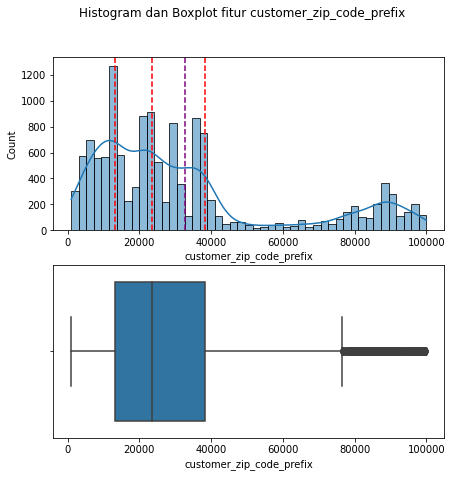

Metrik statistik dasar
count    13645.000000
mean     32591.244632
std      26926.915187
min       1009.000000
25%      13087.000000
50%      23560.000000
75%      38400.000000
max      99970.000000
Name: customer_zip_code_prefix, dtype: float64

Whisker dan Outlier
lower whisker: 1009.0
Upper whisker: 76350.0
Outlier count: 1980
Outlier list:  [89560.0, 91450.0, 96202.0, 87013.0, 89225.0, 98700.0, 78050.0, 78005.0, 82115.0, 85900.0, 85501.0, 89825.0, 80620.0, 89803.0, 98700.0, 78455.0, 88054.0, 90220.0, 93520.0, 80250.0, 97760.0, 95020.0, 80060.0, 91770.0, 91130.0, 96810.0, 95560.0, 95690.0, 80620.0, 81490.0, 83900.0, 95780.0, 78890.0, 80010.0, 88015.0, 91755.0, 88101.0, 98960.0, 97015.0, 95880.0, 80230.0, 79540.0, 80240.0, 82015.0, 90020.0, 88040.0, 82320.0, 89500.0, 95330.0, 84500.0, 89812.0, 80810.0, 80250.0, 89160.0, 89160.0, 89500.0, 93260.0, 81050.0, 76804.0, 88330.0, 98700.0, 88058.0, 84600.0, 97502.0, 85906.0, 87050.0, 82130.0, 91130.0, 77006.0, 86975.0, 98700.0, 78300.0, 8111

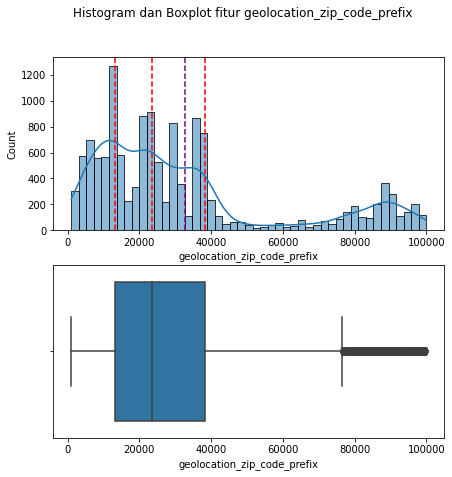

Metrik statistik dasar
count    13645.000000
mean     32591.244632
std      26926.915187
min       1009.000000
25%      13087.000000
50%      23560.000000
75%      38400.000000
max      99970.000000
Name: geolocation_zip_code_prefix, dtype: float64

Whisker dan Outlier
lower whisker: 1009.0
Upper whisker: 76350.0
Outlier count: 1980
Outlier list:  [89560.0, 91450.0, 96202.0, 87013.0, 89225.0, 98700.0, 78050.0, 78005.0, 82115.0, 85900.0, 85501.0, 89825.0, 80620.0, 89803.0, 98700.0, 78455.0, 88054.0, 90220.0, 93520.0, 80250.0, 97760.0, 95020.0, 80060.0, 91770.0, 91130.0, 96810.0, 95560.0, 95690.0, 80620.0, 81490.0, 83900.0, 95780.0, 78890.0, 80010.0, 88015.0, 91755.0, 88101.0, 98960.0, 97015.0, 95880.0, 80230.0, 79540.0, 80240.0, 82015.0, 90020.0, 88040.0, 82320.0, 89500.0, 95330.0, 84500.0, 89812.0, 80810.0, 80250.0, 89160.0, 89160.0, 89500.0, 93260.0, 81050.0, 76804.0, 88330.0, 98700.0, 88058.0, 84600.0, 97502.0, 85906.0, 87050.0, 82130.0, 91130.0, 77006.0, 86975.0, 98700.0, 78300.0, 8

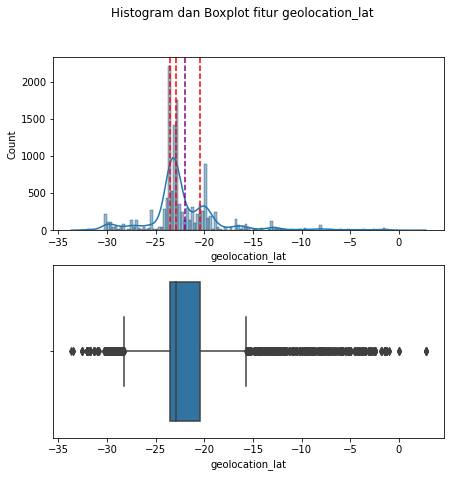

Metrik statistik dasar
count    13645.000000
mean       -21.980551
std          4.261715
min        -33.690729
25%        -23.581554
50%        -22.909804
75%        -20.438593
max          2.816613
Name: geolocation_lat, dtype: float64

Whisker dan Outlier
lower whisker: -28.293151402205805
Upper whisker: -15.74009395475793
Outlier count: 1604
Outlier list:  [-8.982786451748725, -8.183975780074155, -14.247193108742282, -10.934456694725904, -30.042202499999995, -32.05165364422402, -1.2941965718163198, -6.084360495285523, -14.23520702148562, -28.39381391018308, -13.006447198164942, -2.573244675308688, -15.5823819169291, -15.588089790130295, -7.098442938201267, -13.004049520399334, -28.37718387568899, -13.085604481921203, -12.077867684428751, -30.03386842964012, -29.67333648447753, -29.488635134923005, -29.162494308842305, -8.615280733073755, -5.090776844294895, -30.14296083790186, -29.994984923105864, -29.71737704887283, -29.33195174413561, -29.65906814296313, -8.119538392723213, -12.97

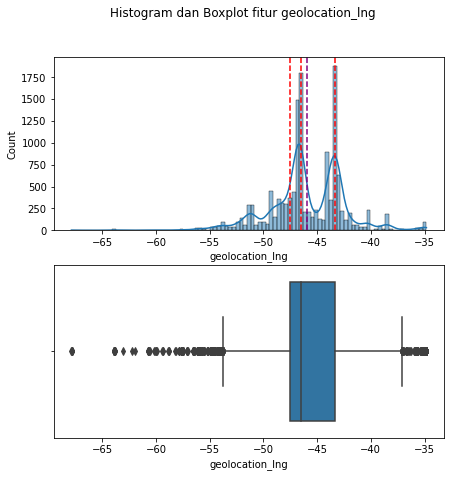

Metrik statistik dasar
count    13645.000000
mean       -45.957749
std          3.547860
min        -67.884719
25%        -47.532049
50%        -46.472190
75%        -43.356660
max        -34.823932
Name: geolocation_lng, dtype: float64

Whisker dan Outlier
lower whisker: -53.78050891145901
Upper whisker: -37.09752376430288
Outlier count: 524
Outlier list:  [-34.92032997579382, -37.06358089829695, -53.92420333364961, -56.05731629438723, -56.09356509014755, -34.83580362839634, -53.92394093671219, -55.907848381096144, -54.6937042783334, -35.29031889341569, -55.72553971540075, -36.6804706378582, -35.16913763904442, -54.66391971021785, -53.81858413988113, -37.06034490423461, -34.89833932070516, -35.24258383542035, -34.91168845268046, -63.89801770038158, -34.83448789754842, -53.84801065762953, -37.04955726908646, -34.92540587870053, -57.0880122175509, -35.24033415167612, -53.89150848665444, -57.493209786067055, -35.73219517208147, -35.70528427814836, -55.23392116976711, -54.874039467592425,

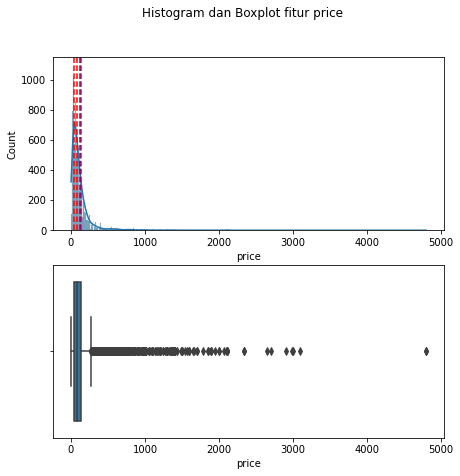

Metrik statistik dasar
count    13645.000000
mean       120.053716
std        183.246923
min          1.200000
25%         39.900000
50%         75.000000
75%        134.000000
max       4799.000000
Name: price, dtype: float64

Whisker dan Outlier
lower whisker: 1.2
Upper whisker: 275.0
Outlier count: 981
Outlier list:  [600.0, 279.99, 349.0, 279.0, 314.97, 299.99, 899.0, 325.0, 659.99, 329.9, 335.0, 498.0, 329.0, 539.0, 599.0, 535.0, 750.0, 667.0, 290.0, 329.9, 295.0, 319.0, 329.99, 285.0, 620.1, 1011.86, 335.0, 289.0, 759.9, 289.0, 335.9, 2649.0, 290.0, 467.0, 349.9, 504.0, 325.49, 385.0, 2110.0, 599.0, 519.99, 539.0, 969.0, 429.9, 339.0, 300.0, 460.0, 362.45, 349.9, 329.0, 288.0, 289.9, 299.0, 399.9, 329.9, 309.99, 539.0, 284.99, 649.9, 399.0, 299.0, 297.0, 419.9, 650.0, 659.99, 419.9, 528.0, 699.9, 279.9, 283.2, 284.99, 350.0, 489.99, 499.9, 2700.0, 458.0, 890.0, 299.9, 412.0, 522.5, 690.0, 510.0, 579.8, 314.99, 499.0, 359.0, 989.1, 1330.0, 1350.0, 2110.0, 341.65, 610.0, 2899.0, 32

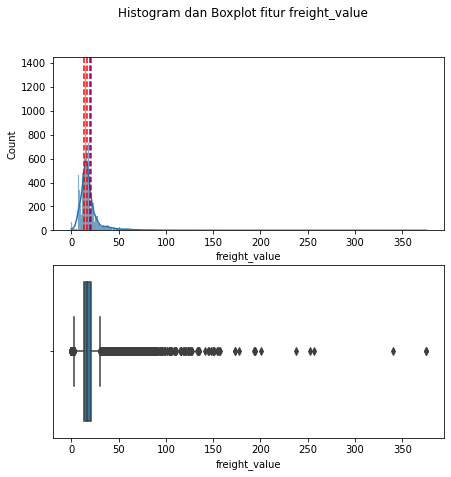

Metrik statistik dasar
count    13645.000000
mean        19.637410
std         15.345108
min          0.000000
25%         13.490000
50%         16.210000
75%         20.430000
max        375.280000
Name: freight_value, dtype: float64

Whisker dan Outlier
lower whisker: 3.09
Upper whisker: 30.84
Outlier count: 1408
Outlier list:  [0.0, 34.46, 256.13, 39.79, 66.63, 40.38, 48.99, 47.43, 50.34, 88.37, 45.44, 31.23, 58.88, 34.04, 35.99, 53.79, 37.37, 67.49, 38.52, 41.58, 84.15, 41.15, 38.53, 64.25, 34.44, 31.96, 60.74, 40.44, 31.79, 43.33, 0.0, 40.34, 90.98, 38.18, 33.09, 37.64, 35.05, 37.38, 36.78, 49.09, 2.7, 31.63, 51.74, 46.48, 52.12, 98.53, 45.09, 34.15, 86.34, 33.33, 32.29, 37.97, 41.33, 34.94, 66.21, 57.08, 33.08, 45.86, 103.22, 0.0, 73.41, 0.0, 37.3, 35.86, 35.67, 35.97, 71.92, 37.44, 45.25, 37.3, 89.36, 41.02, 33.39, 77.8, 141.36, 35.82, 31.0, 69.33, 57.08, 35.38, 45.12, 2.87, 58.78, 69.94, 65.54, 71.92, 34.57, 35.53, 53.83, 39.4, 59.98, 36.6, 39.53, 39.42, 82.07, 34.54, 37.31, 31

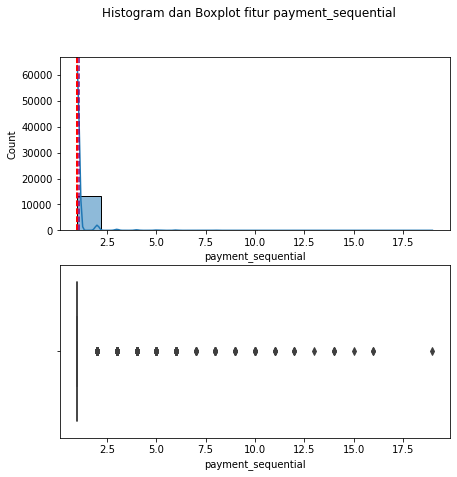

Metrik statistik dasar
count    13644.000000
mean         1.094840
std          0.658019
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         19.000000
Name: payment_sequential, dtype: float64

Whisker dan Outlier
lower whisker: 1.0
Upper whisker: 1.0
Outlier count: 619
Outlier list:  [2.0, 10.0, 2.0, 2.0, 2.0, 2.0, 2.0, 4.0, 2.0, 7.0, 2.0, 4.0, 2.0, 6.0, 2.0, 3.0, 4.0, 2.0, 4.0, 2.0, 2.0, 4.0, 2.0, 3.0, 2.0, 2.0, 4.0, 2.0, 3.0, 2.0, 2.0, 3.0, 2.0, 2.0, 2.0, 3.0, 2.0, 5.0, 2.0, 3.0, 2.0, 2.0, 2.0, 9.0, 8.0, 2.0, 3.0, 19.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 2.0, 3.0, 3.0, 9.0, 4.0, 2.0, 3.0, 2.0, 2.0, 2.0, 2.0, 5.0, 2.0, 6.0, 2.0, 3.0, 2.0, 2.0, 8.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 2.0, 2.0, 2.0, 16.0, 2.0, 3.0, 2.0, 4.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 6.0, 2.0, 4.0, 2.0, 2.0, 2.0, 8.0, 2.0, 2.0, 8.0, 5.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 7.0, 2.0, 3.0, 3.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 3.0, 5.0, 4.0

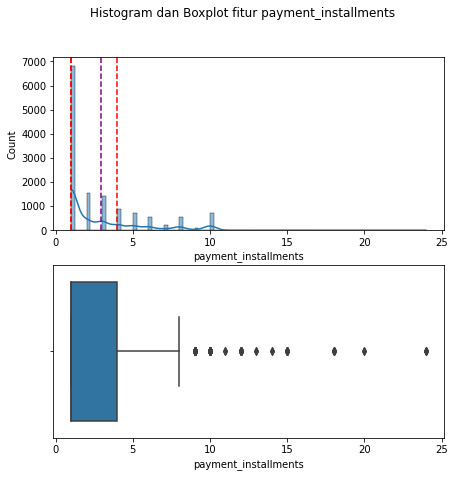

Metrik statistik dasar
count    13644.000000
mean         2.908385
std          2.726770
min          1.000000
25%          1.000000
50%          1.000000
75%          4.000000
max         24.000000
Name: payment_installments, dtype: float64

Whisker dan Outlier
lower whisker: 1.0
Upper whisker: 8.0
Outlier count: 861
Outlier list:  [10.0, 10.0, 10.0, 10.0, 10.0, 24.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 12.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 9.0, 9.0, 10.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 10.0, 10.0, 15.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 10.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10

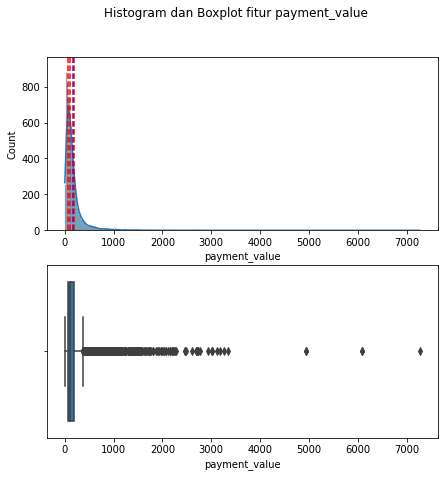

Metrik statistik dasar
count    13644.000000
mean       171.660822
std        250.935781
min          0.010000
25%         61.312500
50%        108.910000
75%        188.520000
max       7274.880000
Name: payment_value, dtype: float64

Whisker dan Outlier
lower whisker: 0.01
Upper whisker: 378.4
Outlier count: 1100
Outlier list:  [856.13, 558.68, 1440.1, 921.05, 676.74, 527.57, 560.65, 1989.75, 503.71, 383.3, 489.24, 465.48, 575.44, 778.05, 687.43, 573.56, 420.88, 580.41, 421.12, 641.18, 464.95, 1036.83, 1006.44, 779.98, 1225.65, 1014.02, 620.68, 2681.29, 1032.35, 484.02, 523.72, 870.35, 413.77, 2213.22, 672.41, 539.88, 610.92, 387.64, 392.86, 990.54, 450.19, 1351.44, 540.06, 385.86, 491.26, 574.26, 870.35, 386.93, 643.16, 465.42, 469.84, 610.92, 3018.6, 410.1, 673.42, 577.54, 416.54, 414.4, 475.2, 940.78, 714.91, 721.74, 888.84, 468.0, 421.47, 430.09, 543.83, 712.05, 404.04, 470.38, 769.08, 3018.6, 413.84, 412.2, 574.51, 526.78, 445.6, 2734.66, 471.33, 838.97, 381.69, 487.38, 425.46, 

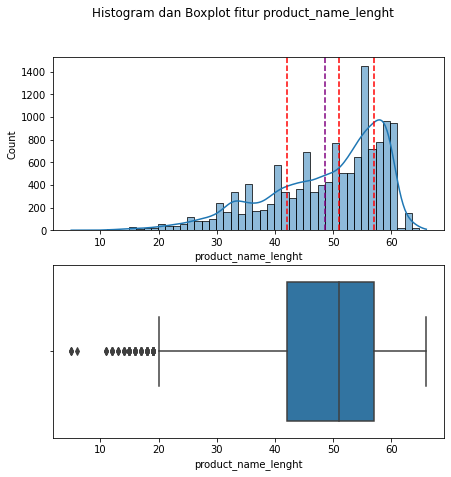

Metrik statistik dasar
count    13453.000000
mean        48.650338
std         10.042184
min          5.000000
25%         42.000000
50%         51.000000
75%         57.000000
max         66.000000
Name: product_name_lenght, dtype: float64

Whisker dan Outlier
lower whisker: 20.0
Upper whisker: 66.0
Outlier count: 107
Outlier list:  [15.0, 12.0, 19.0, 19.0, 19.0, 12.0, 14.0, 5.0, 18.0, 14.0, 17.0, 19.0, 19.0, 18.0, 15.0, 19.0, 19.0, 19.0, 14.0, 12.0, 15.0, 18.0, 14.0, 18.0, 16.0, 12.0, 16.0, 17.0, 18.0, 15.0, 14.0, 5.0, 16.0, 18.0, 16.0, 16.0, 19.0, 13.0, 19.0, 15.0, 18.0, 19.0, 19.0, 19.0, 18.0, 17.0, 12.0, 15.0, 19.0, 15.0, 19.0, 17.0, 16.0, 16.0, 18.0, 16.0, 18.0, 18.0, 17.0, 18.0, 19.0, 11.0, 15.0, 15.0, 15.0, 12.0, 12.0, 17.0, 16.0, 5.0, 15.0, 19.0, 19.0, 18.0, 18.0, 17.0, 16.0, 19.0, 13.0, 17.0, 13.0, 19.0, 15.0, 11.0, 12.0, 19.0, 11.0, 16.0, 19.0, 18.0, 14.0, 15.0, 16.0, 15.0, 15.0, 18.0, 15.0, 14.0, 17.0, 19.0, 16.0, 17.0, 6.0, 15.0, 18.0, 16.0, 19.0]

Skew dan Skew test
Data 

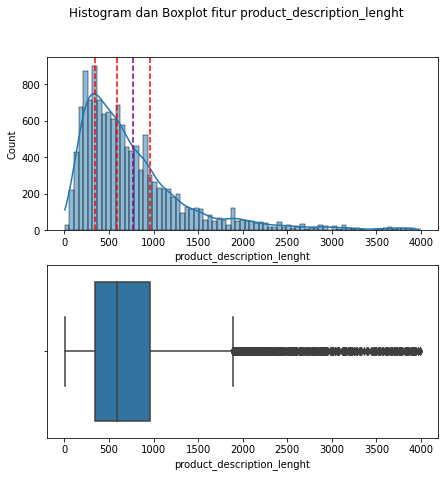

Metrik statistik dasar
count    13453.000000
mean       769.392329
std        636.565672
min          4.000000
25%        340.000000
50%        594.000000
75%        959.000000
max       3988.000000
Name: product_description_lenght, dtype: float64

Whisker dan Outlier
lower whisker: 4.0
Upper whisker: 1887.0
Outlier count: 943
Outlier list:  [1892.0, 3723.0, 1893.0, 2556.0, 1976.0, 1994.0, 2795.0, 1893.0, 3675.0, 2022.0, 2148.0, 3616.0, 2644.0, 2526.0, 2009.0, 2214.0, 1941.0, 2130.0, 2951.0, 3751.0, 3231.0, 3694.0, 3077.0, 2162.0, 2584.0, 1912.0, 2125.0, 1914.0, 3728.0, 2715.0, 3930.0, 2124.0, 1976.0, 2876.0, 1953.0, 1893.0, 2214.0, 2017.0, 1959.0, 2819.0, 2676.0, 3207.0, 1917.0, 2020.0, 1979.0, 2911.0, 3189.0, 3329.0, 3866.0, 2088.0, 2026.0, 1893.0, 2667.0, 1893.0, 2582.0, 2112.0, 1972.0, 2018.0, 2416.0, 2066.0, 3314.0, 2083.0, 2936.0, 2304.0, 2667.0, 2654.0, 2168.0, 1974.0, 1893.0, 1893.0, 2526.0, 3060.0, 2887.0, 3571.0, 3703.0, 2432.0, 2164.0, 2400.0, 1953.0, 2596.0, 2245.0, 1912.0,

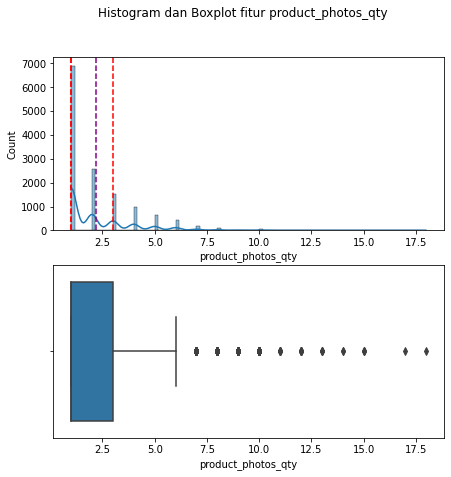

Metrik statistik dasar
count    13453.000000
mean         2.186575
std          1.714097
min          1.000000
25%          1.000000
50%          1.000000
75%          3.000000
max         18.000000
Name: product_photos_qty, dtype: float64

Whisker dan Outlier
lower whisker: 1.0
Upper whisker: 6.0
Outlier count: 367
Outlier list:  [8.0, 7.0, 7.0, 7.0, 9.0, 7.0, 7.0, 9.0, 8.0, 9.0, 8.0, 7.0, 8.0, 8.0, 10.0, 9.0, 7.0, 7.0, 8.0, 13.0, 8.0, 7.0, 8.0, 8.0, 9.0, 7.0, 10.0, 7.0, 7.0, 7.0, 7.0, 9.0, 8.0, 8.0, 7.0, 7.0, 10.0, 7.0, 7.0, 7.0, 7.0, 7.0, 10.0, 7.0, 8.0, 7.0, 7.0, 9.0, 13.0, 11.0, 8.0, 7.0, 7.0, 8.0, 7.0, 9.0, 7.0, 9.0, 7.0, 10.0, 15.0, 14.0, 9.0, 7.0, 13.0, 10.0, 8.0, 13.0, 7.0, 8.0, 7.0, 7.0, 7.0, 17.0, 7.0, 7.0, 8.0, 7.0, 7.0, 7.0, 7.0, 11.0, 10.0, 7.0, 7.0, 7.0, 10.0, 8.0, 8.0, 7.0, 7.0, 7.0, 8.0, 7.0, 10.0, 9.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 9.0, 7.0, 8.0, 7.0, 8.0, 7.0, 8.0, 7.0, 7.0, 7.0, 7.0, 8.0, 9.0, 8.0, 7.0, 10.0, 12.0, 7.0, 7.0, 8.0, 8.0, 7.0, 8.0, 18.0, 9.0, 10.0,

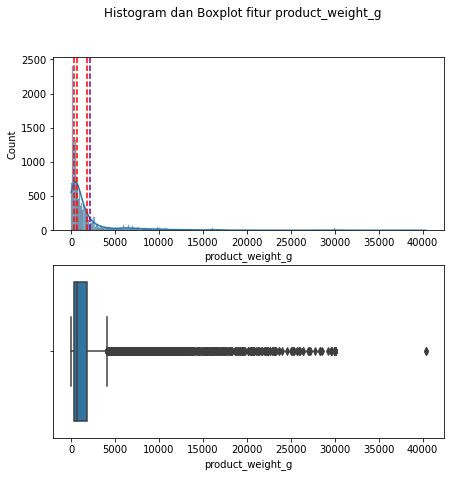

Metrik statistik dasar
count    13640.000000
mean      2118.841789
std       3773.584894
min          2.000000
25%        300.000000
50%        700.000000
75%       1813.000000
max      40425.000000
Name: product_weight_g, dtype: float64

Whisker dan Outlier
lower whisker: 2.0
Upper whisker: 4075.0
Outlier count: 1924
Outlier list:  [5650.0, 5000.0, 29700.0, 9000.0, 16650.0, 6550.0, 6950.0, 8250.0, 12250.0, 12250.0, 9350.0, 5650.0, 5950.0, 6400.0, 7000.0, 15100.0, 5000.0, 9700.0, 5350.0, 7000.0, 5850.0, 5650.0, 6800.0, 4100.0, 8950.0, 25250.0, 6700.0, 13300.0, 10750.0, 16250.0, 5400.0, 9400.0, 9650.0, 18650.0, 7000.0, 8200.0, 5700.0, 22100.0, 9225.0, 9625.0, 9750.0, 5417.0, 4105.0, 8450.0, 5550.0, 4338.0, 10300.0, 5950.0, 7350.0, 12250.0, 9200.0, 8500.0, 13800.0, 13600.0, 9750.0, 4100.0, 9300.0, 8700.0, 9750.0, 4800.0, 4750.0, 10250.0, 10150.0, 9750.0, 16100.0, 4338.0, 20600.0, 5950.0, 10600.0, 4100.0, 22350.0, 19800.0, 10075.0, 7050.0, 4800.0, 7200.0, 8875.0, 7225.0, 16650.0, 8683.0, 

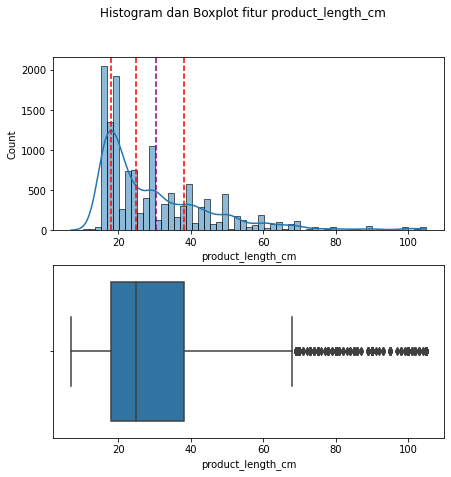

Metrik statistik dasar
count    13640.000000
mean        30.429545
std         16.406090
min          7.000000
25%         18.000000
50%         25.000000
75%         38.000000
max        105.000000
Name: product_length_cm, dtype: float64

Whisker dan Outlier
lower whisker: 7.0
Upper whisker: 68.0
Outlier count: 481
Outlier list:  [105.0, 105.0, 80.0, 75.0, 86.0, 100.0, 70.0, 105.0, 89.0, 78.0, 101.0, 69.0, 86.0, 69.0, 80.0, 70.0, 70.0, 71.0, 74.0, 95.0, 105.0, 80.0, 102.0, 98.0, 90.0, 75.0, 95.0, 81.0, 89.0, 69.0, 80.0, 105.0, 103.0, 69.0, 98.0, 70.0, 105.0, 90.0, 70.0, 80.0, 86.0, 69.0, 90.0, 70.0, 80.0, 105.0, 103.0, 70.0, 78.0, 69.0, 92.0, 95.0, 69.0, 80.0, 86.0, 69.0, 70.0, 101.0, 90.0, 99.0, 75.0, 100.0, 90.0, 105.0, 102.0, 70.0, 105.0, 103.0, 89.0, 74.0, 90.0, 74.0, 78.0, 86.0, 100.0, 70.0, 75.0, 101.0, 100.0, 80.0, 79.0, 100.0, 90.0, 104.0, 69.0, 105.0, 70.0, 81.0, 69.0, 81.0, 85.0, 69.0, 75.0, 90.0, 73.0, 93.0, 85.0, 102.0, 85.0, 70.0, 71.0, 80.0, 80.0, 105.0, 84.0, 75.0, 93.0

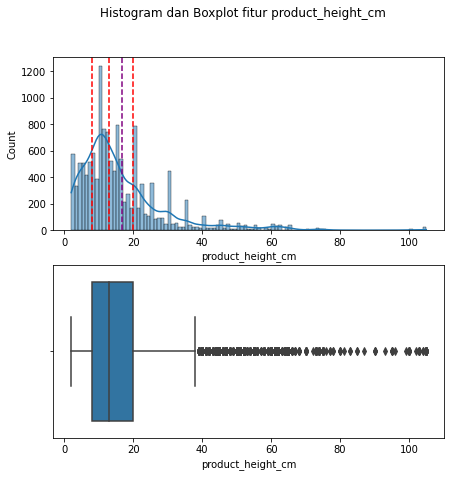

Metrik statistik dasar
count    13640.000000
mean        16.728959
std         13.608740
min          2.000000
25%          8.000000
50%         13.000000
75%         20.000000
max        105.000000
Name: product_height_cm, dtype: float64

Whisker dan Outlier
lower whisker: 2.0
Upper whisker: 38.0
Outlier count: 944
Outlier list:  [61.0, 50.0, 47.0, 40.0, 50.0, 40.0, 41.0, 43.0, 44.0, 40.0, 61.0, 53.0, 55.0, 50.0, 60.0, 45.0, 47.0, 55.0, 61.0, 52.0, 50.0, 40.0, 42.0, 49.0, 45.0, 62.0, 52.0, 60.0, 74.0, 60.0, 40.0, 63.0, 50.0, 48.0, 55.0, 65.0, 52.0, 40.0, 74.0, 40.0, 45.0, 64.0, 62.0, 63.0, 52.0, 103.0, 58.0, 64.0, 40.0, 45.0, 50.0, 47.0, 105.0, 40.0, 65.0, 64.0, 55.0, 40.0, 100.0, 105.0, 40.0, 39.0, 60.0, 64.0, 52.0, 40.0, 55.0, 62.0, 46.0, 44.0, 61.0, 60.0, 99.0, 40.0, 39.0, 51.0, 57.0, 65.0, 50.0, 64.0, 46.0, 56.0, 50.0, 95.0, 80.0, 47.0, 61.0, 60.0, 44.0, 43.0, 64.0, 51.0, 42.0, 75.0, 50.0, 40.0, 65.0, 65.0, 44.0, 39.0, 40.0, 62.0, 45.0, 60.0, 100.0, 75.0, 40.0, 40.0, 40.0, 48.0, 1

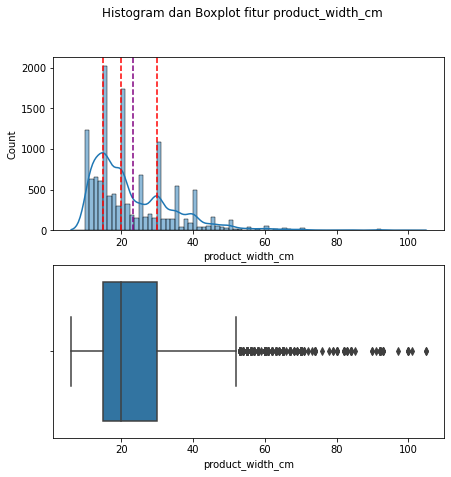

Metrik statistik dasar
count    13640.000000
mean        23.144941
std         11.739437
min          6.000000
25%         15.000000
50%         20.000000
75%         30.000000
max        105.000000
Name: product_width_cm, dtype: float64

Whisker dan Outlier
lower whisker: 6.0
Upper whisker: 52.0
Outlier count: 317
Outlier list:  [82.0, 92.0, 70.0, 91.0, 70.0, 74.0, 67.0, 80.0, 70.0, 53.0, 60.0, 53.0, 71.0, 65.0, 74.0, 61.0, 60.0, 92.0, 61.0, 82.0, 60.0, 83.0, 61.0, 80.0, 53.0, 55.0, 70.0, 70.0, 60.0, 55.0, 78.0, 60.0, 62.0, 55.0, 60.0, 53.0, 63.0, 58.0, 55.0, 70.0, 56.0, 65.0, 55.0, 92.0, 65.0, 53.0, 74.0, 63.0, 60.0, 63.0, 69.0, 92.0, 55.0, 60.0, 65.0, 83.0, 85.0, 61.0, 93.0, 68.0, 58.0, 56.0, 67.0, 72.0, 61.0, 71.0, 60.0, 79.0, 53.0, 65.0, 84.0, 97.0, 93.0, 74.0, 58.0, 92.0, 70.0, 53.0, 53.0, 65.0, 55.0, 55.0, 67.0, 60.0, 55.0, 70.0, 74.0, 92.0, 67.0, 65.0, 90.0, 63.0, 63.0, 100.0, 57.0, 58.0, 65.0, 70.0, 53.0, 55.0, 56.0, 65.0, 54.0, 105.0, 70.0, 70.0, 65.0, 66.0, 69.0, 54.0, 67.0,

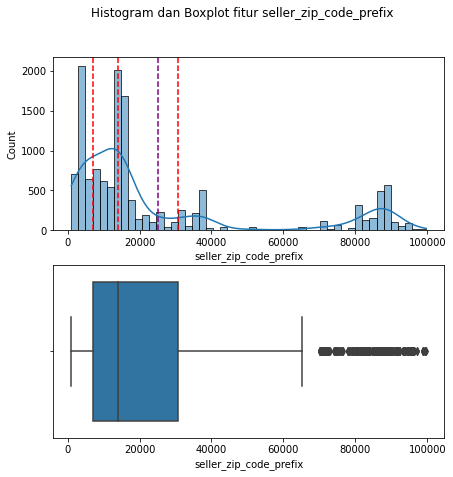

Metrik statistik dasar
count    13645.000000
mean     25186.739758
std      28124.998800
min       1001.000000
25%       7013.000000
50%      13920.000000
75%      30710.000000
max      99730.000000
Name: seller_zip_code_prefix, dtype: float64

Whisker dan Outlier
lower whisker: 1001.0
Upper whisker: 65072.0
Outlier count: 2176
Outlier list:  [71070.0, 85200.0, 88301.0, 87230.0, 88085.0, 88359.0, 80610.0, 86600.0, 87025.0, 85802.0, 88359.0, 86050.0, 87083.0, 88820.0, 85802.0, 70235.0, 70235.0, 80740.0, 87900.0, 85851.0, 71691.0, 81770.0, 86706.0, 74930.0, 86065.0, 70740.0, 71691.0, 87030.0, 89217.0, 89204.0, 87015.0, 87025.0, 83050.0, 78020.0, 80330.0, 83323.0, 89204.0, 83324.0, 85807.0, 80610.0, 87114.0, 87030.0, 89023.0, 87025.0, 80330.0, 88730.0, 79107.0, 72460.0, 82400.0, 81020.0, 80610.0, 95995.0, 83323.0, 88301.0, 82560.0, 85802.0, 85807.0, 80610.0, 88303.0, 89460.0, 87230.0, 87030.0, 80310.0, 80310.0, 80330.0, 92030.0, 87050.0, 80310.0, 90010.0, 88359.0, 86800.0, 85904.0, 87025.

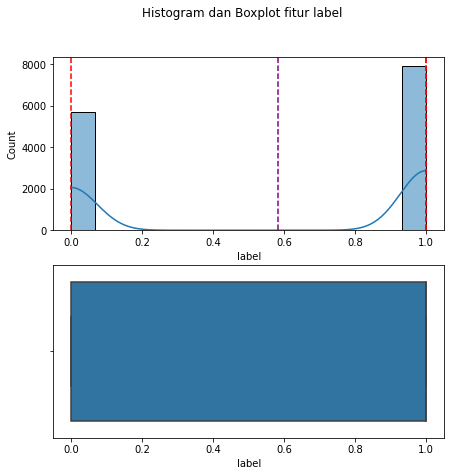

Metrik statistik dasar
count    13645.000000
mean         0.582558
std          0.493155
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: label, dtype: float64

Whisker dan Outlier
lower whisker: 0
Upper whisker: 1
Outlier count: 0
No Outlier

Skew dan Skew test
Data tidak skew
___________________________________________________________________________



In [ ]:
a = 1
for col in devset_dt_num.columns:
  print(a,'|', col )

  # histogram dan boxplot untuk tiap fitur numerik
  fig, axs = plt.subplots(2,1)
  fig.set_size_inches(7,7)

  sns.histplot(data = devset_dt_num, x = col, kde = True, ax = axs[0])
  axs[0].axvline(np.nanpercentile(devset_dt_num[col], 25), c = 'r', linestyle = '--')
  axs[0].axvline(np.nanpercentile(devset_dt_num[col], 50), c = 'r', linestyle = '--')
  axs[0].axvline(np.nanpercentile(devset_dt_num[col], 75), c = 'r', linestyle = '--')
  axs[0].axvline(np.mean(devset_dt_num[col]), color = 'purple', linestyle='--')

  sns.boxplot(data = devset_dt_num, x = col, ax = axs[1])

  fig.suptitle('Histogram dan Boxplot fitur {}'.format(col))
  plt.show()
  
  # metrik statistik dasar dengan describe()
  print('Metrik statistik dasar')
  print(devset_dt_num[col].describe())
  print('')

  # lower whisker, upper whisker, non outlier, outlier
  print('Whisker dan Outlier')
  whisk(devset_dt_num[col])
  print('')

  # Hitung skew
  print('Skew dan Skew test')
  skw = skew(devset_dt_num[col])
  stats, p_value = skewtest(devset_dt_num[col])
  if p_value > 0.05:
    print('Data skewed, dengan skew: {}'.format(skw))
  else:
    print('Data tidak skew')

  print("_" * 75)
  print('')

  a += 1


#### Multivariat Numerik-Numerik

In [ ]:
#devset_dr_num_nl = devset_dr_num.drop(['label'], axis = 1)

1 customer_zip_code_prefix - geolocation_zip_code_prefix


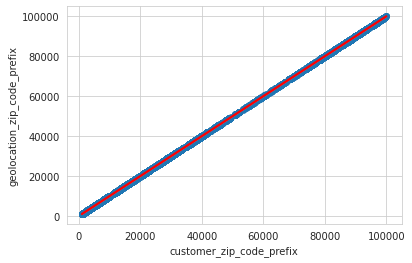

SpearmanrResult(correlation=1.0, pvalue=0.0)
__________________________________________________
2 customer_zip_code_prefix - geolocation_lat


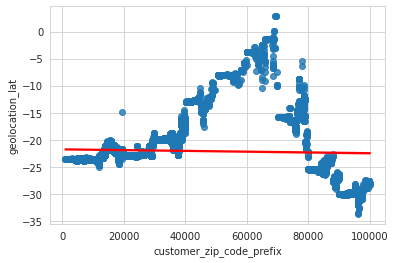

SpearmanrResult(correlation=0.25984416743669375, pvalue=2.0823570244315168e-209)
__________________________________________________
3 customer_zip_code_prefix - geolocation_lng


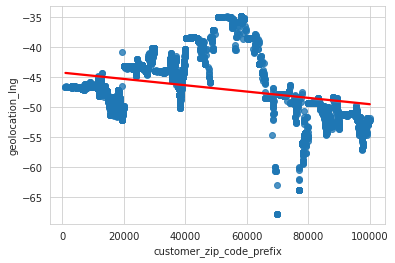

SpearmanrResult(correlation=-0.07993215480085551, pvalue=8.671697985708861e-21)
__________________________________________________
4 customer_zip_code_prefix - price


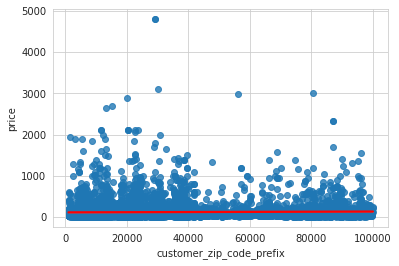

SpearmanrResult(correlation=0.056166204677638214, pvalue=5.187319274145675e-11)
__________________________________________________
5 customer_zip_code_prefix - freight_value


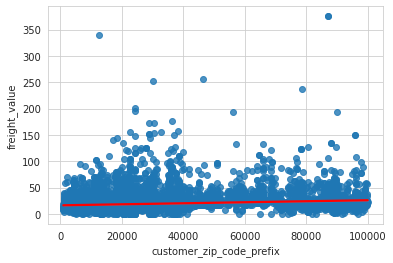

SpearmanrResult(correlation=0.416421040517903, pvalue=0.0)
__________________________________________________
6 customer_zip_code_prefix - payment_sequential


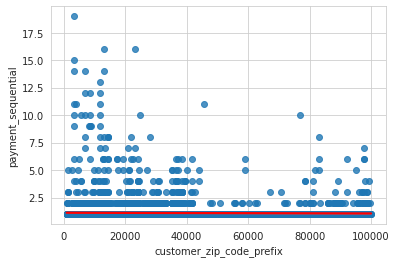

SpearmanrResult(correlation=-0.006435474315222485, pvalue=0.45224451560458223)
__________________________________________________
7 customer_zip_code_prefix - payment_installments


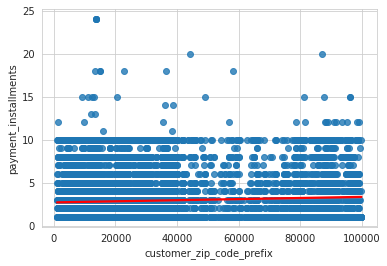

SpearmanrResult(correlation=0.07070892640264771, pvalue=1.3482410442857402e-16)
__________________________________________________
8 customer_zip_code_prefix - payment_value


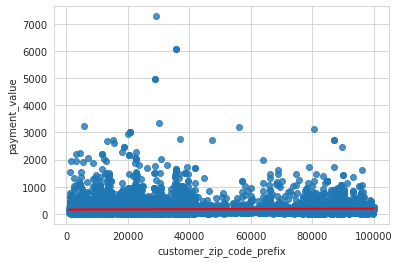

SpearmanrResult(correlation=0.09466940246580395, pvalue=1.5274369099849267e-28)
__________________________________________________
9 customer_zip_code_prefix - product_name_lenght


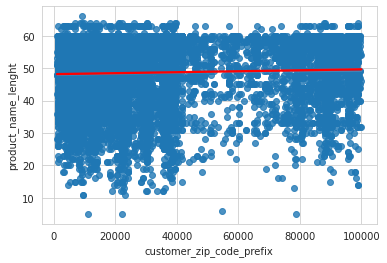

SpearmanrResult(correlation=0.03416354956734203, pvalue=6.565511324145044e-05)
__________________________________________________
10 customer_zip_code_prefix - product_description_lenght


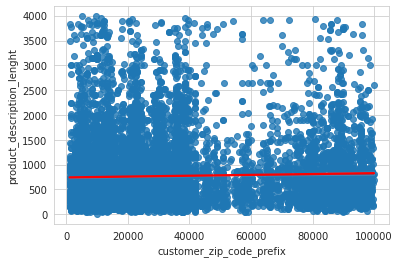

SpearmanrResult(correlation=0.03410615506889718, pvalue=6.753809836690885e-05)
__________________________________________________
11 customer_zip_code_prefix - product_photos_qty


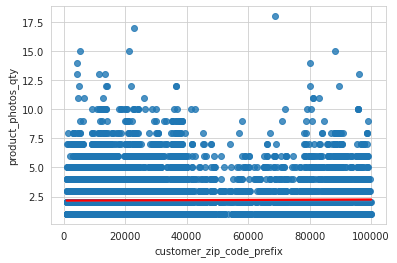

SpearmanrResult(correlation=0.010167657893601929, pvalue=0.2349813988230939)
__________________________________________________
12 customer_zip_code_prefix - product_weight_g


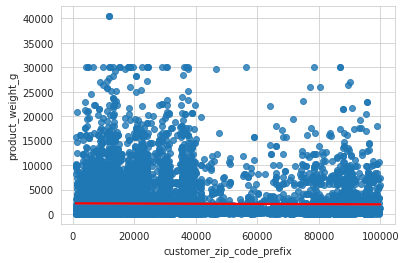

SpearmanrResult(correlation=0.010891435320046211, pvalue=0.20331290295950308)
__________________________________________________
13 customer_zip_code_prefix - product_length_cm


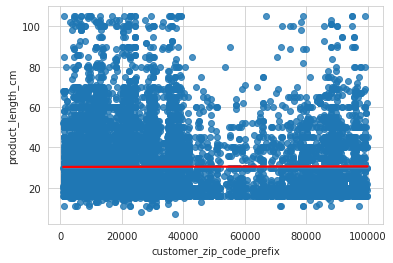

SpearmanrResult(correlation=0.003630840128925853, pvalue=0.6715019531396688)
__________________________________________________
14 customer_zip_code_prefix - product_height_cm


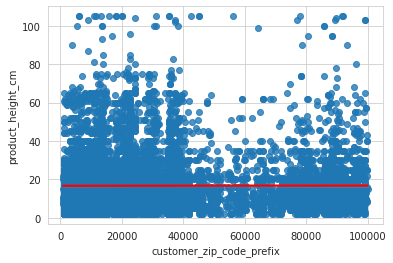

SpearmanrResult(correlation=0.010785004241147702, pvalue=0.20776420518169317)
__________________________________________________
15 customer_zip_code_prefix - product_width_cm


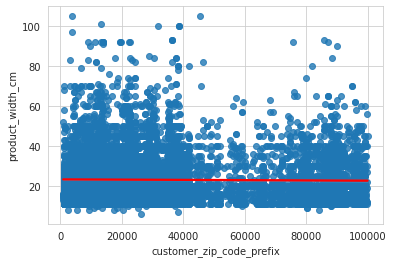

SpearmanrResult(correlation=-0.008547605162319083, pvalue=0.3180912341108969)
__________________________________________________
16 customer_zip_code_prefix - seller_zip_code_prefix


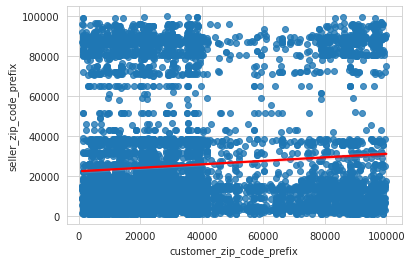

SpearmanrResult(correlation=0.06882360316153062, pvalue=8.400877252320503e-16)
__________________________________________________
17 customer_zip_code_prefix - label


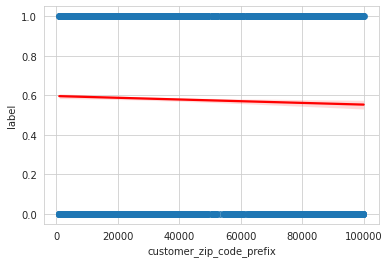

SpearmanrResult(correlation=-0.02927763642941301, pvalue=0.0006253057207693876)
__________________________________________________
18 geolocation_zip_code_prefix - geolocation_lat


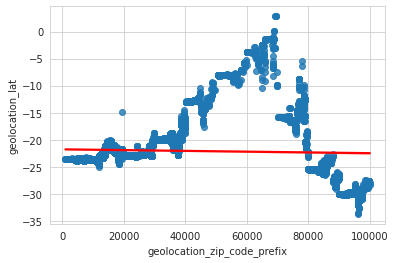

SpearmanrResult(correlation=0.25984416743669375, pvalue=2.0823570244315168e-209)
__________________________________________________
19 geolocation_zip_code_prefix - geolocation_lng


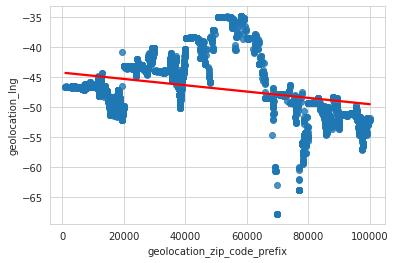

SpearmanrResult(correlation=-0.07993215480085551, pvalue=8.671697985708861e-21)
__________________________________________________
20 geolocation_zip_code_prefix - price


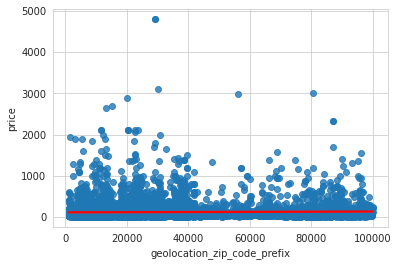

SpearmanrResult(correlation=0.056166204677638214, pvalue=5.187319274145675e-11)
__________________________________________________
21 geolocation_zip_code_prefix - freight_value


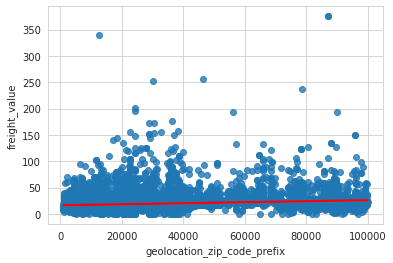

SpearmanrResult(correlation=0.416421040517903, pvalue=0.0)
__________________________________________________
22 geolocation_zip_code_prefix - payment_sequential


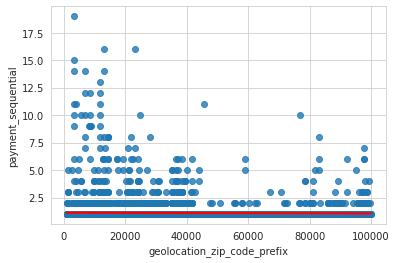

SpearmanrResult(correlation=-0.006435474315222485, pvalue=0.45224451560458223)
__________________________________________________
23 geolocation_zip_code_prefix - payment_installments


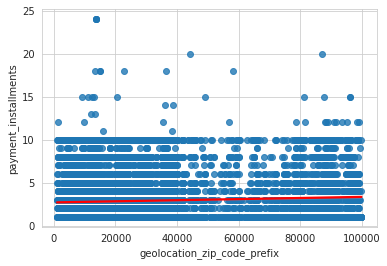

SpearmanrResult(correlation=0.07070892640264771, pvalue=1.3482410442857402e-16)
__________________________________________________
24 geolocation_zip_code_prefix - payment_value


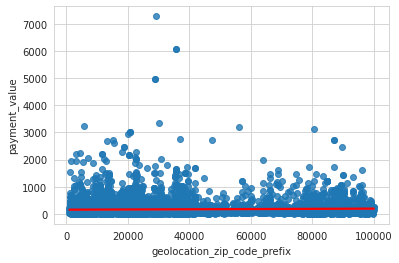

SpearmanrResult(correlation=0.09466940246580395, pvalue=1.5274369099849267e-28)
__________________________________________________
25 geolocation_zip_code_prefix - product_name_lenght


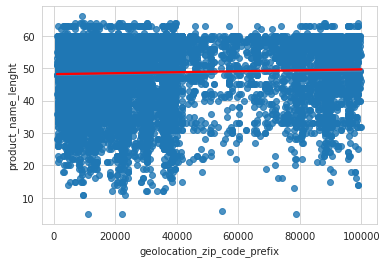

SpearmanrResult(correlation=0.03416354956734203, pvalue=6.565511324145044e-05)
__________________________________________________
26 geolocation_zip_code_prefix - product_description_lenght


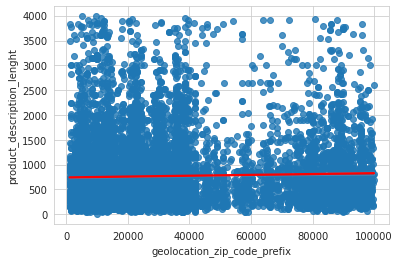

SpearmanrResult(correlation=0.03410615506889718, pvalue=6.753809836690885e-05)
__________________________________________________
27 geolocation_zip_code_prefix - product_photos_qty


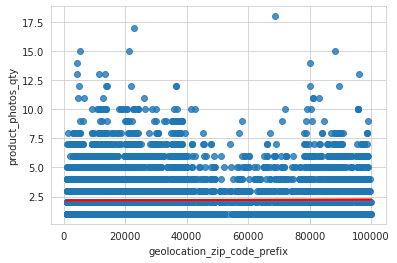

SpearmanrResult(correlation=0.010167657893601929, pvalue=0.2349813988230939)
__________________________________________________
28 geolocation_zip_code_prefix - product_weight_g


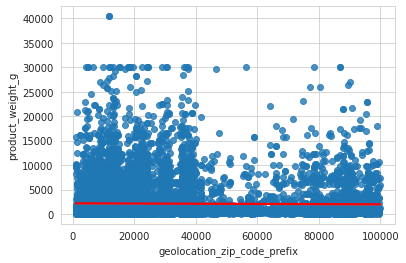

SpearmanrResult(correlation=0.010891435320046211, pvalue=0.20331290295950308)
__________________________________________________
29 geolocation_zip_code_prefix - product_length_cm


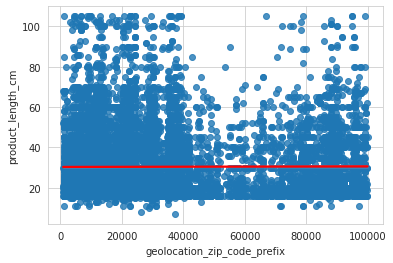

SpearmanrResult(correlation=0.003630840128925853, pvalue=0.6715019531396688)
__________________________________________________
30 geolocation_zip_code_prefix - product_height_cm


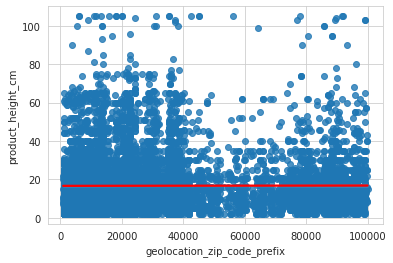

SpearmanrResult(correlation=0.010785004241147702, pvalue=0.20776420518169317)
__________________________________________________
31 geolocation_zip_code_prefix - product_width_cm


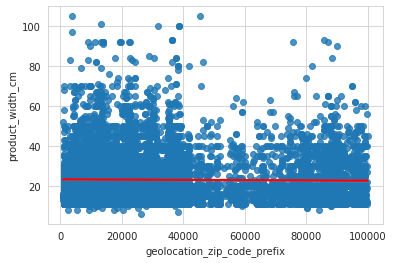

SpearmanrResult(correlation=-0.008547605162319083, pvalue=0.3180912341108969)
__________________________________________________
32 geolocation_zip_code_prefix - seller_zip_code_prefix


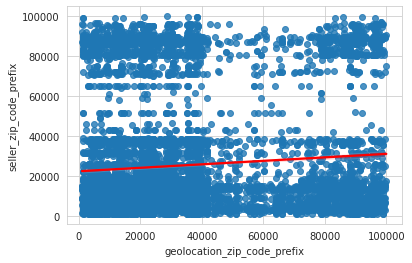

SpearmanrResult(correlation=0.06882360316153062, pvalue=8.400877252320503e-16)
__________________________________________________
33 geolocation_zip_code_prefix - label


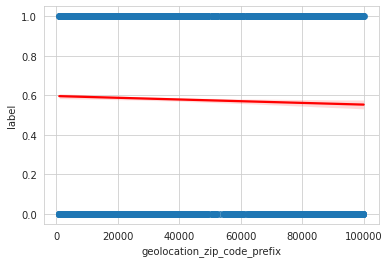

SpearmanrResult(correlation=-0.02927763642941301, pvalue=0.0006253057207693876)
__________________________________________________
34 geolocation_lat - geolocation_lng


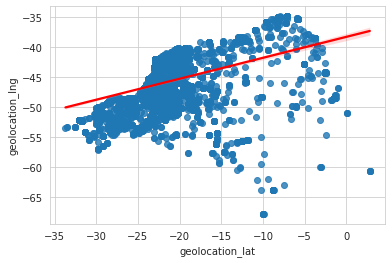

SpearmanrResult(correlation=0.43396598903819816, pvalue=0.0)
__________________________________________________
35 geolocation_lat - price


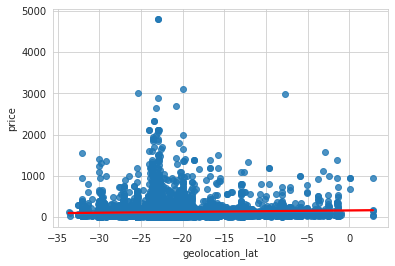

SpearmanrResult(correlation=0.04264811873377138, pvalue=6.240716784510534e-07)
__________________________________________________
36 geolocation_lat - freight_value


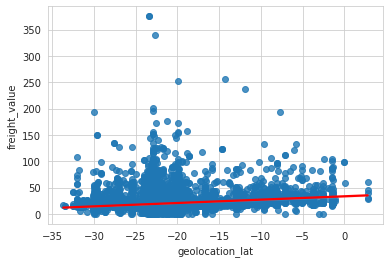

SpearmanrResult(correlation=0.24466567978978035, pvalue=3.7512424371287476e-185)
__________________________________________________
37 geolocation_lat - payment_sequential


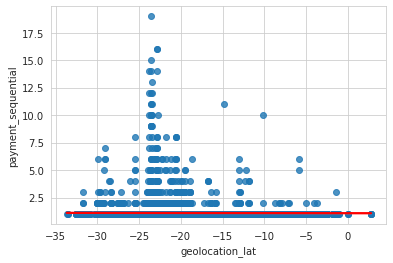

SpearmanrResult(correlation=0.007640707883488206, pvalue=0.3721484535713193)
__________________________________________________
38 geolocation_lat - payment_installments


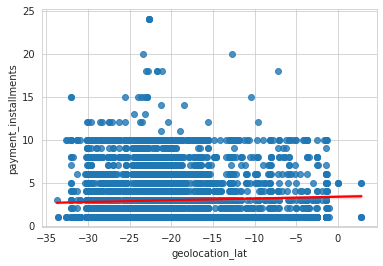

SpearmanrResult(correlation=0.046861940949342505, pvalue=4.337338314868236e-08)
__________________________________________________
39 geolocation_lat - payment_value


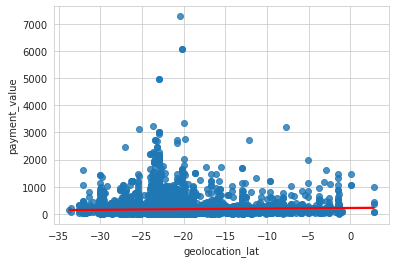

SpearmanrResult(correlation=0.036948077228276026, pvalue=1.5812798492849468e-05)
__________________________________________________
40 geolocation_lat - product_name_lenght


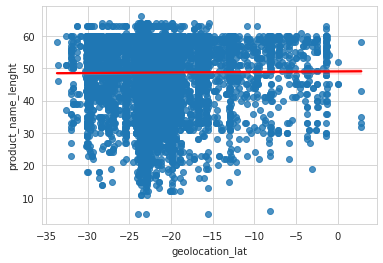

SpearmanrResult(correlation=0.013001236951229138, pvalue=0.12885738701664262)
__________________________________________________
41 geolocation_lat - product_description_lenght


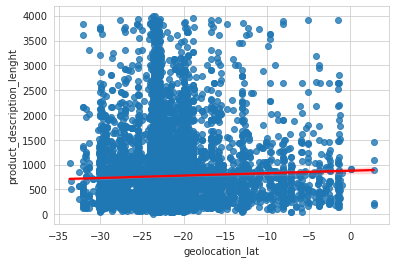

SpearmanrResult(correlation=0.018587008031616316, pvalue=0.029918266114863305)
__________________________________________________
42 geolocation_lat - product_photos_qty


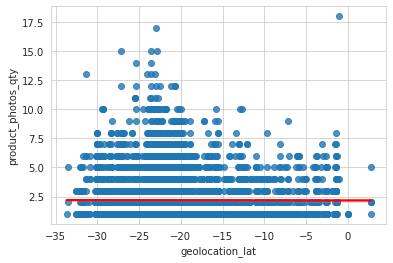

SpearmanrResult(correlation=-0.0015583028135853696, pvalue=0.8555736118127796)
__________________________________________________
43 geolocation_lat - product_weight_g


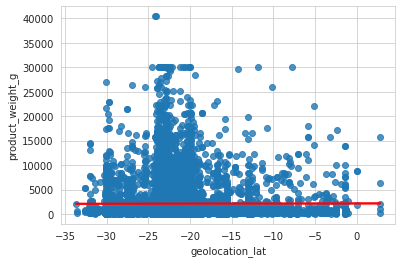

SpearmanrResult(correlation=0.005057888108965846, pvalue=0.5546740431489614)
__________________________________________________
44 geolocation_lat - product_length_cm


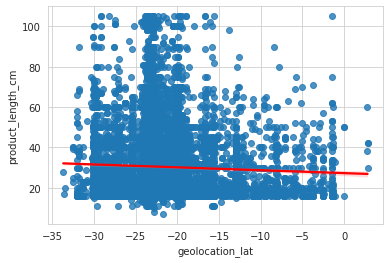

SpearmanrResult(correlation=-0.030003661075711247, pvalue=0.00045617854187193557)
__________________________________________________
45 geolocation_lat - product_height_cm


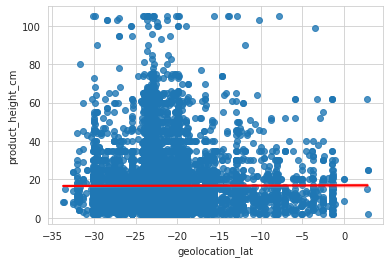

SpearmanrResult(correlation=0.006077903913852749, pvalue=0.4777583993767126)
__________________________________________________
46 geolocation_lat - product_width_cm


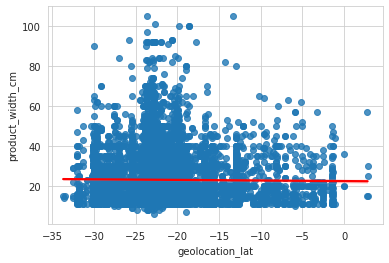

SpearmanrResult(correlation=-0.0009646545581007695, pvalue=0.9102900041700799)
__________________________________________________
47 geolocation_lat - seller_zip_code_prefix


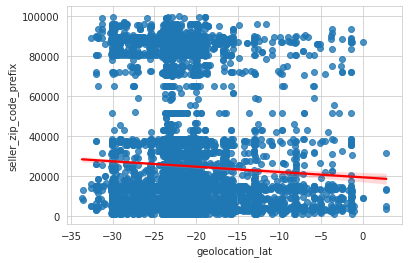

SpearmanrResult(correlation=0.006818423028496126, pvalue=0.42579454893012425)
__________________________________________________
48 geolocation_lat - label


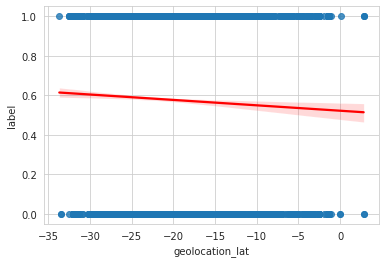

SpearmanrResult(correlation=-0.027818664587058586, pvalue=0.0011545376148892812)
__________________________________________________
49 geolocation_lng - price


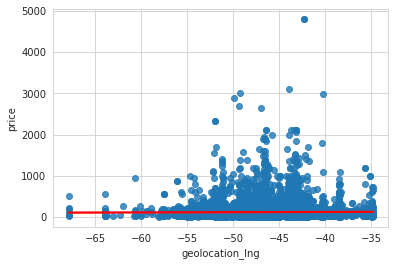

SpearmanrResult(correlation=0.021153907881185048, pvalue=0.013470701088547208)
__________________________________________________
50 geolocation_lng - freight_value


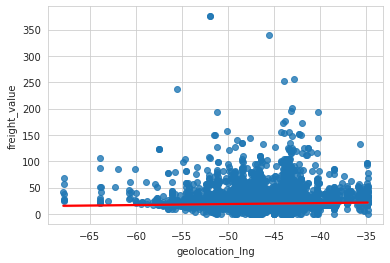

SpearmanrResult(correlation=0.14090702780655542, pvalue=1.8689531181510042e-61)
__________________________________________________
51 geolocation_lng - payment_sequential


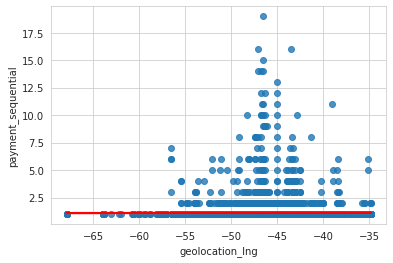

SpearmanrResult(correlation=0.005316530900396229, pvalue=0.5346120489041826)
__________________________________________________
52 geolocation_lng - payment_installments


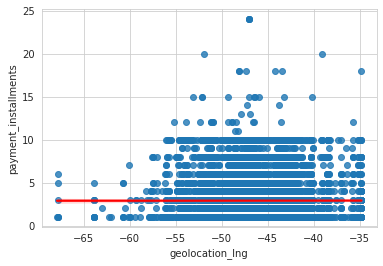

SpearmanrResult(correlation=0.008664014198805105, pvalue=0.31154498947455633)
__________________________________________________
53 geolocation_lng - payment_value


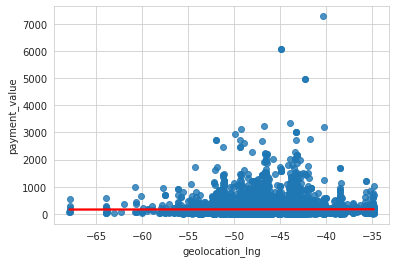

SpearmanrResult(correlation=0.015315911782800475, pvalue=0.07361151940692118)
__________________________________________________
54 geolocation_lng - product_name_lenght


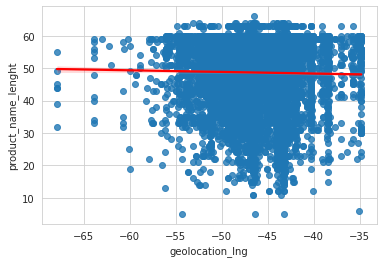

SpearmanrResult(correlation=-0.023335241124690875, pvalue=0.006411607091969282)
__________________________________________________
55 geolocation_lng - product_description_lenght


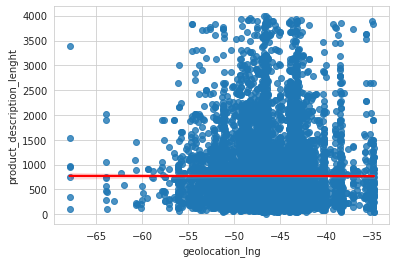

SpearmanrResult(correlation=-0.009742376913232757, pvalue=0.2551424177728713)
__________________________________________________
56 geolocation_lng - product_photos_qty


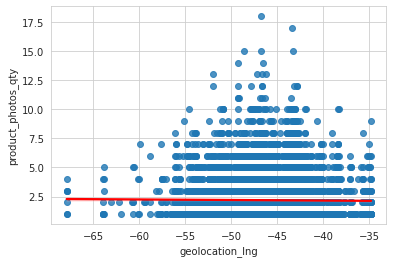

SpearmanrResult(correlation=0.00018837049099074946, pvalue=0.9824464533195232)
__________________________________________________
57 geolocation_lng - product_weight_g


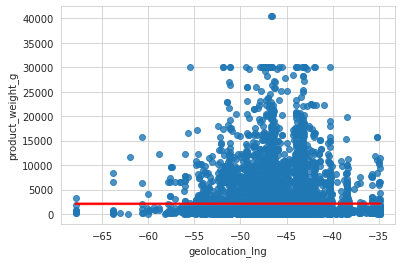

SpearmanrResult(correlation=0.00475846371572946, pvalue=0.5783496334065983)
__________________________________________________
58 geolocation_lng - product_length_cm


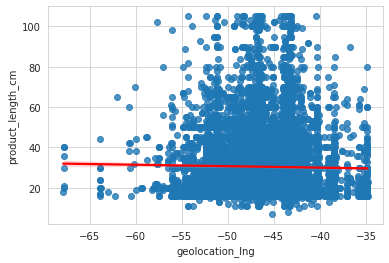

SpearmanrResult(correlation=-0.012912909715999153, pvalue=0.13147645704982708)
__________________________________________________
59 geolocation_lng - product_height_cm


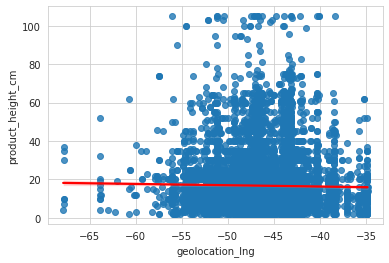

SpearmanrResult(correlation=-0.009190818474541132, pvalue=0.28303764643339974)
__________________________________________________
60 geolocation_lng - product_width_cm


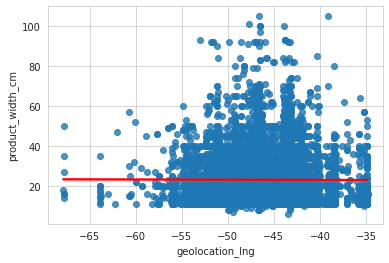

SpearmanrResult(correlation=-0.00020524972754509815, pvalue=0.9808738288191836)
__________________________________________________
61 geolocation_lng - seller_zip_code_prefix


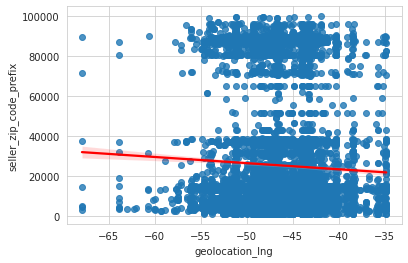

SpearmanrResult(correlation=0.005565643377974503, pvalue=0.5156415965192026)
__________________________________________________
62 geolocation_lng - label


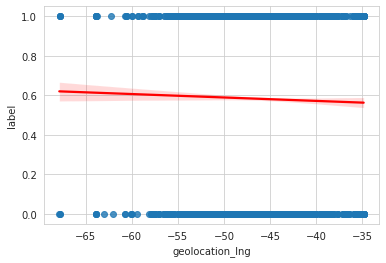

SpearmanrResult(correlation=-0.015225029085216253, pvalue=0.0753376230270133)
__________________________________________________
63 price - freight_value


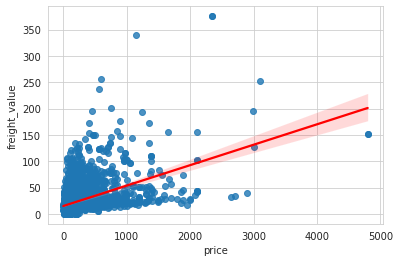

SpearmanrResult(correlation=0.4351646616346554, pvalue=0.0)
__________________________________________________
64 price - payment_sequential


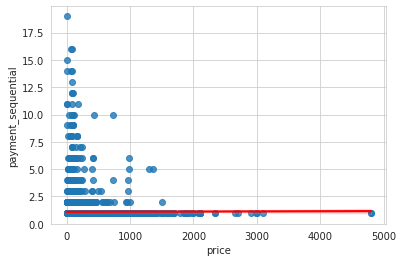

SpearmanrResult(correlation=-0.0038025368845875794, pvalue=0.6569398169377377)
__________________________________________________
65 price - payment_installments


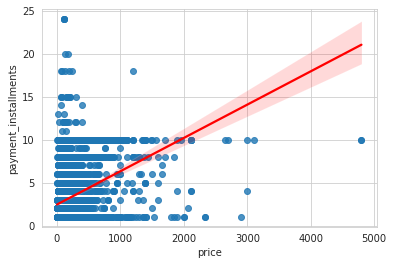

SpearmanrResult(correlation=0.3058649266958491, pvalue=2.2844156003338783e-293)
__________________________________________________
66 price - payment_value


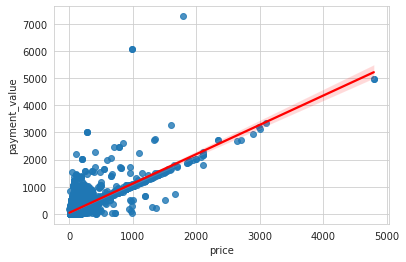

SpearmanrResult(correlation=0.7832125604036239, pvalue=0.0)
__________________________________________________
67 price - product_name_lenght


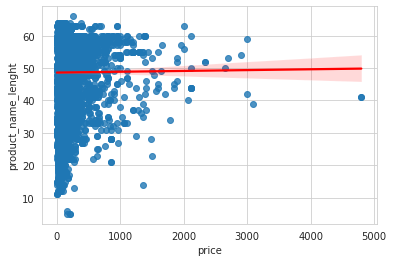

SpearmanrResult(correlation=0.037228109112713625, pvalue=1.3626651816102001e-05)
__________________________________________________
68 price - product_description_lenght


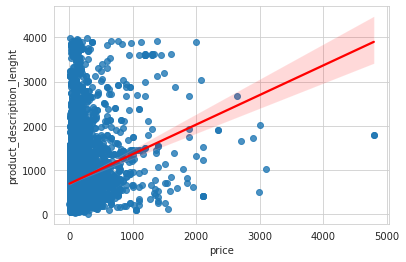

SpearmanrResult(correlation=0.1876931443106641, pvalue=2.046393726710623e-108)
__________________________________________________
69 price - product_photos_qty


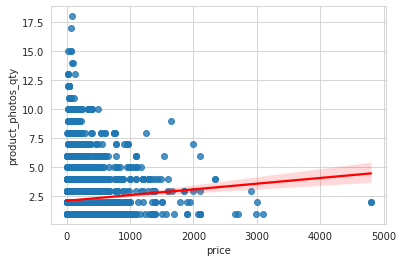

SpearmanrResult(correlation=0.02941821825402636, pvalue=0.0005885770305221669)
__________________________________________________
70 price - product_weight_g


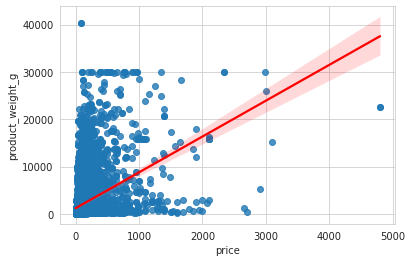

SpearmanrResult(correlation=0.5101753499750726, pvalue=0.0)
__________________________________________________
71 price - product_length_cm


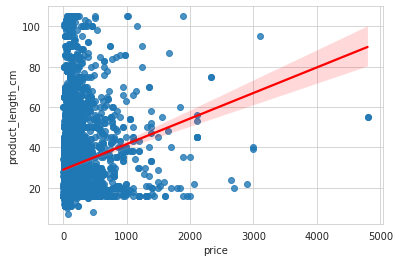

SpearmanrResult(correlation=0.27315865406795026, pvalue=4.6154808737644714e-232)
__________________________________________________
72 price - product_height_cm


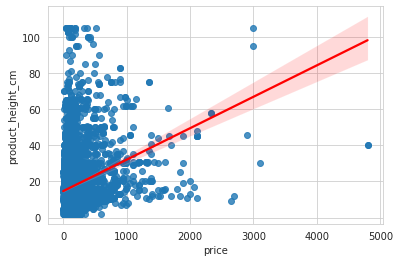

SpearmanrResult(correlation=0.3269119411893339, pvalue=0.0)
__________________________________________________
73 price - product_width_cm


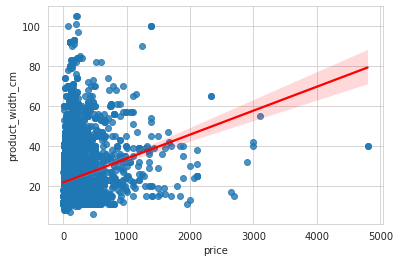

SpearmanrResult(correlation=0.2738363087563287, pvalue=2.993813336782297e-233)
__________________________________________________
74 price - seller_zip_code_prefix


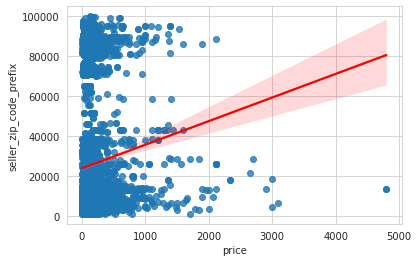

SpearmanrResult(correlation=0.16768994300143666, pvalue=1.2846593984434997e-86)
__________________________________________________
75 price - label


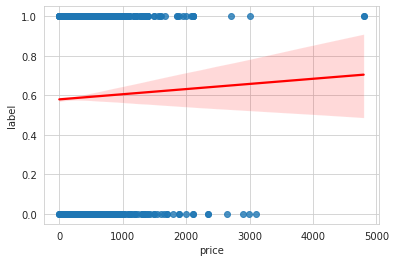

SpearmanrResult(correlation=0.004166626288968311, pvalue=0.6264931294491893)
__________________________________________________
76 freight_value - payment_sequential


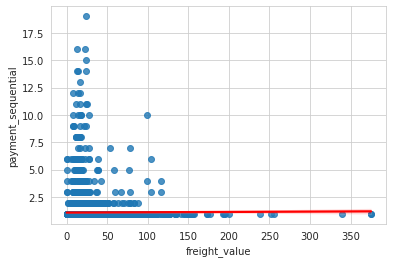

SpearmanrResult(correlation=0.017831174979399997, pvalue=0.03726337905478349)
__________________________________________________
77 freight_value - payment_installments


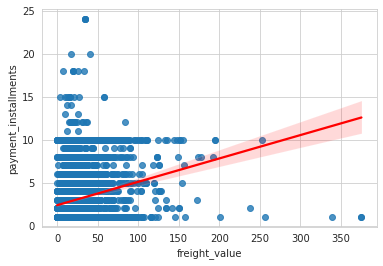

SpearmanrResult(correlation=0.16802396072410658, pvalue=5.835715613675116e-87)
__________________________________________________
78 freight_value - payment_value


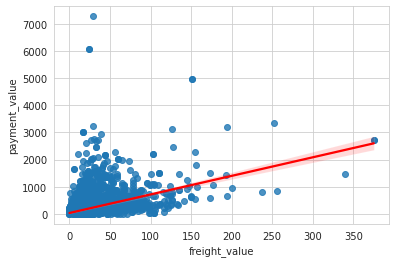

SpearmanrResult(correlation=0.43013249235770173, pvalue=0.0)
__________________________________________________
79 freight_value - product_name_lenght


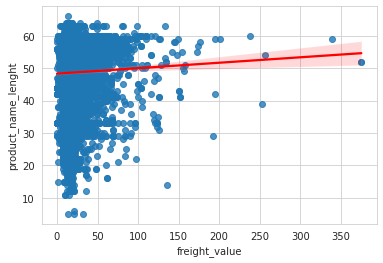

SpearmanrResult(correlation=0.04026870834325562, pvalue=2.5344522554596074e-06)
__________________________________________________
80 freight_value - product_description_lenght


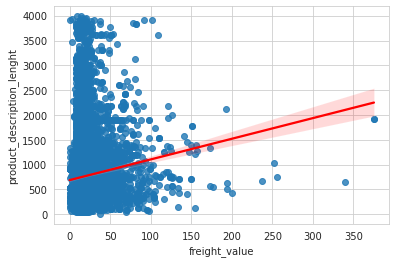

SpearmanrResult(correlation=0.10394667922604987, pvalue=4.271981037840312e-34)
__________________________________________________
81 freight_value - product_photos_qty


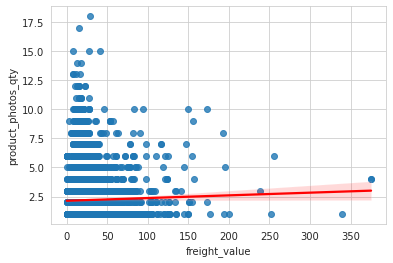

SpearmanrResult(correlation=-0.006576280173023836, pvalue=0.44241283716286406)
__________________________________________________
82 freight_value - product_weight_g


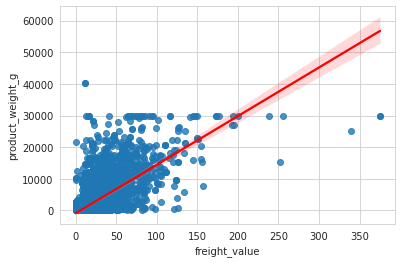

SpearmanrResult(correlation=0.4701273676339788, pvalue=0.0)
__________________________________________________
83 freight_value - product_length_cm


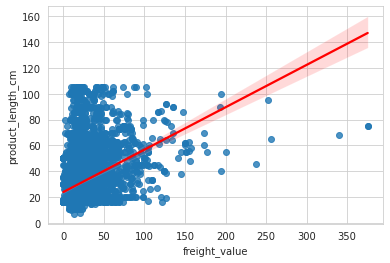

SpearmanrResult(correlation=0.2947315111665094, pvalue=1.4084751646179406e-271)
__________________________________________________
84 freight_value - product_height_cm


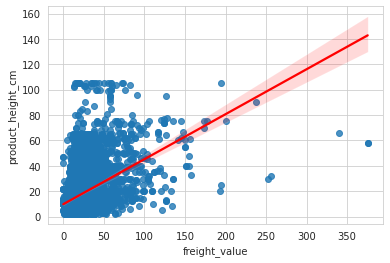

SpearmanrResult(correlation=0.30830511341030065, pvalue=2.838626123710191e-298)
__________________________________________________
85 freight_value - product_width_cm


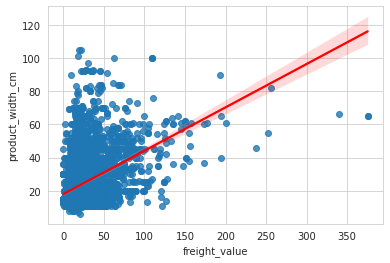

SpearmanrResult(correlation=0.29100846776603684, pvalue=1.663152274000404e-264)
__________________________________________________
86 freight_value - seller_zip_code_prefix


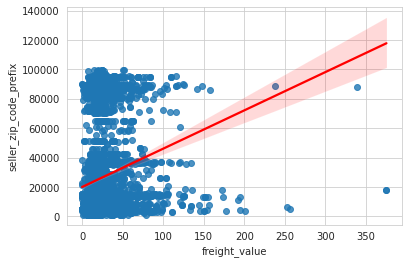

SpearmanrResult(correlation=0.2548137381622998, pvalue=3.474213155759569e-201)
__________________________________________________
87 freight_value - label


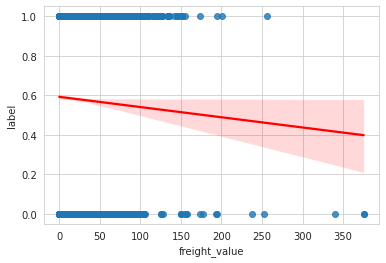

SpearmanrResult(correlation=-0.03400706134154622, pvalue=7.090995889529203e-05)
__________________________________________________
88 payment_sequential - payment_installments


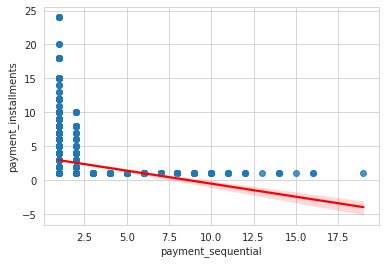

SpearmanrResult(correlation=-0.16904209572170312, pvalue=5.212925172007937e-88)
__________________________________________________
89 payment_sequential - payment_value


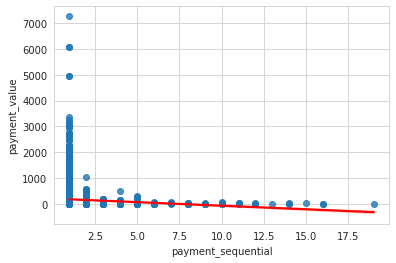

SpearmanrResult(correlation=-0.2033992800085143, pvalue=2.2588267036123008e-127)
__________________________________________________
90 payment_sequential - product_name_lenght


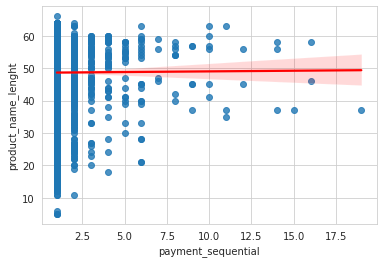

SpearmanrResult(correlation=0.007524917911431979, pvalue=0.37943856428506206)
__________________________________________________
91 payment_sequential - product_description_lenght


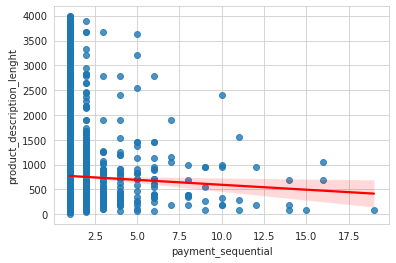

SpearmanrResult(correlation=-0.02900088064207308, pvalue=0.0007039202184557377)
__________________________________________________
92 payment_sequential - product_photos_qty


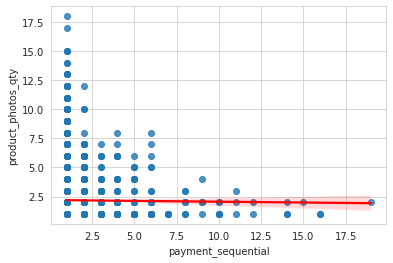

SpearmanrResult(correlation=0.012504232303971711, pvalue=0.14413476230938094)
__________________________________________________
93 payment_sequential - product_weight_g


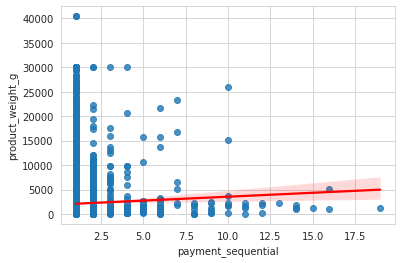

SpearmanrResult(correlation=0.03543434755770435, pvalue=3.471979199066412e-05)
__________________________________________________
94 payment_sequential - product_length_cm


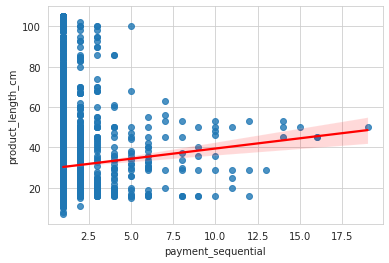

SpearmanrResult(correlation=0.04023355843425246, pvalue=2.586017794612007e-06)
__________________________________________________
95 payment_sequential - product_height_cm


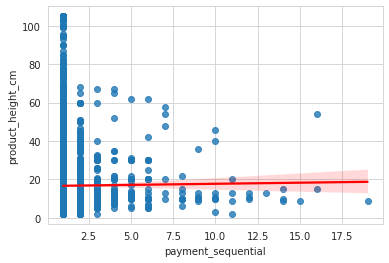

SpearmanrResult(correlation=0.017125027024802824, pvalue=0.04546044499967526)
__________________________________________________
96 payment_sequential - product_width_cm


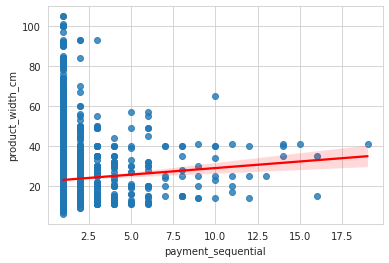

SpearmanrResult(correlation=0.03071858042466169, pvalue=0.00033218922962757345)
__________________________________________________
97 payment_sequential - seller_zip_code_prefix


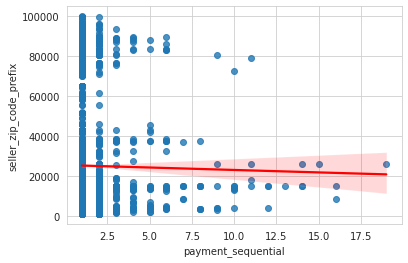

SpearmanrResult(correlation=0.006661947439108615, pvalue=0.4364914885015828)
__________________________________________________
98 payment_sequential - label


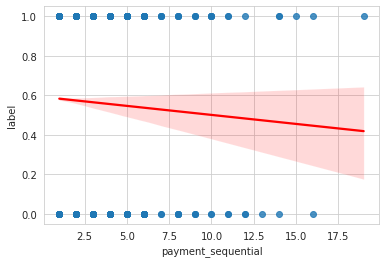

SpearmanrResult(correlation=-0.015403346687844289, pvalue=0.07198155171198523)
__________________________________________________
99 payment_installments - payment_value


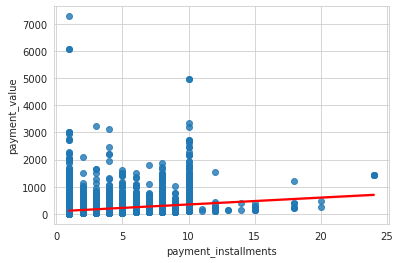

SpearmanrResult(correlation=0.38749046520200126, pvalue=0.0)
__________________________________________________
100 payment_installments - product_name_lenght


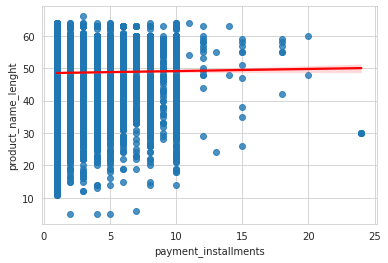

SpearmanrResult(correlation=0.01824799879022775, pvalue=0.03304270300389747)
__________________________________________________
101 payment_installments - product_description_lenght


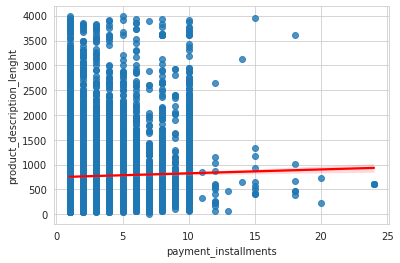

SpearmanrResult(correlation=0.019472349172622604, pvalue=0.022929473833579093)
__________________________________________________
102 payment_installments - product_photos_qty


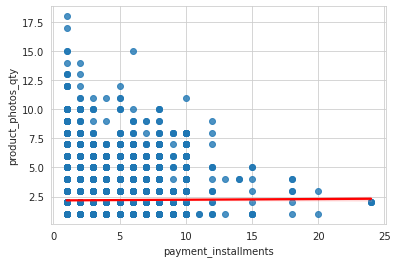

SpearmanrResult(correlation=0.01046638238591302, pvalue=0.2215115768084888)
__________________________________________________
103 payment_installments - product_weight_g


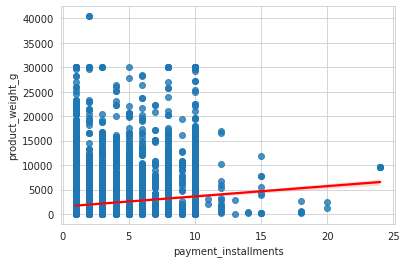

SpearmanrResult(correlation=0.1782893397127515, pvalue=7.632657142304895e-98)
__________________________________________________
104 payment_installments - product_length_cm


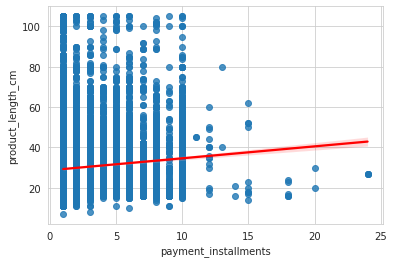

SpearmanrResult(correlation=0.09193251290544315, pvalue=5.281802865265811e-27)
__________________________________________________
105 payment_installments - product_height_cm


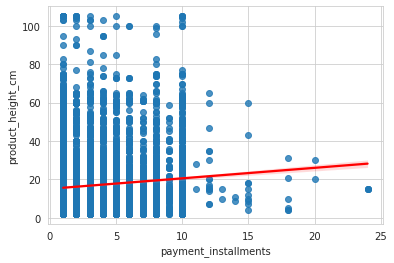

SpearmanrResult(correlation=0.10671913426690582, pvalue=7.406652113118968e-36)
__________________________________________________
106 payment_installments - product_width_cm


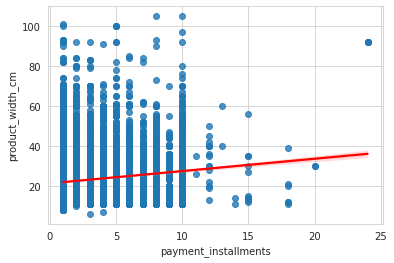

SpearmanrResult(correlation=0.12683127052449233, pvalue=4.852230669682441e-50)
__________________________________________________
107 payment_installments - seller_zip_code_prefix


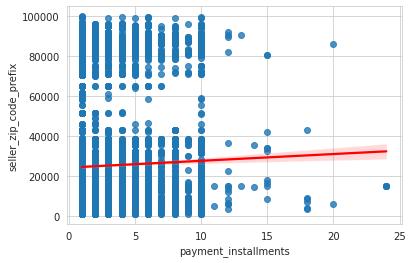

SpearmanrResult(correlation=0.06384145952097114, pvalue=8.370016466683545e-14)
__________________________________________________
108 payment_installments - label


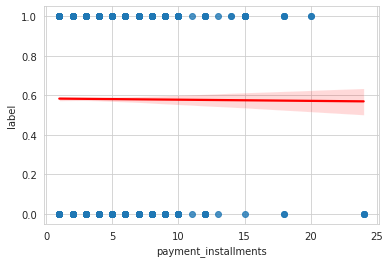

SpearmanrResult(correlation=-0.004455233726551635, pvalue=0.6027995549907632)
__________________________________________________
109 payment_value - product_name_lenght


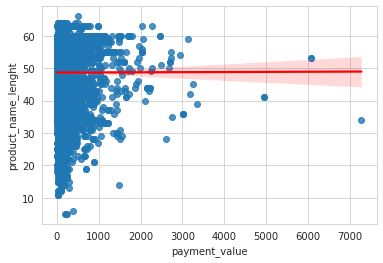

SpearmanrResult(correlation=0.015492004763602742, pvalue=0.0703590838576689)
__________________________________________________
110 payment_value - product_description_lenght


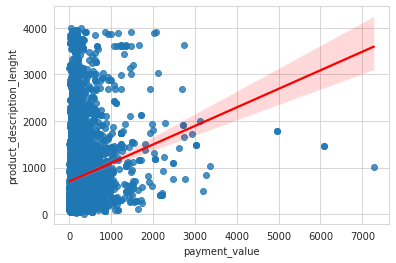

SpearmanrResult(correlation=0.1491993438317838, pvalue=9.263676533209011e-69)
__________________________________________________
111 payment_value - product_photos_qty


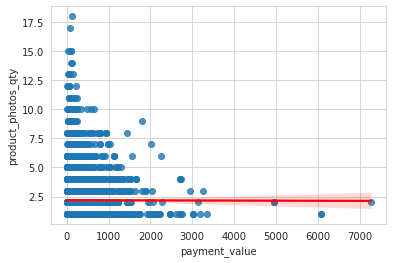

SpearmanrResult(correlation=-0.021474129654433766, pvalue=0.012124789335420334)
__________________________________________________
112 payment_value - product_weight_g


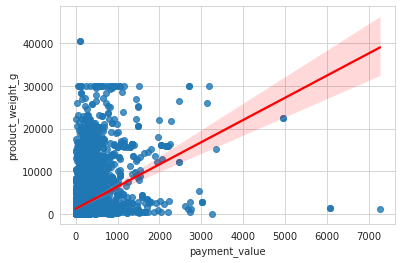

SpearmanrResult(correlation=0.4415586789416283, pvalue=0.0)
__________________________________________________
113 payment_value - product_length_cm


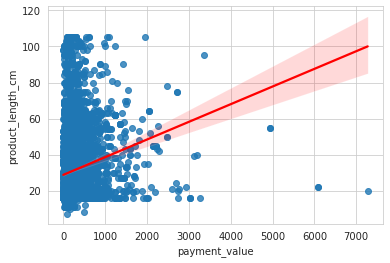

SpearmanrResult(correlation=0.22719263894115924, pvalue=2.977141694177828e-159)
__________________________________________________
114 payment_value - product_height_cm


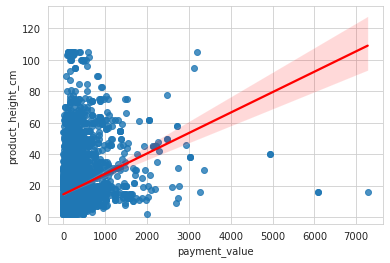

SpearmanrResult(correlation=0.3062353151169122, pvalue=4.141765330423071e-294)
__________________________________________________
115 payment_value - product_width_cm


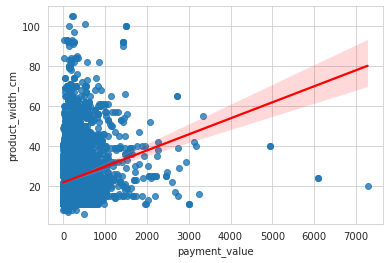

SpearmanrResult(correlation=0.23156378206160977, pvalue=1.5661483999657845e-165)
__________________________________________________
116 payment_value - seller_zip_code_prefix


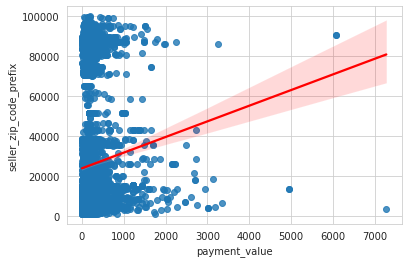

SpearmanrResult(correlation=0.15813271928334968, pvalue=4.0842190478114896e-77)
__________________________________________________
117 payment_value - label


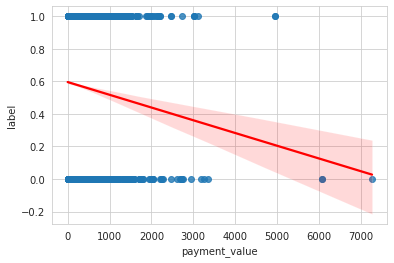

SpearmanrResult(correlation=-0.04711873613934324, pvalue=3.6587336061446804e-08)
__________________________________________________
118 product_name_lenght - product_description_lenght


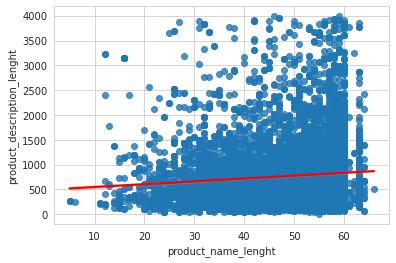

SpearmanrResult(correlation=0.11550435557384911, pvalue=9.53970548676149e-42)
__________________________________________________
119 product_name_lenght - product_photos_qty


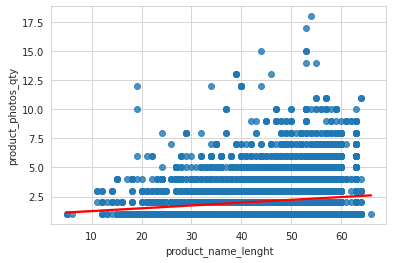

SpearmanrResult(correlation=0.2001602918587237, pvalue=2.498085571800443e-123)
__________________________________________________
120 product_name_lenght - product_weight_g


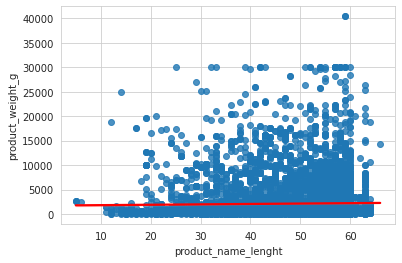

SpearmanrResult(correlation=0.08668641842895584, pvalue=3.517579710342057e-24)
__________________________________________________
121 product_name_lenght - product_length_cm


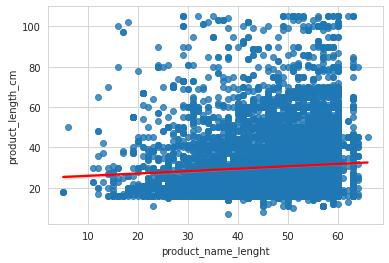

SpearmanrResult(correlation=0.06594248614050263, pvalue=1.2527799036429306e-14)
__________________________________________________
122 product_name_lenght - product_height_cm


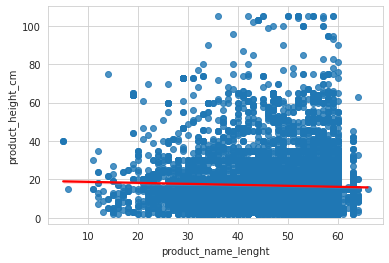

SpearmanrResult(correlation=-0.048839391802258714, pvalue=1.1437760324654372e-08)
__________________________________________________
123 product_name_lenght - product_width_cm


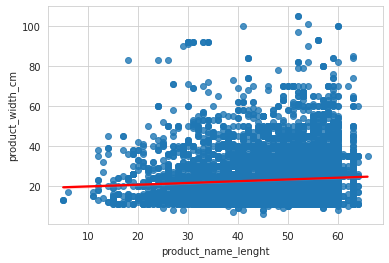

SpearmanrResult(correlation=0.06577174499687241, pvalue=1.4651443932212395e-14)
__________________________________________________
124 product_name_lenght - seller_zip_code_prefix


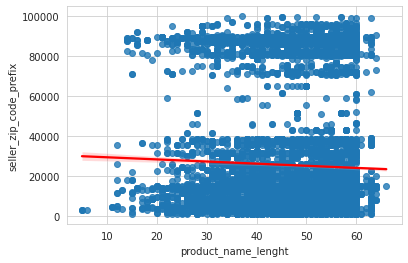

SpearmanrResult(correlation=0.0007179849852674327, pvalue=0.9331665850339651)
__________________________________________________
125 product_name_lenght - label


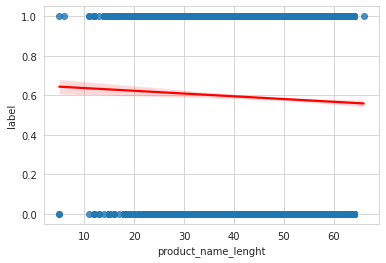

SpearmanrResult(correlation=-0.027849321244845016, pvalue=0.0011400769178826404)
__________________________________________________
126 product_description_lenght - product_photos_qty


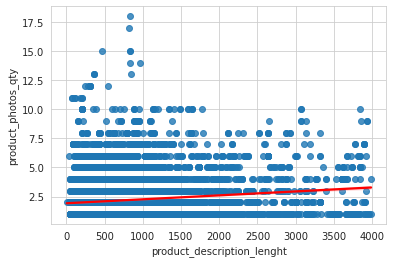

SpearmanrResult(correlation=0.15911895109062993, pvalue=4.545358641659817e-78)
__________________________________________________
127 product_description_lenght - product_weight_g


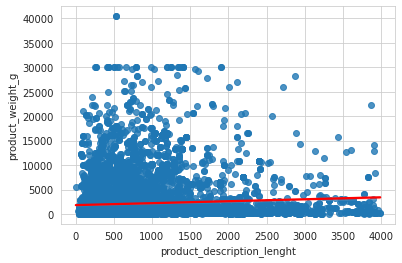

SpearmanrResult(correlation=0.08028257958076623, pvalue=5.872793273633954e-21)
__________________________________________________
128 product_description_lenght - product_length_cm


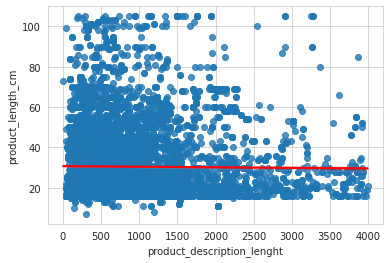

SpearmanrResult(correlation=-0.04590465796767772, pvalue=8.115442899457029e-08)
__________________________________________________
129 product_description_lenght - product_height_cm


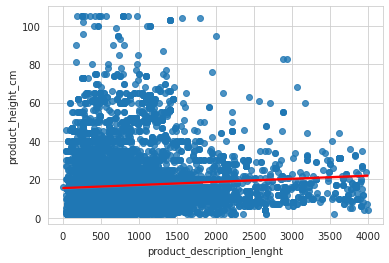

SpearmanrResult(correlation=0.1261914148215874, pvalue=1.4981283657167203e-49)
__________________________________________________
130 product_description_lenght - product_width_cm


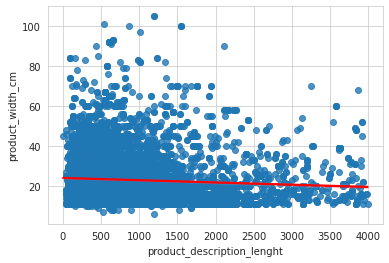

SpearmanrResult(correlation=-0.09240195752770014, pvalue=2.897660421848866e-27)
__________________________________________________
131 product_description_lenght - seller_zip_code_prefix


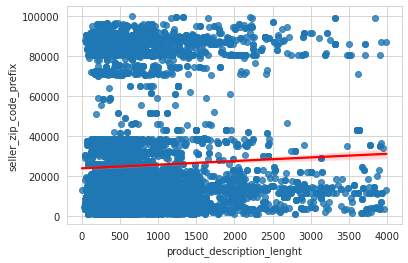

SpearmanrResult(correlation=-0.027667673939505012, pvalue=0.001228265065233752)
__________________________________________________
132 product_description_lenght - label


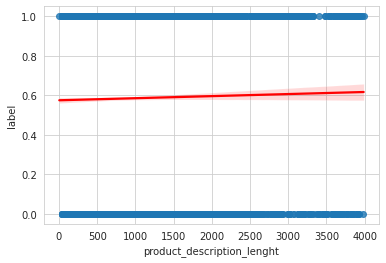

SpearmanrResult(correlation=0.01369311678227854, pvalue=0.10972148033506987)
__________________________________________________
133 product_photos_qty - product_weight_g


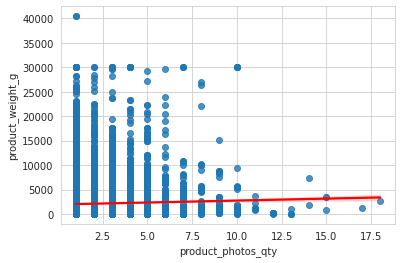

SpearmanrResult(correlation=0.018516903772478062, pvalue=0.030542687236922345)
__________________________________________________
134 product_photos_qty - product_length_cm


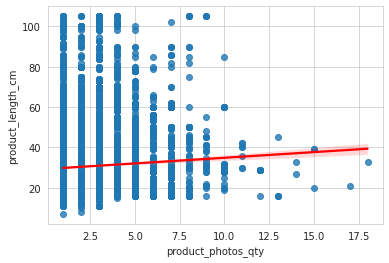

SpearmanrResult(correlation=0.011466298188664258, pvalue=0.18046638547944865)
__________________________________________________
135 product_photos_qty - product_height_cm


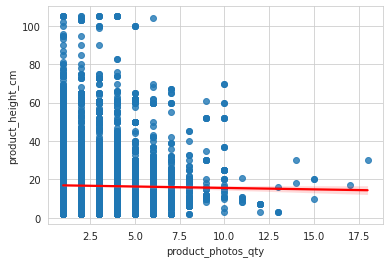

SpearmanrResult(correlation=-0.05837029938126532, pvalue=8.882779171301172e-12)
__________________________________________________
136 product_photos_qty - product_width_cm


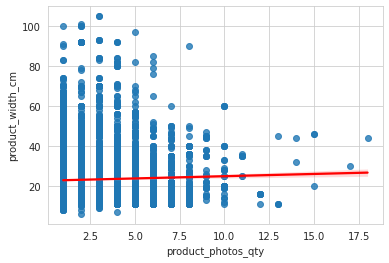

SpearmanrResult(correlation=0.0006093755807775404, pvalue=0.9432578790002717)
__________________________________________________
137 product_photos_qty - seller_zip_code_prefix


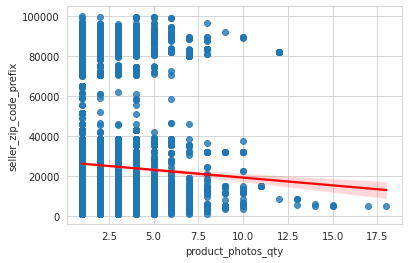

SpearmanrResult(correlation=-0.07195251693849022, pvalue=3.9275370342084036e-17)
__________________________________________________
138 product_photos_qty - label


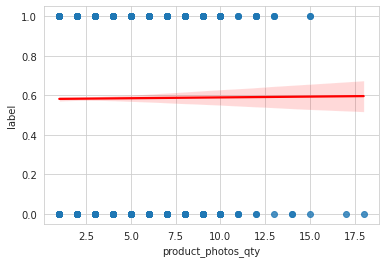

SpearmanrResult(correlation=0.0029268229276729536, pvalue=0.7324585805159846)
__________________________________________________
139 product_weight_g - product_length_cm


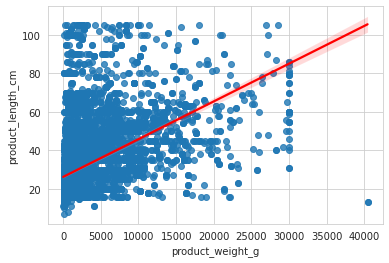

SpearmanrResult(correlation=0.6268490646869525, pvalue=0.0)
__________________________________________________
140 product_weight_g - product_height_cm


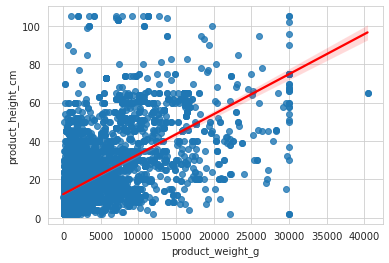

SpearmanrResult(correlation=0.5239760968275122, pvalue=0.0)
__________________________________________________
141 product_weight_g - product_width_cm


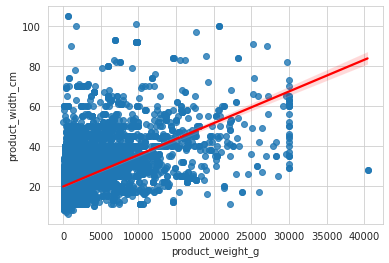

SpearmanrResult(correlation=0.6412355387964458, pvalue=0.0)
__________________________________________________
142 product_weight_g - seller_zip_code_prefix


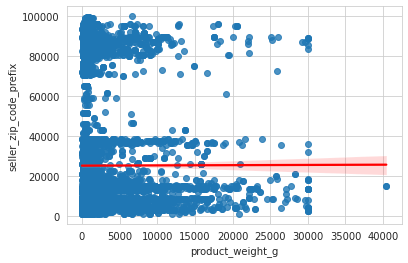

SpearmanrResult(correlation=0.07093704665135289, pvalue=1.0769555478666857e-16)
__________________________________________________
143 product_weight_g - label


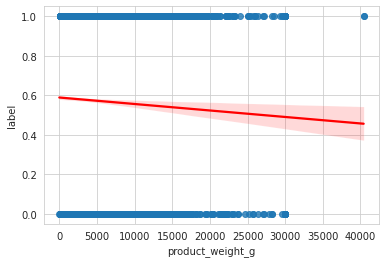

SpearmanrResult(correlation=-0.02423630549187516, pvalue=0.004636743605492326)
__________________________________________________
144 product_length_cm - product_height_cm


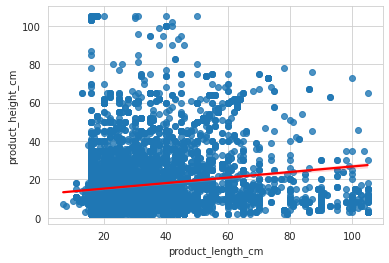

SpearmanrResult(correlation=0.22739220213180478, pvalue=1.5488934407811944e-159)
__________________________________________________
145 product_length_cm - product_width_cm


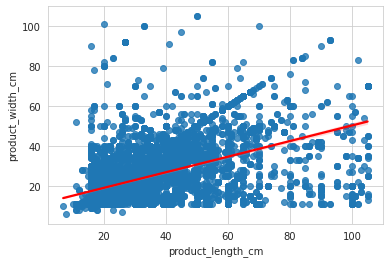

SpearmanrResult(correlation=0.6460236099389467, pvalue=0.0)
__________________________________________________
146 product_length_cm - seller_zip_code_prefix


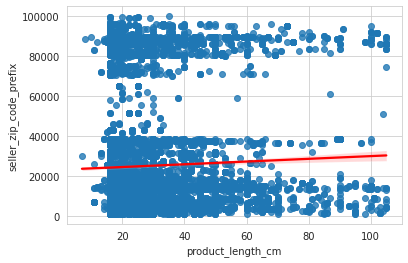

SpearmanrResult(correlation=0.04606418363469546, pvalue=7.317097041217016e-08)
__________________________________________________
147 product_length_cm - label


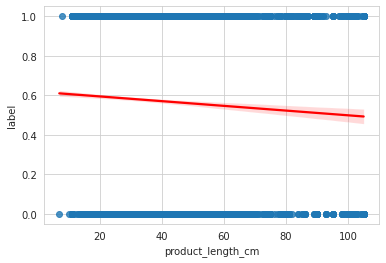

SpearmanrResult(correlation=-0.02802103803819126, pvalue=0.0010621267948318065)
__________________________________________________
148 product_height_cm - product_width_cm


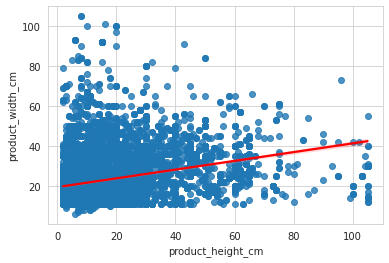

SpearmanrResult(correlation=0.33199343371294343, pvalue=0.0)
__________________________________________________
149 product_height_cm - seller_zip_code_prefix


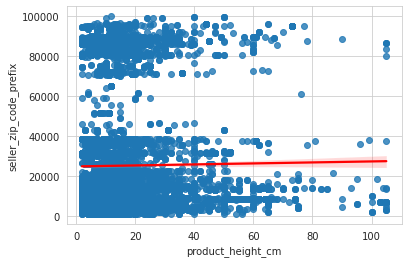

SpearmanrResult(correlation=0.034611552932617286, pvalue=5.25739611378454e-05)
__________________________________________________
150 product_height_cm - label


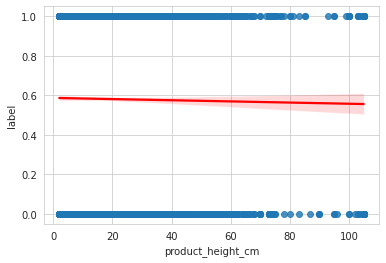

SpearmanrResult(correlation=0.010799404547138717, pvalue=0.2071578357385347)
__________________________________________________
151 product_width_cm - seller_zip_code_prefix


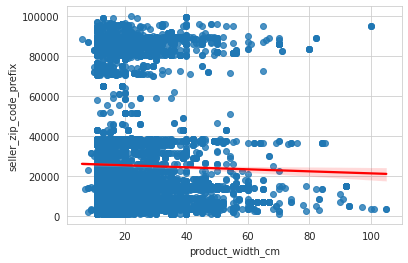

SpearmanrResult(correlation=0.051791806084783065, pvalue=1.4181730491748545e-09)
__________________________________________________
152 product_width_cm - label


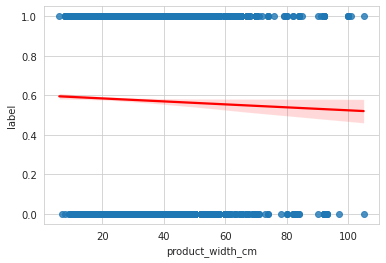

SpearmanrResult(correlation=-0.011842443870310153, pvalue=0.16658542616195282)
__________________________________________________
153 seller_zip_code_prefix - label


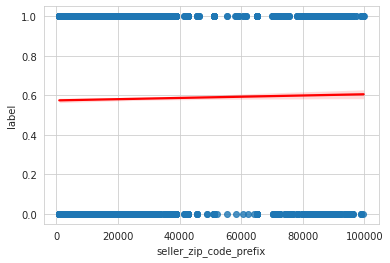

SpearmanrResult(correlation=0.020269684360977876, pvalue=0.017895902255328385)
__________________________________________________


In [ ]:
done = []
a = 1

for x, y, in itertools.combinations(devset_dt_num, 2):

    print (a,'{} - {}'.format(x,y))

    sns.set_style('whitegrid')
    sns.regplot(data = devset_dt_num, x=x, y=y, line_kws={'color':'red'})#, hue='label', palette='bright', alpha=0.8)
    #sns.scatterplot (data = cc, x = x, y = y, s=100, color='purple')
    plt.show()

     # normal test
    stats, pvalue = normaltest(devset_dt_num[x])
    stats2, pvalue2 = normaltest(devset_dt_num[y])

    if pvalue > 0.05:
        if pvalue2 > 0.05:
            print(pearsonr(devset_dt_num[x], devset_dt_num[y]))
    else:
        print(spearmanr(devset_dt_num[x], devset_dt_num[y]))
                
    print('_'*50)
    a += 1
    done.append([x,y])        


#### Numerik-Label

Plot boxplot dan pointplot fitur numerik dengan hue berupa label (0: buyer memberi rating 5 | 1: buyer membari rating di bawah 5) beserta confidence interval

Dengan confidence interval 95%

H(0): mean variabel numerik buyer yang memberi variabel 5 = mean variabel numerik kelompok yang memberi rating dibawah 5

H(0): mean variabel numerik kelompok buyer yang memberi variabel 5 H(0): mean variabel numerik buyer memberi variabel 5 = mean variabel numerik kelompok yang memberi rating dibawah 5 mean variabel numerik kelompok yang memberi rating dibawah 5


In [ ]:
devset_dr_num_nl = devset_dt_num.drop(['label'], axis = 1)

1  customer_zip_code_prefix


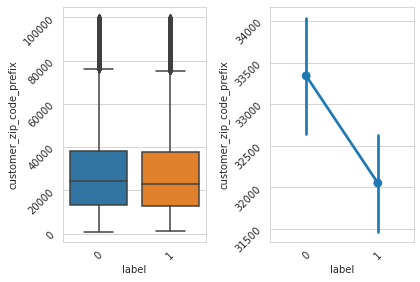

Confidence interval 95% untuk fitur customer_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (32636.85611931987, 34046.555046410474)
Confidence interval 95% untuk fitur customer_zip_code_prefix pada buyer yang memberi rating 5 adalah (31465.015260931705, 32641.961214096602)
Tolak H(0)
**************************************************
2  geolocation_zip_code_prefix


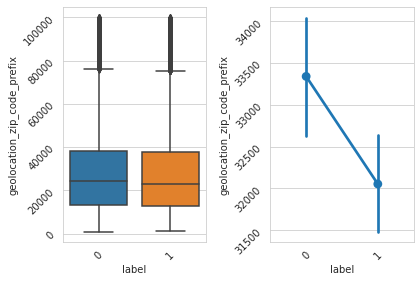

Confidence interval 95% untuk fitur geolocation_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (32636.85611931987, 34046.555046410474)
Confidence interval 95% untuk fitur geolocation_zip_code_prefix pada buyer yang memberi rating 5 adalah (31465.015260931705, 32641.961214096602)
Tolak H(0)
**************************************************
3  geolocation_lat


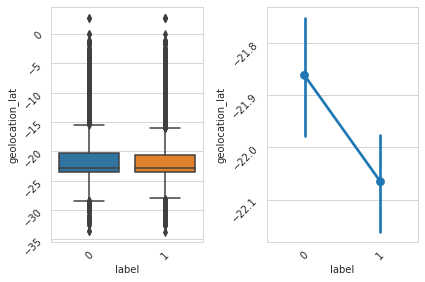

Confidence interval 95% untuk fitur geolocation_lat pada buyer yang memberi rating dibawah 5 adalah (-21.977704733902, -21.745689509396833)
Confidence interval 95% untuk fitur geolocation_lat pada buyer yang memberi rating 5 adalah (-22.156020606775886, -21.975415644287356)
Tolak H(0)
**************************************************
4  geolocation_lng


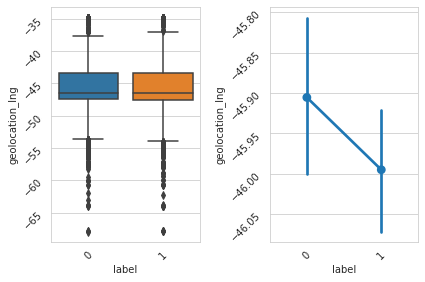

Confidence interval 95% untuk fitur geolocation_lng pada buyer yang memberi rating dibawah 5 adalah (-45.999490848919294, -45.81154170202666)
Confidence interval 95% untuk fitur geolocation_lng pada buyer yang memberi rating 5 adalah (-46.07205451931412, -45.918299239147686)
Gagal menolak H(0)
**************************************************
5  price


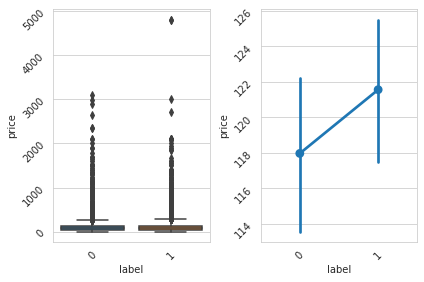

Confidence interval 95% untuk fitur price pada buyer yang memberi rating dibawah 5 adalah (113.34125387271044, 122.57495048122217)
Confidence interval 95% untuk fitur price pada buyer yang memberi rating 5 adalah (117.44192512479022, 125.66880830079792)
Gagal menolak H(0)
**************************************************
6  freight_value


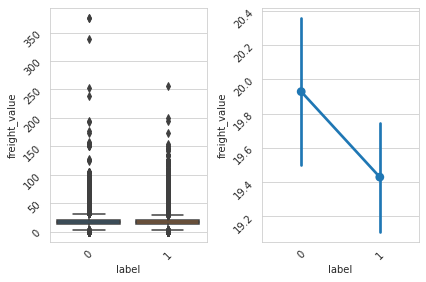

Confidence interval 95% untuk fitur freight_value pada buyer yang memberi rating dibawah 5 adalah (19.50336276651528, 20.354144255956626)
Confidence interval 95% untuk fitur freight_value pada buyer yang memberi rating 5 adalah (19.108555044244415, 19.748730148861636)
Gagal menolak H(0)
**************************************************
7  payment_sequential


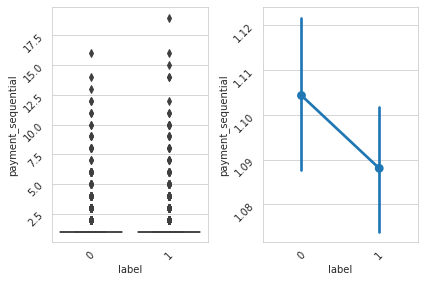

Confidence interval 95% untuk fitur payment_sequential pada buyer yang memberi rating dibawah 5 adalah (1.0867631030533296, 1.1218409355770478)
Confidence interval 95% untuk fitur payment_sequential pada buyer yang memberi rating 5 adalah (1.0738719116172852, 1.1022508711226822)
Gagal menolak H(0)
**************************************************
8  payment_installments


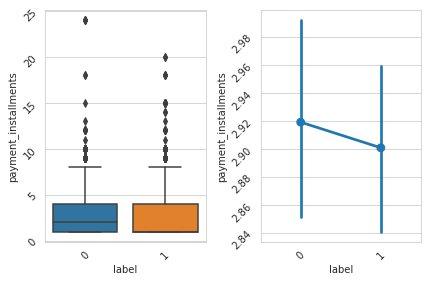

Confidence interval 95% untuk fitur payment_installments pada buyer yang memberi rating dibawah 5 adalah (2.8479841152889445, 2.99011948435987)
Confidence interval 95% untuk fitur payment_installments pada buyer yang memberi rating 5 adalah (2.8409324875420467, 2.9605519759124754)
Gagal menolak H(0)
**************************************************
9  payment_value


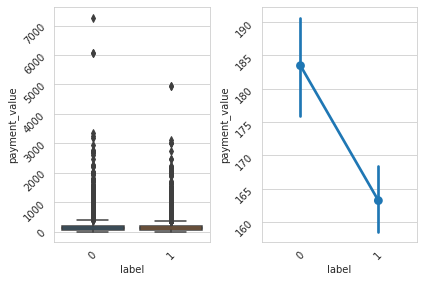

Confidence interval 95% untuk fitur payment_value pada buyer yang memberi rating dibawah 5 adalah (176.086292219663, 190.83240137120623)
Confidence interval 95% untuk fitur payment_value pada buyer yang memberi rating 5 adalah (158.28195891691556, 168.13376129946388)
Gagal menolak H(0)
**************************************************
10  product_name_lenght


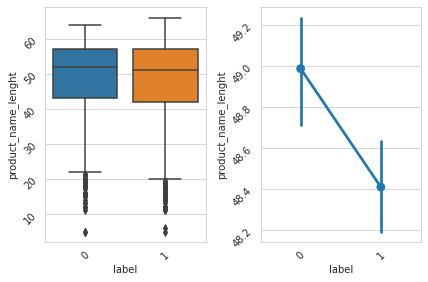

Confidence interval 95% untuk fitur product_name_lenght pada buyer yang memberi rating dibawah 5 adalah (48.73044744593001, 49.24421351052966)
Confidence interval 95% untuk fitur product_name_lenght pada buyer yang memberi rating 5 adalah (48.186713118000874, 48.63275433008169)
Gagal menolak H(0)
**************************************************
11  product_description_lenght


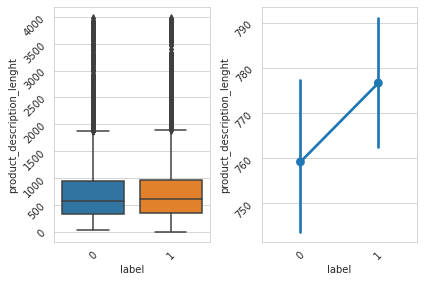

Confidence interval 95% untuk fitur product_description_lenght pada buyer yang memberi rating dibawah 5 adalah (742.8797930295354, 775.5263454429842)
Confidence interval 95% untuk fitur product_description_lenght pada buyer yang memberi rating 5 adalah (762.5461667062568, 790.788270801706)
Gagal menolak H(0)
**************************************************
12  product_photos_qty


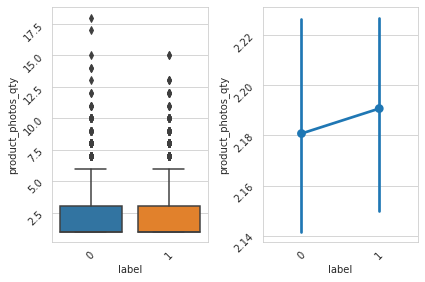

Confidence interval 95% untuk fitur product_photos_qty pada buyer yang memberi rating dibawah 5 adalah (2.13589046863943, 2.2256370117317337)
Confidence interval 95% untuk fitur product_photos_qty pada buyer yang memberi rating 5 adalah (2.153248344538407, 2.2282015216865894)
Gagal menolak H(0)
**************************************************
13  product_weight_g


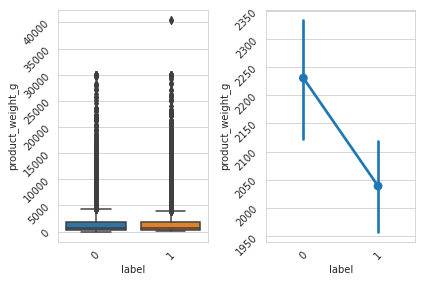

Confidence interval 95% untuk fitur product_weight_g pada buyer yang memberi rating dibawah 5 adalah (2129.4264677455553, 2331.9987429286016)
Confidence interval 95% untuk fitur product_weight_g pada buyer yang memberi rating 5 adalah (1957.7417238247351, 2119.51482199601)
Gagal menolak H(0)
**************************************************
14  product_length_cm


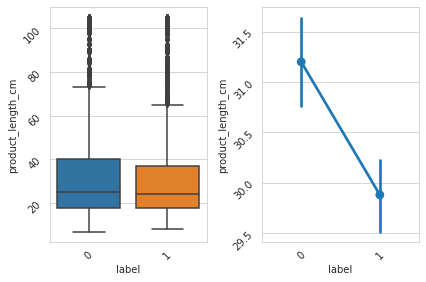

Confidence interval 95% untuk fitur product_length_cm pada buyer yang memberi rating dibawah 5 adalah (30.755440119513842, 31.64308516138503)
Confidence interval 95% untuk fitur product_length_cm pada buyer yang memberi rating 5 adalah (29.528531075920938, 30.226755933142506)
Gagal menolak H(0)
**************************************************
15  product_height_cm


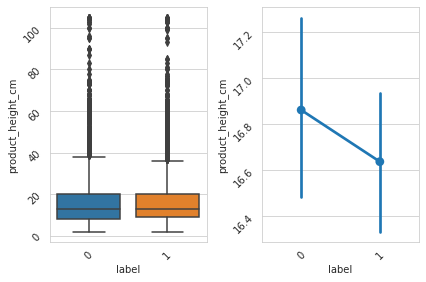

Confidence interval 95% untuk fitur product_height_cm pada buyer yang memberi rating dibawah 5 adalah (16.4923251097931, 17.227127137397915)
Confidence interval 95% untuk fitur product_height_cm pada buyer yang memberi rating 5 adalah (16.34472278141861, 16.925669967826103)
Gagal menolak H(0)
**************************************************
16  product_width_cm


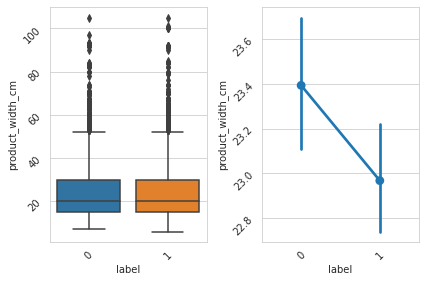

Confidence interval 95% untuk fitur product_width_cm pada buyer yang memberi rating dibawah 5 adalah (23.082564509063054, 23.703952344869528)
Confidence interval 95% untuk fitur product_width_cm pada buyer yang memberi rating 5 adalah (22.712393127691293, 23.221393377847477)
Gagal menolak H(0)
**************************************************
17  seller_zip_code_prefix


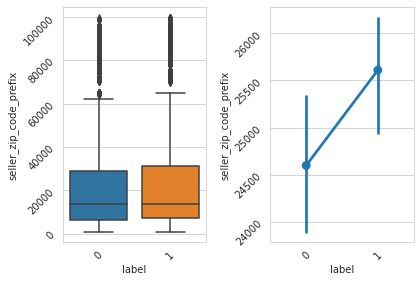

Confidence interval 95% untuk fitur seller_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (23874.13940898967, 25322.178708987856)
Confidence interval 95% untuk fitur seller_zip_code_prefix pada buyer yang memberi rating 5 adalah (24986.323338605092, 26230.672509929318)
Tolak H(0)
**************************************************
1  customer_zip_code_prefix


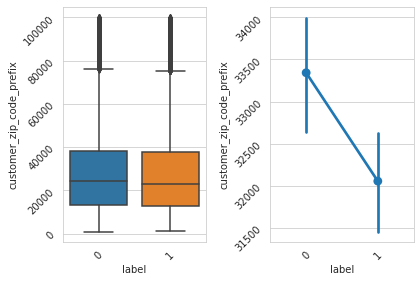

Confidence interval 95% untuk fitur customer_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (32636.85611931987, 34046.555046410474)
Confidence interval 95% untuk fitur customer_zip_code_prefix pada buyer yang memberi rating 5 adalah (31465.015260931705, 32641.961214096602)
Tolak H(0)
**************************************************
2  geolocation_zip_code_prefix


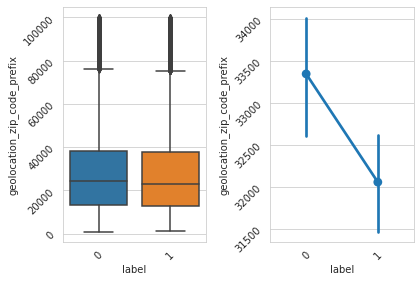

Confidence interval 95% untuk fitur geolocation_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (32636.85611931987, 34046.555046410474)
Confidence interval 95% untuk fitur geolocation_zip_code_prefix pada buyer yang memberi rating 5 adalah (31465.015260931705, 32641.961214096602)
Tolak H(0)
**************************************************
3  geolocation_lat


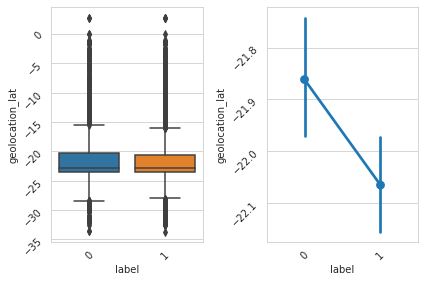

Confidence interval 95% untuk fitur geolocation_lat pada buyer yang memberi rating dibawah 5 adalah (-21.977704733902, -21.745689509396833)
Confidence interval 95% untuk fitur geolocation_lat pada buyer yang memberi rating 5 adalah (-22.156020606775886, -21.975415644287356)
Tolak H(0)
**************************************************
4  geolocation_lng


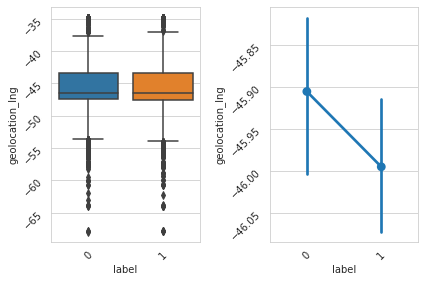

Confidence interval 95% untuk fitur geolocation_lng pada buyer yang memberi rating dibawah 5 adalah (-45.999490848919294, -45.81154170202666)
Confidence interval 95% untuk fitur geolocation_lng pada buyer yang memberi rating 5 adalah (-46.07205451931412, -45.918299239147686)
Gagal menolak H(0)
**************************************************
5  price


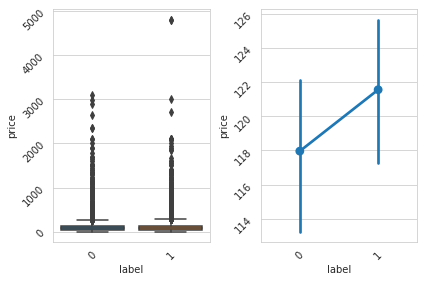

Confidence interval 95% untuk fitur price pada buyer yang memberi rating dibawah 5 adalah (113.34125387271044, 122.57495048122217)
Confidence interval 95% untuk fitur price pada buyer yang memberi rating 5 adalah (117.44192512479022, 125.66880830079792)
Gagal menolak H(0)
**************************************************
6  freight_value


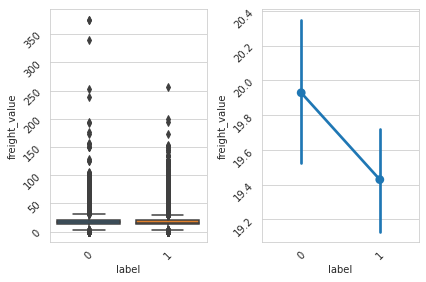

Confidence interval 95% untuk fitur freight_value pada buyer yang memberi rating dibawah 5 adalah (19.50336276651528, 20.354144255956626)
Confidence interval 95% untuk fitur freight_value pada buyer yang memberi rating 5 adalah (19.108555044244415, 19.748730148861636)
Gagal menolak H(0)
**************************************************
7  payment_sequential


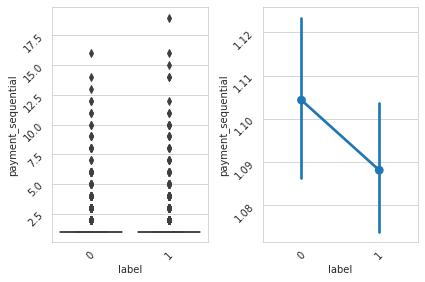

Confidence interval 95% untuk fitur payment_sequential pada buyer yang memberi rating dibawah 5 adalah (1.0867631030533296, 1.1218409355770478)
Confidence interval 95% untuk fitur payment_sequential pada buyer yang memberi rating 5 adalah (1.0738719116172852, 1.1022508711226822)
Gagal menolak H(0)
**************************************************
8  payment_installments


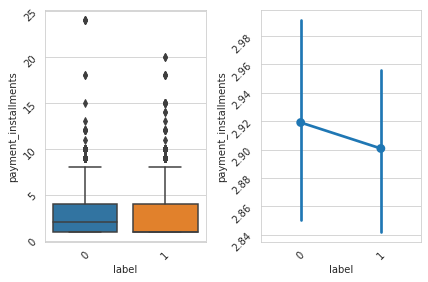

Confidence interval 95% untuk fitur payment_installments pada buyer yang memberi rating dibawah 5 adalah (2.8479841152889445, 2.99011948435987)
Confidence interval 95% untuk fitur payment_installments pada buyer yang memberi rating 5 adalah (2.8409324875420467, 2.9605519759124754)
Gagal menolak H(0)
**************************************************
9  payment_value


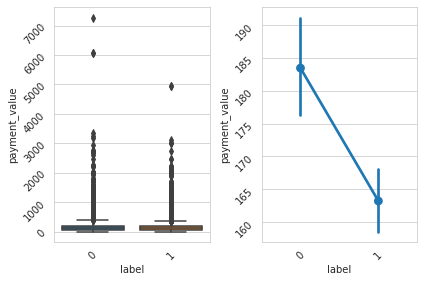

Confidence interval 95% untuk fitur payment_value pada buyer yang memberi rating dibawah 5 adalah (176.086292219663, 190.83240137120623)
Confidence interval 95% untuk fitur payment_value pada buyer yang memberi rating 5 adalah (158.28195891691556, 168.13376129946388)
Gagal menolak H(0)
**************************************************
10  product_name_lenght


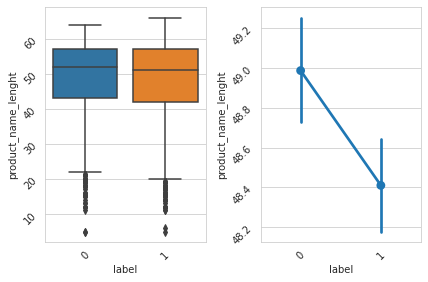

Confidence interval 95% untuk fitur product_name_lenght pada buyer yang memberi rating dibawah 5 adalah (48.73044744593001, 49.24421351052966)
Confidence interval 95% untuk fitur product_name_lenght pada buyer yang memberi rating 5 adalah (48.186713118000874, 48.63275433008169)
Gagal menolak H(0)
**************************************************
11  product_description_lenght


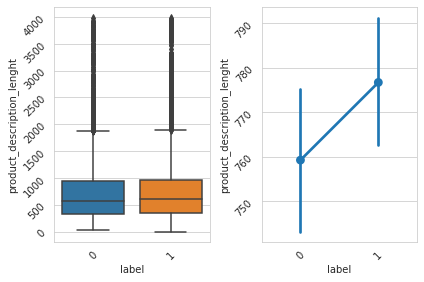

Confidence interval 95% untuk fitur product_description_lenght pada buyer yang memberi rating dibawah 5 adalah (742.8797930295354, 775.5263454429842)
Confidence interval 95% untuk fitur product_description_lenght pada buyer yang memberi rating 5 adalah (762.5461667062568, 790.788270801706)
Gagal menolak H(0)
**************************************************
12  product_photos_qty


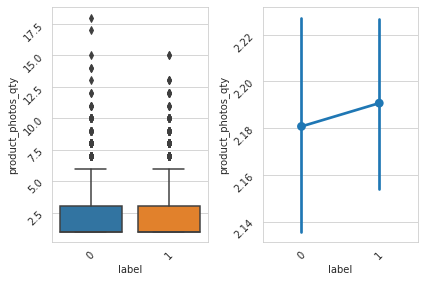

Confidence interval 95% untuk fitur product_photos_qty pada buyer yang memberi rating dibawah 5 adalah (2.13589046863943, 2.2256370117317337)
Confidence interval 95% untuk fitur product_photos_qty pada buyer yang memberi rating 5 adalah (2.153248344538407, 2.2282015216865894)
Gagal menolak H(0)
**************************************************
13  product_weight_g


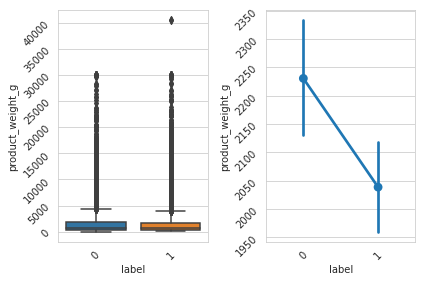

Confidence interval 95% untuk fitur product_weight_g pada buyer yang memberi rating dibawah 5 adalah (2129.4264677455553, 2331.9987429286016)
Confidence interval 95% untuk fitur product_weight_g pada buyer yang memberi rating 5 adalah (1957.7417238247351, 2119.51482199601)
Gagal menolak H(0)
**************************************************
14  product_length_cm


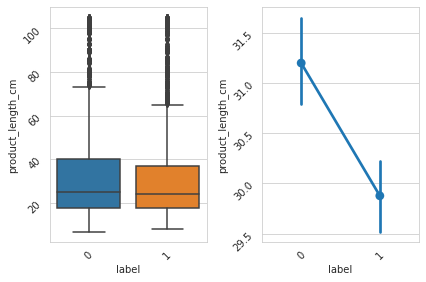

Confidence interval 95% untuk fitur product_length_cm pada buyer yang memberi rating dibawah 5 adalah (30.755440119513842, 31.64308516138503)
Confidence interval 95% untuk fitur product_length_cm pada buyer yang memberi rating 5 adalah (29.528531075920938, 30.226755933142506)
Gagal menolak H(0)
**************************************************
15  product_height_cm


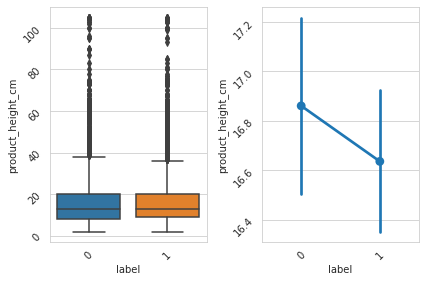

Confidence interval 95% untuk fitur product_height_cm pada buyer yang memberi rating dibawah 5 adalah (16.4923251097931, 17.227127137397915)
Confidence interval 95% untuk fitur product_height_cm pada buyer yang memberi rating 5 adalah (16.34472278141861, 16.925669967826103)
Gagal menolak H(0)
**************************************************
16  product_width_cm


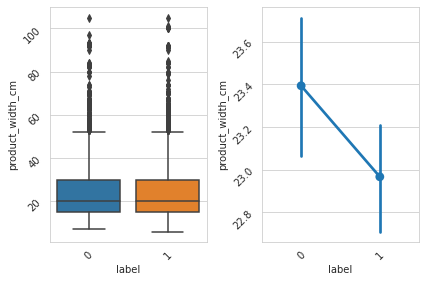

Confidence interval 95% untuk fitur product_width_cm pada buyer yang memberi rating dibawah 5 adalah (23.082564509063054, 23.703952344869528)
Confidence interval 95% untuk fitur product_width_cm pada buyer yang memberi rating 5 adalah (22.712393127691293, 23.221393377847477)
Gagal menolak H(0)
**************************************************
17  seller_zip_code_prefix


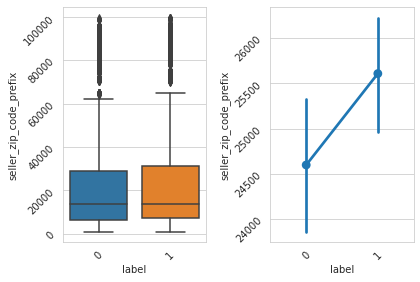

Confidence interval 95% untuk fitur seller_zip_code_prefix pada buyer yang memberi rating dibawah 5 adalah (23874.13940898967, 25322.178708987856)
Confidence interval 95% untuk fitur seller_zip_code_prefix pada buyer yang memberi rating 5 adalah (24986.323338605092, 26230.672509929318)
Tolak H(0)
**************************************************


In [ ]:
n1 = len(devset_dt_num[devset_dt_num['label']== 0])
n2 = len(devset_dt_num[devset_dt_num['label']== 1])

a = 1
for col in devset_dr_num_nl.columns:
    print(a,'',col )
    fig, ax = plt.subplots(1,2)
    
    # buat boxplot
    sns.boxplot(data = devset_dt_num, x='label', y=col, ax=ax[0])
    
    # buat pointplot
    sns.pointplot(data = devset_dt_num, x='label', y=col, ax=ax[1])
    
    plt.tight_layout()
    ax[0].tick_params(rotation=45)
    ax[1].tick_params(rotation=45)
    plt.show()
    
    # confidence interval buyer memberi rating di bawah 5

    ci1 = t.interval(alpha = 0.95,
                    df = len(devset_dt_num[devset_dt_num['label'] == 0]) - 1,
                    loc = devset_dt_num[devset_dt_num['label'] == 0 ][col].mean(), 
                    scale = devset_dt_num[devset_dt_num['label'] ==0 ][col].std()/(n1**(1/2)))
    
    print('Confidence interval 95% untuk fitur {} pada buyer yang memberi rating dibawah 5 adalah {}'.format(col, ci1))
    
    # confidence interval buyer memberi rating 5
    
    ci2 = t.interval(alpha = 0.95,
                    df = len(devset_dt_num[devset_dt_num['label'] ==1]) - 1,
                    loc = devset_dt_num[devset_dt_num['label'] ==1][col].mean(), 
                    scale = devset_dt_num[devset_dt_num['label'] ==1][col].std()/(n2**(1/2)))
    
    print('Confidence interval 95% untuk fitur {} pada buyer yang memberi rating 5 adalah {}'.format(col, ci2))
    
    # ind ttest
    
    stat, pvalue = ttest_ind(devset_dt_num[devset_dt_num['label'] == 0][col],
                             devset_dt_num[devset_dt_num['label'] == 1][col])
    
    if pvalue < 0.05:
        print('Tolak H(0)')
    else:
        print('Gagal menolak H(0)')
    print('*'*50)
    a += 1
    

#### Univariat Kategorik

Countplot dan stack plot fitur kategorik dengan hue berupa label

In [ ]:
devset_dt_cat.head()

,customer_city,customer_state,geolocation_city,geolocation_state,order_status,payment_type,product_category_name,seller_city,seller_state,product_category_name_english
0,rio de janeiro,RJ,rio de janeiro,RJ,delivered,credit_card,moveis_decoracao,brasilia,DF,furniture_decor
1,rio de janeiro,RJ,rio de janeiro,RJ,delivered,credit_card,relogios_presentes,ribeirao preto,SP,watches_gifts
2,rio de janeiro,RJ,rio de janeiro,RJ,delivered,credit_card,cool_stuff,sao paulo,SP,cool_stuff
3,rio de janeiro,RJ,rio de janeiro,RJ,delivered,credit_card,alimentos_bebidas,monteiro lobato,SP,food_drink
4,petrolandia,PE,petrolandia,PE,delivered,boleto,cool_stuff,jacarei,SP,cool_stuff


1  customer_city


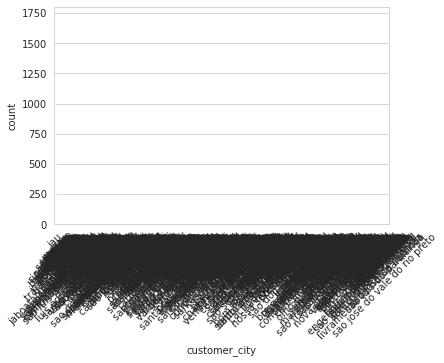

rio de janeiro    1716
sao paulo         1248
belo horizonte     698
niteroi            436
curitiba           234
                  ... 
santa teresa         1
capelinha            1
arapiraca            1
ortigueira           1
sales oliveira       1
Name: customer_city, Length: 1167, dtype: int64
unique values:['rio de janeiro' 'petrolandia' 'jaboatao dos guararapes' ... 'itapui'
 'portelandia' 'sales oliveira']
unique values counts:1167.
2  customer_state


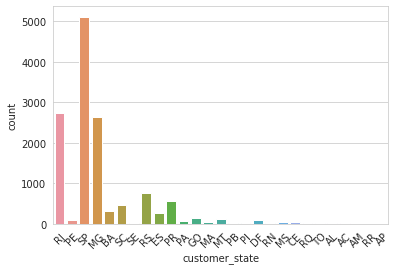

SP    5118
RJ    2734
MG    2648
RS     755
PR     557
SC     454
BA     305
ES     255
GO     130
MT     123
PE      99
DF      81
PA      78
MS      50
CE      48
MA      37
AL      30
PB      28
RN      24
PI      22
SE      21
RO      16
TO      13
AC       7
RR       5
AM       4
AP       3
Name: customer_state, dtype: int64
unique values:['RJ' 'PE' 'SP' 'MG' 'BA' 'SC' 'SE' 'RS' 'ES' 'PR' 'PA' 'GO' 'MA' 'MT'
 'PB' 'PI' 'DF' 'RN' 'MS' 'CE' 'RO' 'TO' 'AL' 'AC' 'AM' 'RR' 'AP']
unique values counts:27.
3  geolocation_city


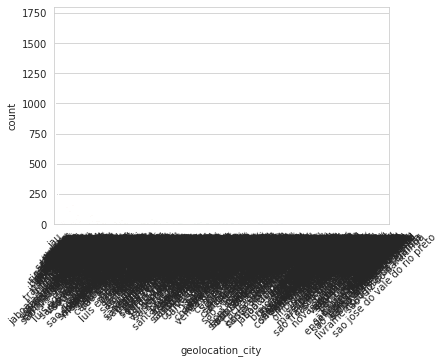

rio de janeiro    1715
sao paulo         1076
belo horizonte     698
niteroi            375
curitiba           234
                  ... 
paraiso              1
prudentópolis        1
venâncio aires       1
mossoro              1
sales oliveira       1
Name: geolocation_city, Length: 1352, dtype: int64
unique values:['rio de janeiro' 'petrolandia' 'jaboatao dos guararapes' ...
 'portelandia' 'lavras mg' 'sales oliveira']
unique values counts:1352.
4  geolocation_state


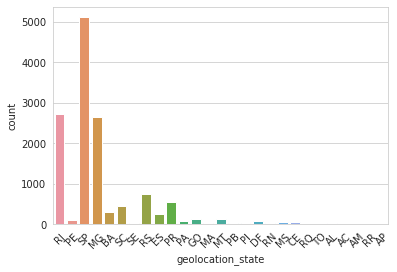

SP    5118
RJ    2734
MG    2648
RS     755
PR     557
SC     454
BA     305
ES     255
GO     130
MT     123
PE      99
DF      81
PA      78
MS      50
CE      48
MA      37
AL      30
PB      28
RN      24
PI      22
SE      21
RO      16
TO      13
AC       7
RR       5
AM       4
AP       3
Name: geolocation_state, dtype: int64
unique values:['RJ' 'PE' 'SP' 'MG' 'BA' 'SC' 'SE' 'RS' 'ES' 'PR' 'PA' 'GO' 'MA' 'MT'
 'PB' 'PI' 'DF' 'RN' 'MS' 'CE' 'RO' 'TO' 'AL' 'AC' 'AM' 'RR' 'AP']
unique values counts:27.
5  order_status


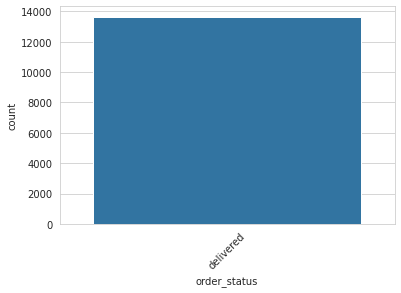

delivered    13645
Name: order_status, dtype: int64
unique values:['delivered']
unique values counts:1.
6  payment_type


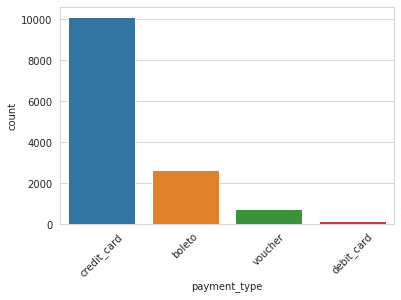

credit_card    10095
boleto          2633
voucher          739
debit_card       177
Name: payment_type, dtype: int64
unique values:['credit_card' 'boleto' 'voucher' 'debit_card' nan]
unique values counts:5.
7  product_category_name


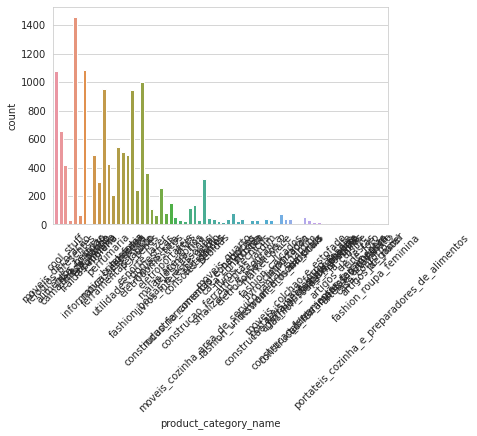

cama_mesa_banho                                  1455
beleza_saude                                     1086
moveis_decoracao                                 1077
esporte_lazer                                    1003
informatica_acessorios                            954
                                                 ... 
moveis_colchao_e_estofado                           4
fashion_roupa_feminina                              3
artigos_de_festas                                   3
portateis_cozinha_e_preparadores_de_alimentos       1
pc_gamer                                            1
Name: product_category_name, Length: 70, dtype: int64
unique values:['moveis_decoracao' 'relogios_presentes' 'cool_stuff' 'alimentos_bebidas'
 'cama_mesa_banho' 'casa_conforto' 'beleza_saude' 'fraldas_higiene'
 'automotivo' 'papelaria' 'informatica_acessorios' 'perfumaria'
 'moveis_escritorio' 'ferramentas_jardim' 'brinquedos' 'telefonia'
 'utilidades_domesticas' 'pet_shop' 'esporte_lazer' 'bebes'
 'ele

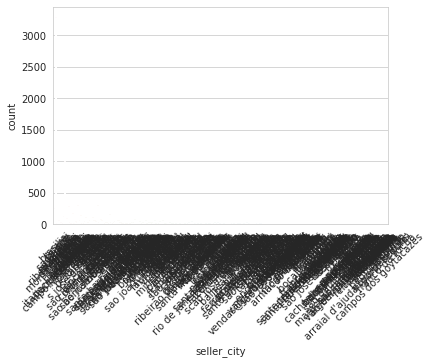

sao paulo                3293
ibitinga                 1002
curitiba                  368
santo andre               360
sao jose do rio preto     307
                         ... 
balenario camboriu          1
itapeva                     1
descalvado                  1
tres de maio                1
vassouras                   1
Name: seller_city, Length: 415, dtype: int64
unique values:['brasilia' 'ribeirao preto' 'sao paulo' 'monteiro lobato' 'jacarei'
 'piracicaba' 'osasco' 'eunapolis' 'carapicuiba' 'itapecerica da serra'
 'campo limpo paulista' 'poa' 'petropolis' 'ibitinga' 'cariacica'
 'itaquaquecetuba' 'ilicinea' 'pitanga' 'rio de janeiro' 'itajai'
 'santo andre' 'pradopolis' 'serra negra' 'campinas' 'jussara'
 'divinopolis' 'florianopolis' 'brusque' 'jundiai' 'guarulhos' 'contagem'
 'pedreira' 'atibaia' 'praia grande' 's jose do rio preto'
 'belo horizonte' 'curitiba' 'rolandia' 'betim' 'sao jose dos campos'
 'ipaussu' 'limeira' 'sao goncalo' 'serra' 'sumare' 'maringa'
 'lencois 

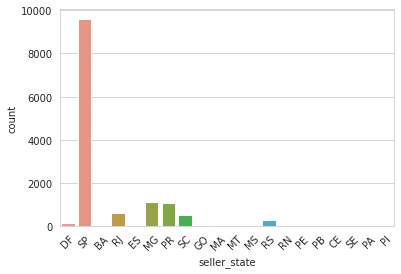

SP    9586
MG    1106
PR    1082
RJ     599
SC     542
RS     280
DF     133
GO      72
BA      65
PE      49
MA      46
ES      34
MT      23
MS       7
CE       7
PB       6
RN       4
SE       2
PA       1
PI       1
Name: seller_state, dtype: int64
unique values:['DF' 'SP' 'BA' 'RJ' 'ES' 'MG' 'PR' 'SC' 'GO' 'MA' 'MT' 'MS' 'RS' 'RN'
 'PE' 'PB' 'CE' 'SE' 'PA' 'PI']
unique values counts:20.
10  product_category_name_english


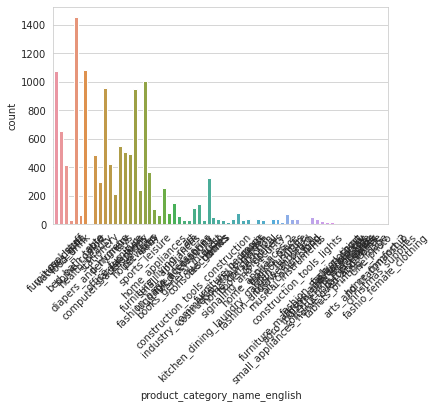

bed_bath_table                       1455
health_beauty                        1086
furniture_decor                      1077
sports_leisure                       1003
computers_accessories                 954
                                     ... 
la_cuisine                              4
arts_and_craftmanship                   4
furniture_mattress_and_upholstery       4
party_supplies                          3
fashio_female_clothing                  3
Name: product_category_name_english, Length: 68, dtype: int64
unique values:['furniture_decor' 'watches_gifts' 'cool_stuff' 'food_drink'
 'bed_bath_table' 'home_confort' 'health_beauty' 'diapers_and_hygiene'
 'auto' 'stationery' 'computers_accessories' 'perfumery'
 'office_furniture' 'garden_tools' 'toys' 'telephony' 'housewares'
 'pet_shop' 'sports_leisure' 'baby' 'home_appliances'
 'furniture_living_room' 'fashion_bags_accessories' 'small_appliances'
 'luggage_accessories' 'books_general_interest' nan 'fixed_telephony'
 'art' 'con

In [ ]:
a = 1
for col in devset_dt_cat.columns:
    print(a, '', col)    
    sns.countplot(data = devset_dt_cat, x = col)
    plt.xticks(rotation=45)
    plt.show()
    print(devset_dt_cat[col].value_counts())
    #print(devset_dt_cat[col].value_counts(normalize=True))
    print('unique values:{}'.format(devset_dt_cat[col].unique()))
    print('unique values counts:{}.'.format(len(devset_dt_cat[col].unique())))
    a += 1

#### Kategorik-Label

1  customer_city


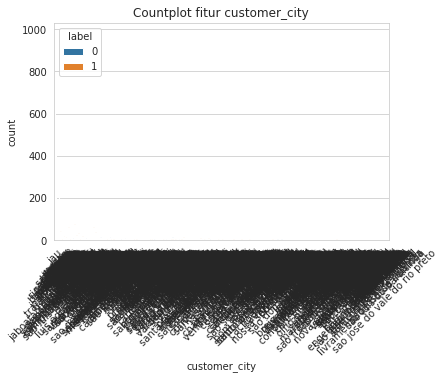

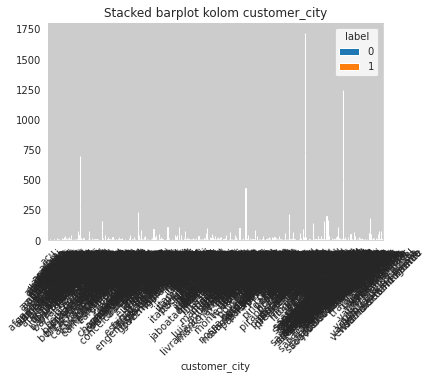

2  customer_state


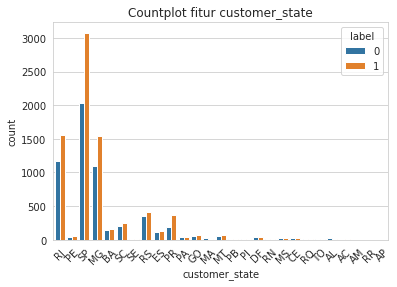

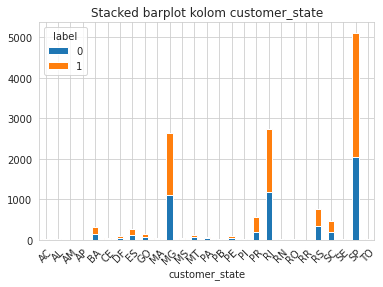

3  geolocation_city


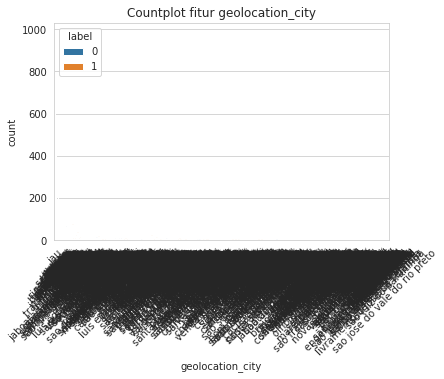

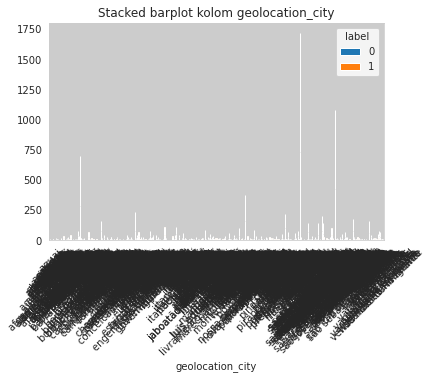

4  geolocation_state


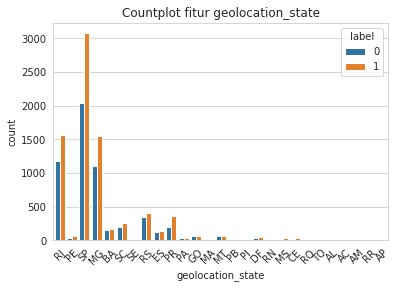

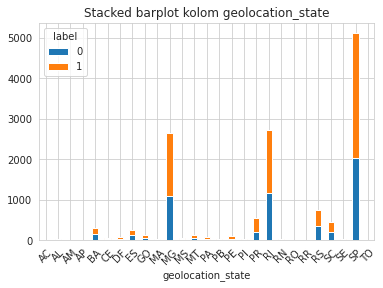

5  order_status


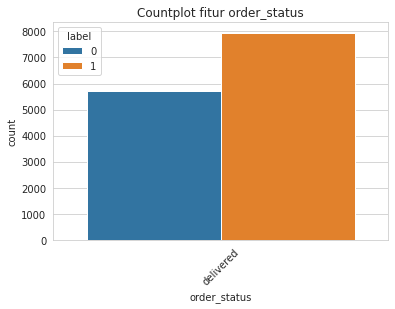

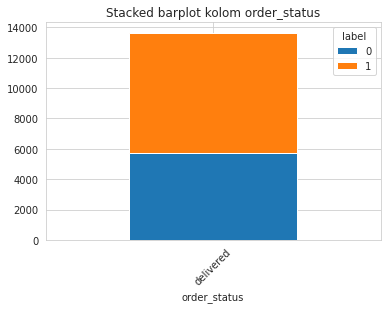

6  payment_type


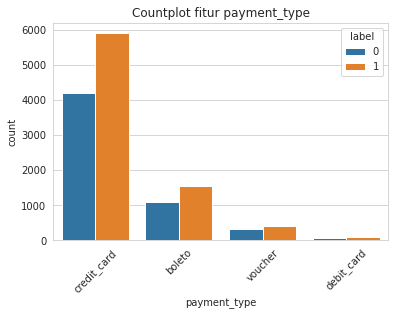

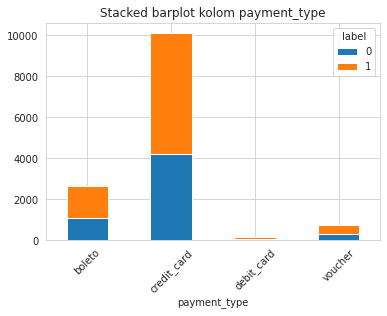

7  product_category_name


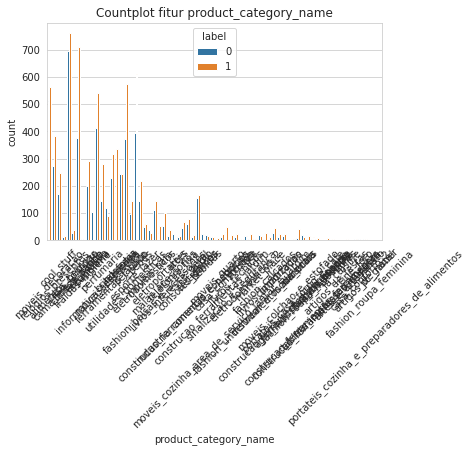

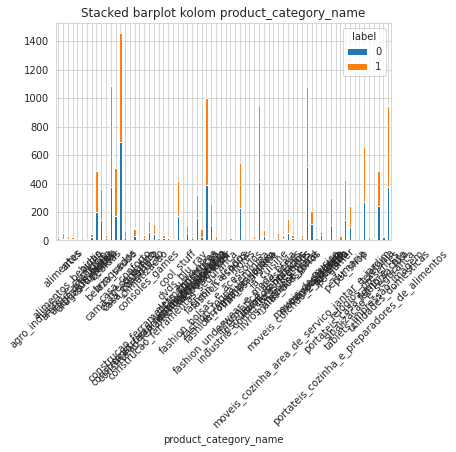

8  seller_city


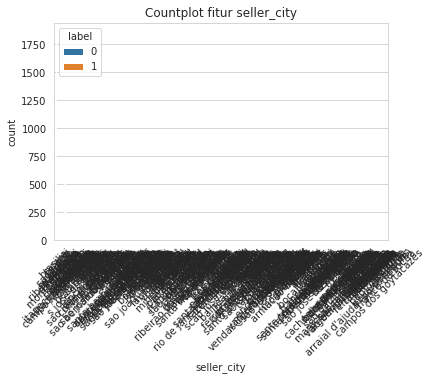

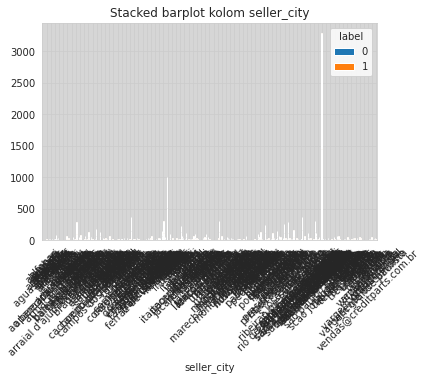

9  seller_state


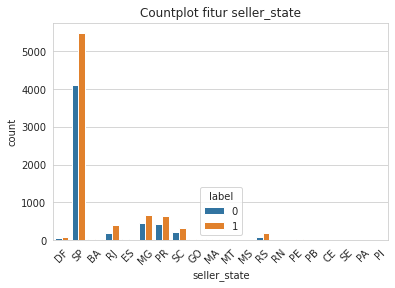

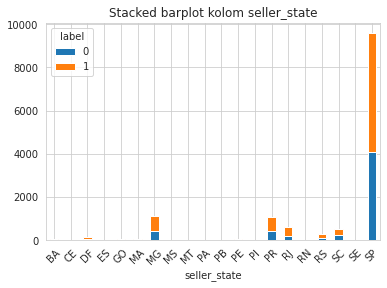

10  product_category_name_english


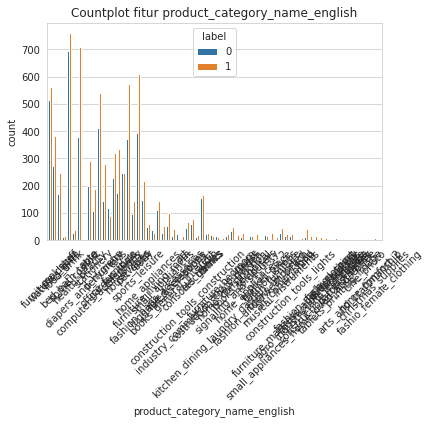

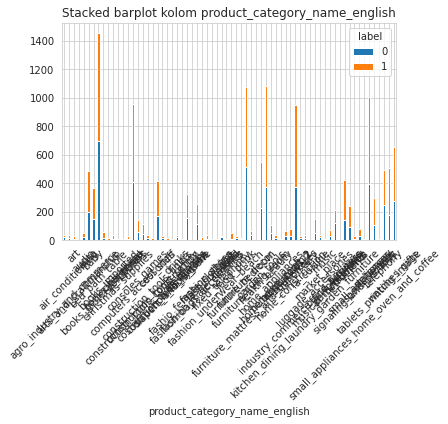

In [ ]:
a=1
for col in devset_dt_cat.columns:
  #countplot dengan hue attrition
      print(a,'',col)
      sns.countplot(data= devset_dt, x = col, hue = 'label')
      plt.title('Countplot fitur {}'.format(col))
      plt.xticks(rotation = 45)
      plt.show()

      # buat stacked barplot
      crt = pd.crosstab(index = devset_dt_cat[col], columns = devset_dt['label'])
      crt.plot(kind = 'bar', stacked = True)
      plt.title('Stacked barplot kolom {}'.format(col))
      plt.xticks(rotation = 45)
      plt.show()
      a+=1

#### datetime

In [ ]:
devset_dt_ts.head()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date
0,2017-03-20 21:55:02,2017-03-20 21:55:02,2017-03-23 12:22:48,2017-03-30 13:57:07,2017-04-12,2017-03-26 21:55:02
1,2018-05-10 11:23:03,2018-05-10 11:51:37,2018-05-16 15:29:00,2018-05-22 19:03:49,2018-06-14,2018-05-16 11:51:37
2,2018-03-19 12:14:50,2018-03-19 12:30:39,2018-03-20 17:58:50,2018-04-02 22:36:51,2018-04-19,2018-03-23 12:30:39
3,2017-07-20 12:00:22,2017-07-20 12:10:08,2017-07-24 16:24:55,2017-07-31 19:03:53,2017-08-21,2017-08-03 12:10:08
4,2018-01-02 10:32:22,2018-01-03 04:33:26,2018-01-08 19:42:58,2018-01-22 22:19:07,2018-02-14,2018-01-12 04:33:26


In [ ]:
# selish waktu

In [ ]:
purchase = devset_dt_ts['order_purchase_timestamp']
approved = devset_dt_ts['order_approved_at']
odcarr = devset_dt_ts['order_delivered_carrier_date']
odcust = devset_dt_ts['order_delivered_customer_date']
estdel = devset_dt_ts['order_estimated_delivery_date']
shiplim = devset_dt_ts['shipping_limit_date']

In [ ]:
#selish ke waktu purchase
diff_appr_purc = abs(approved-purchase)
diff_odcarr_purc = abs(odcarr - purchase)
diff_odcust_purc = abs(odcust - purchase)

#selish ke waktu approved
diff_ordcarr_appr = abs(odcarr - approved)
diff_odcust_appr = abs(odcust - approved)

#selish waktu delivered carrier ke delivered customer
diff_odcust = abs(odcust - odcarr)

In [ ]:
difference = pd.DataFrame(diff_appr_purc, columns= ['difference_approved_purchase'])
difference['difference_deliveredcarrier_purchase'] = diff_odcarr_purc
difference['difference_deliveredcustomer_purchase'] = diff_odcust_purc
difference['difference_deliveredcarrier_approved'] = diff_ordcarr_appr
difference['difference_deliveredcustomer_approved'] = diff_odcust_appr
difference['difference_deliveredcarrier_delivered_customer'] = diff_odcust


In [ ]:
difference.head()

,difference_approved_purchase,difference_deliveredcarrier_purchase,difference_deliveredcustomer_purchase,difference_deliveredcarrier_approved,difference_deliveredcustomer_approved,difference_deliveredcarrier_delivered_customer
0,0 days 00:00:00,2 days 14:27:46,9 days 16:02:05,2 days 14:27:46,9 days 16:02:05,7 days 01:34:19
1,0 days 00:28:34,6 days 04:05:57,12 days 07:40:46,6 days 03:37:23,12 days 07:12:12,6 days 03:34:49
2,0 days 00:15:49,1 days 05:44:00,14 days 10:22:01,1 days 05:28:11,14 days 10:06:12,13 days 04:38:01
3,0 days 00:09:46,4 days 04:24:33,11 days 07:03:31,4 days 04:14:47,11 days 06:53:45,7 days 02:38:58
4,0 days 18:01:04,6 days 09:10:36,20 days 11:46:45,5 days 15:09:32,19 days 17:45:41,14 days 02:36:09


In [ ]:
difference.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 6 columns):
 #   Column                                          Non-Null Count  Dtype          
---  ------                                          --------------  -----          
 0   difference_approved_purchase                    13642 non-null  timedelta64[ns]
 1   difference_deliveredcarrier_purchase            13645 non-null  timedelta64[ns]
 2   difference_deliveredcustomer_purchase           13645 non-null  timedelta64[ns]
 3   difference_deliveredcarrier_approved            13642 non-null  timedelta64[ns]
 4   difference_deliveredcustomer_approved           13642 non-null  timedelta64[ns]
 5   difference_deliveredcarrier_delivered_customer  13645 non-null  timedelta64[ns]
dtypes: timedelta64[ns](6)
memory usage: 639.7 KB


In [ ]:
# import datetime
# from datetime import datetime
# from datetime import timedelta

In [ ]:
#np.min(difference['difference_deliveredcarrier_purchase'])

In [ ]:
#np.max(difference[])

In [ ]:
# b = difference['difference_approved_purchase'].dt.total_seconds()/60
# np.max(b)

In [ ]:
# setiap kolom ubah ke total hari
difference_new = pd.DataFrame((difference['difference_approved_purchase'].dt.total_seconds() / 86400),columns= ['difference_approved_purchase'])
difference_new['difference_deliveredcarrier_purchase'] = difference['difference_deliveredcarrier_purchase'].dt.total_seconds() / 86400
difference_new['difference_deliveredcustomer_purchase'] = difference['difference_deliveredcustomer_purchase'].dt.total_seconds() / 86400
difference_new['difference_deliveredcarrier_approved'] = difference['difference_deliveredcarrier_approved'].dt.total_seconds() / 86400
difference_new['difference_deliveredcustomer_approved'] = difference['difference_deliveredcustomer_approved'].dt.total_seconds() / 86400
difference_new['difference_deliveredcarrier_delivered_customer'] = difference['difference_deliveredcarrier_delivered_customer'].dt.total_seconds() / 86400

In [ ]:
difference_new.head()

,difference_approved_purchase,difference_deliveredcarrier_purchase,difference_deliveredcustomer_purchase,difference_deliveredcarrier_approved,difference_deliveredcustomer_approved,difference_deliveredcarrier_delivered_customer
0,0.000000,2.602616,9.668113,2.602616,9.668113,7.065498
1,0.019838,6.170799,12.319977,6.150961,12.300139,6.149178
2,0.010984,1.238889,14.431956,1.227905,14.420972,13.193067
3,0.006782,4.183715,11.294109,4.176933,11.287326,7.110394
4,0.750741,6.382361,20.490799,5.631620,19.740058,14.108438


In [ ]:
label_c = devset['label']
difference_new_l = difference_new.copy()
difference_new_l['label'] = label_c

histogram dan boxplot masing-masing selisih waktu

1 | difference_approved_purchase


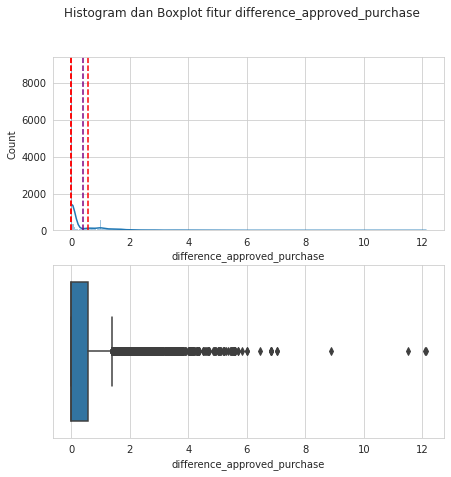

Metrik statistik dasar
count    13642.000000
mean         0.412976
std          0.819299
min          0.000000
25%          0.008877
50%          0.013924
75%          0.565550
max         12.126262
Name: difference_approved_purchase, dtype: float64

Whisker dan Outlier
lower whisker: 0.0
Upper whisker: 1.4003125
Outlier count: 1414
Outlier list:  [1.4842361111111113, 1.644201388888889, 2.7139236111111114, 1.4598611111111113, 1.644074074074074, 1.7641550925925926, 2.0192361111111112, 1.661875, 4.201134259259259, 3.4574074074074073, 3.5755324074074073, 2.5572222222222223, 2.6230555555555557, 1.693113425925926, 1.5638541666666668, 1.8071296296296295, 1.6005208333333334, 2.3715625, 1.9980902777777778, 2.2019675925925926, 1.4323611111111112, 2.0455092592592594, 2.0375925925925924, 4.097835648148148, 1.7452546296296296, 5.375254629629629, 2.7267939814814817, 1.431377314814815, 2.778263888888889, 2.706354166666667, 1.6621412037037038, 3.7428819444444446, 1.4894560185185186, 2.821458333333333

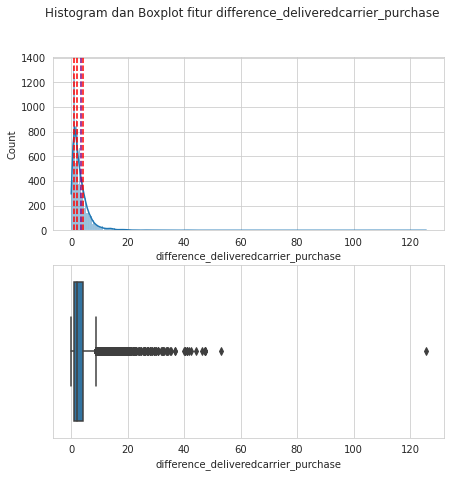

Metrik statistik dasar
count    13645.000000
mean         3.297395
std          3.784788
min          0.000347
25%          1.119549
50%          2.223715
75%          4.144919
max        125.775521
Name: difference_deliveredcarrier_purchase, dtype: float64

Whisker dan Outlier
lower whisker: 0.0003472222222222223
Upper whisker: 8.678298611111112
Outlier count: 754
Outlier list:  [8.693460648148148, 27.858391203703704, 9.51457175925926, 9.274548611111111, 8.883171296296297, 14.169502314814816, 10.343715277777777, 19.067939814814814, 19.24326388888889, 15.352951388888888, 26.67451388888889, 25.841666666666665, 9.0709375, 14.032395833333334, 9.09707175925926, 10.025729166666666, 25.971712962962965, 9.127407407407407, 10.286875, 11.049108796296297, 9.113391203703705, 24.155173611111113, 12.813414351851852, 10.600671296296296, 14.006215277777779, 22.73599537037037, 11.892650462962964, 12.588715277777778, 18.77232638888889, 10.373773148148148, 14.203587962962963, 9.142314814814815, 9.451157

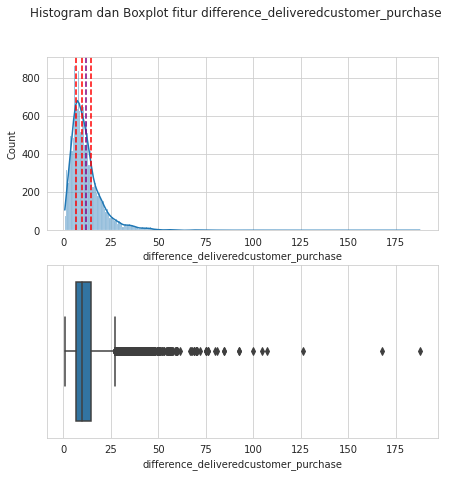

Metrik statistik dasar
count    13645.000000
mean        12.152324
std          8.821865
min          0.935984
25%          6.725903
50%         10.133576
75%         14.935509
max        187.743843
Name: difference_deliveredcustomer_purchase, dtype: float64

Whisker dan Outlier
lower whisker: 0.9359837962962962
Upper whisker: 27.24570601851852
Outlier count: 743
Outlier list:  [36.06597222222222, 48.08261574074075, 41.685775462962965, 31.123877314814816, 29.00369212962963, 36.829282407407405, 46.0704050925926, 167.94375, 38.81232638888889, 33.98810185185185, 27.660439814814815, 33.03287037037037, 33.80003472222222, 34.37261574074074, 31.084675925925925, 27.50287037037037, 50.93423611111111, 36.281342592592594, 41.007835648148145, 68.73129629629629, 30.132233796296298, 29.857164351851853, 35.962673611111114, 56.28534722222222, 44.388784722222226, 38.25748842592593, 34.82138888888889, 30.950671296296296, 84.6503125, 59.28813657407407, 33.17828703703704, 32.053530092592595, 37.3969560185

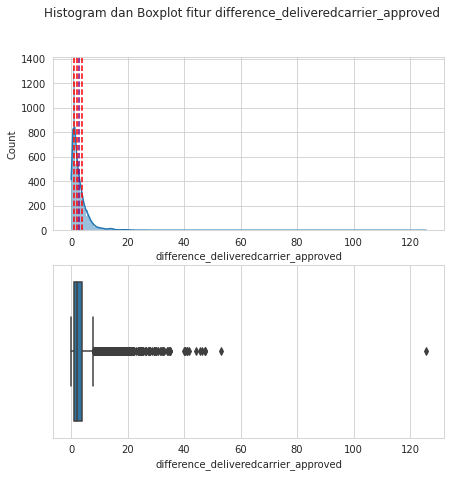

Metrik statistik dasar
count    13642.000000
mean         2.907873
std          3.697283
min          0.001366
25%          0.895914
50%          1.883264
75%          3.697812
max        125.762569
Name: difference_deliveredcarrier_approved, dtype: float64

Whisker dan Outlier
lower whisker: 0.001365740740740741
Upper whisker: 7.897245370370371
Outlier count: 771
Outlier list:  [8.044039351851852, 8.684664351851852, 8.130844907407408, 27.360277777777778, 8.75707175925926, 9.268587962962963, 14.126342592592593, 19.012766203703702, 19.23212962962963, 13.752430555555556, 24.30295138888889, 23.79615740740741, 14.025682870370371, 10.01625, 8.432175925925925, 24.540335648148147, 9.116180555555555, 10.277314814814815, 23.562847222222224, 8.346458333333333, 10.527731481481482, 10.591469907407408, 13.957025462962964, 21.731597222222224, 10.276608796296296, 12.549733796296296, 18.75689814814815, 8.458680555555556, 14.190555555555555, 7.95849537037037, 8.205497685185184, 8.845891203703705, 15.57

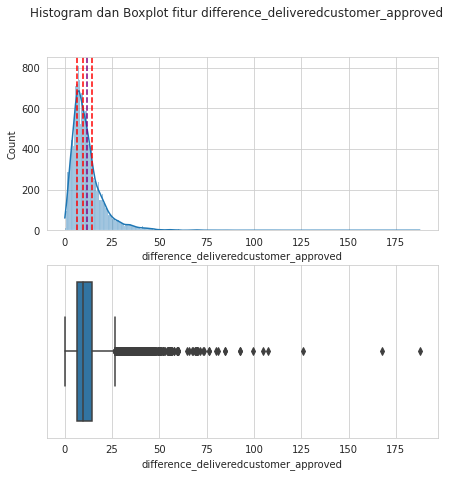

Metrik statistik dasar
count    13642.000000
mean        11.740566
std          8.784792
min          0.028299
25%          6.312477
50%          9.720341
75%         14.431895
max        187.743843
Name: difference_deliveredcustomer_approved, dtype: float64

Whisker dan Outlier
lower whisker: 0.02829861111111111
Upper whisker: 26.586747685185184
Outlier count: 766
Outlier list:  [36.05575231481482, 48.077592592592595, 41.65304398148148, 31.11375, 28.996122685185185, 36.33116898148148, 46.06120370370371, 167.93599537037036, 26.804212962962964, 38.80170138888889, 33.97980324074074, 27.653796296296296, 33.02545138888889, 33.788900462962964, 34.36258101851852, 29.3915625, 27.491724537037037, 50.92452546296296, 36.270891203703705, 38.63627314814815, 67.50699074074075, 30.120555555555555, 29.848842592592593, 33.91716435185185, 27.100914351851852, 56.27325231481481, 44.380023148148155, 37.48511574074074, 33.55105324074074, 29.519293981481482, 84.6444212962963, 59.27690972222222, 31.688831018

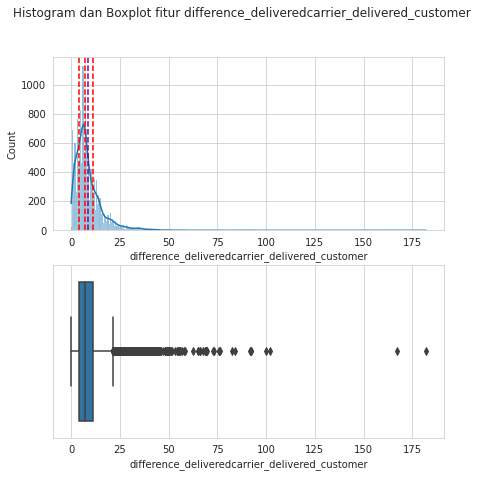

Metrik statistik dasar
count    13645.000000
mean         8.867821
std          7.901036
min          0.000000
25%          4.155301
50%          7.015694
75%         11.126620
max        182.100000
Name: difference_deliveredcarrier_delivered_customer, dtype: float64

Whisker dan Outlier
lower whisker: 0.0
Upper whisker: 21.581238425925925
Outlier count: 786
Outlier list:  [35.12525462962963, 44.15248842592593, 37.99302083333333, 29.23267361111111, 43.73394675925926, 167.00950231481482, 23.466180555555557, 34.06280092592593, 25.114907407407408, 31.982523148148147, 25.846458333333334, 32.03519675925926, 27.346180555555556, 25.079386574074075, 23.968750000000004, 50.10403935185185, 34.15289351851852, 65.94347222222223, 29.2465625, 27.992638888888887, 55.77766203703704, 40.89472222222222, 34.896967592592596, 25.027928240740742, 31.85827546296296, 82.77721064814814, 50.16072916666667, 28.130787037037038, 23.187650462962967, 23.587395833333336, 30.97133101851852, 25.354791666666667, 21.7651

In [ ]:
a = 1
for col in difference_new.columns:
  print(a,'|', col )

  # histogram dan boxplot untuk tiap fitur numerik
  fig, axs = plt.subplots(2,1)
  fig.set_size_inches(7,7)

  sns.histplot(data = difference_new, x = col, kde = True, ax = axs[0])
  axs[0].axvline(np.nanpercentile(difference_new[col], 25), c = 'r', linestyle = '--')
  axs[0].axvline(np.nanpercentile(difference_new[col], 50), c = 'r', linestyle = '--')
  axs[0].axvline(np.nanpercentile(difference_new[col], 75), c = 'r', linestyle = '--')
  axs[0].axvline(np.mean(difference_new[col]), color = 'purple', linestyle='--')

  sns.boxplot(data = difference_new, x = col, ax = axs[1])

  fig.suptitle('Histogram dan Boxplot fitur {}'.format(col))
  plt.show()
  
  # metrik statistik dasar dengan describe()
  print('Metrik statistik dasar')
  print(difference_new[col].describe())
  print('')

  # lower whisker, upper whisker, non outlier, outlier
  print('Whisker dan Outlier')
  whisk(difference_new[col])
  print('')

  # Hitung skew
  print('Skew dan Skew test')
  skw = skew(difference_new[col])
  stats, p_value = skewtest(difference_new[col])
  if p_value > 0.05:
    print('Data skewed, dengan skew: {}'.format(skw))
  else:
    print('Data tidak skew')

  print("_" * 75)
  print('')

  a += 1

Plot histogram masing-masing selisih dengan hue= label

1  difference_approved_purchase


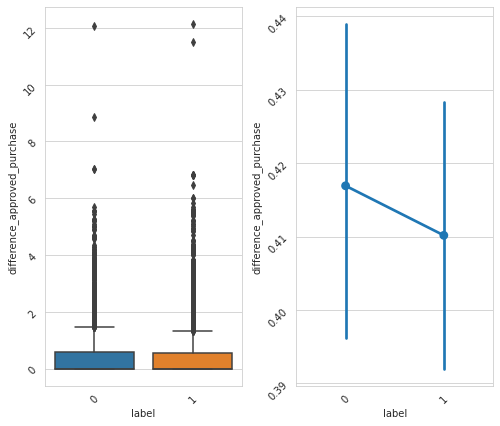

Confidence interval 95% untuk difference_approved_purchase pada buyer yang memberi rating di bawah 5 adalah (0.3957827017408972, 0.43803101054884247)
Confidence interval 95% untuk difference_approved_purchase pada buyer yang memberi rating 5 adalah (0.39205081640010775, 0.42826909578371675)
**************************************************
2  difference_deliveredcarrier_purchase


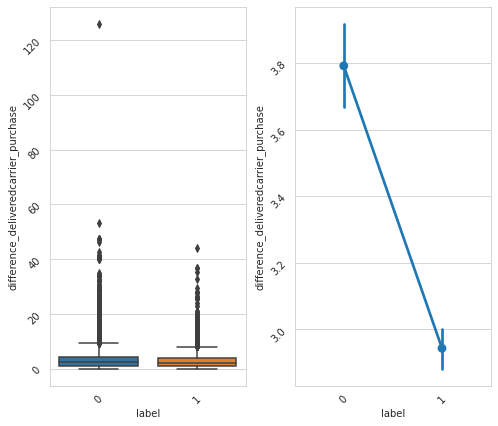

Confidence interval 95% untuk difference_deliveredcarrier_purchase pada buyer yang memberi rating di bawah 5 adalah (3.66903732843455, 3.913707815981285)
Confidence interval 95% untuk difference_deliveredcarrier_purchase pada buyer yang memberi rating 5 adalah (2.8797157275721688, 3.0071354020830876)
**************************************************
3  difference_deliveredcustomer_purchase


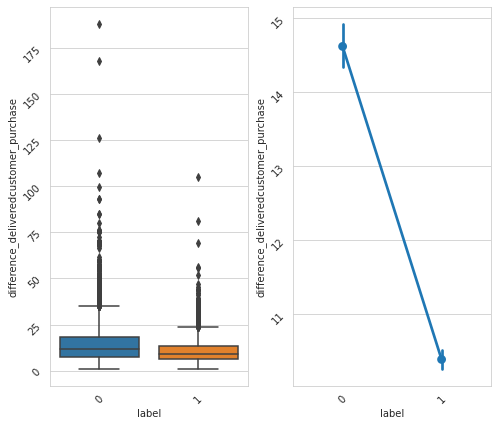

Confidence interval 95% untuk difference_deliveredcustomer_purchase pada buyer yang memberi rating di bawah 5 adalah (14.321492993078442, 14.89943524928787)
Confidence interval 95% untuk difference_deliveredcustomer_purchase pada buyer yang memberi rating 5 adalah (10.256286720291483, 10.525510352366153)
**************************************************
4  difference_deliveredcarrier_approved


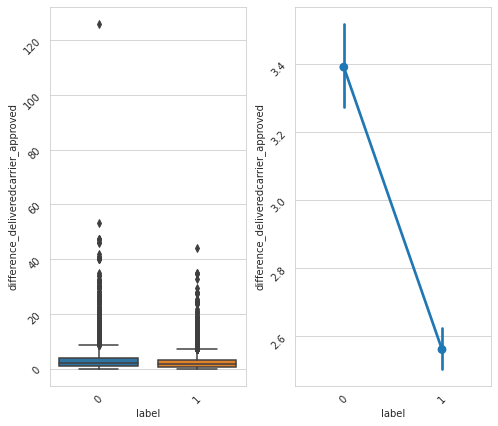

Confidence interval 95% untuk difference_deliveredcarrier_approved pada buyer yang memberi rating di bawah 5 adalah (3.271416539752933, 3.512066951641517)
Confidence interval 95% untuk difference_deliveredcarrier_approved pada buyer yang memberi rating 5 adalah (2.499805327324556, 2.62264773855272)
**************************************************
5  difference_deliveredcustomer_approved


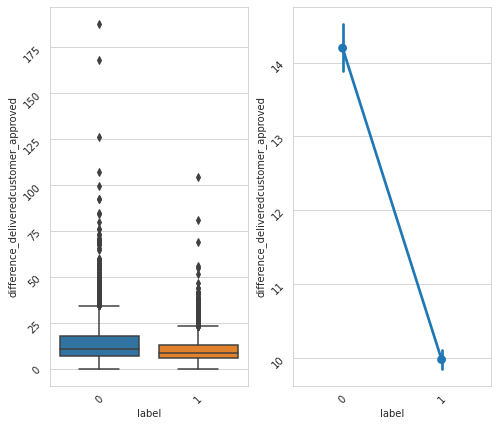

Confidence interval 95% untuk difference_deliveredcustomer_approved pada buyer yang memberi rating di bawah 5 adalah (13.90652790771113, 14.482734246082988)
Confidence interval 95% untuk difference_deliveredcustomer_approved pada buyer yang memberi rating 5 adalah (9.8488440389677, 10.116070037948925)
**************************************************
6  difference_deliveredcarrier_delivered_customer


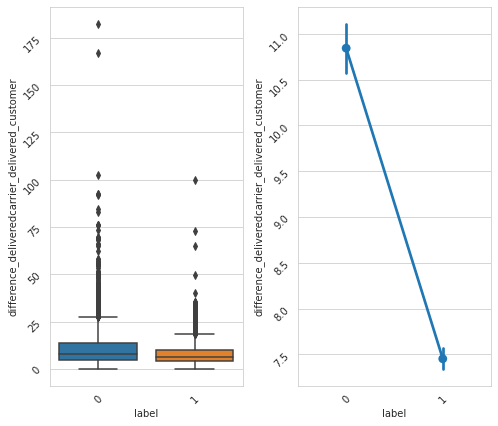

Confidence interval 95% untuk difference_deliveredcarrier_delivered_customer pada buyer yang memberi rating di bawah 5 adalah (10.579685006981535, 11.108001803775856)
Confidence interval 95% untuk difference_deliveredcarrier_delivered_customer pada buyer yang memberi rating 5 adalah (7.33499557821167, 7.5687376743987205)
**************************************************


In [ ]:
n1 = len(devset_dt_num[devset_dt_num['label']== 0])
n2 = len(devset_dt_num[devset_dt_num['label']== 1])

a = 1
for col in difference_new.columns:
    print(a,'',col )
    fig, ax = plt.subplots(1,2)
    fig.set_size_inches(7,6)
    # buat boxplot
    sns.boxplot(data = difference_new_l, x='label', y=col, ax=ax[0])
    
    # buat pointplot
    sns.pointplot(data = difference_new_l, x='label', y=col, ax=ax[1])
    
    plt.tight_layout()
    ax[0].tick_params(rotation=45)
    ax[1].tick_params(rotation=45)
    plt.show()
    
    # confidence interval buyer memberi rating di bawah 5

    ci1 = t.interval(alpha = 0.95,
                    df = len(difference_new_l[difference_new_l['label'] == 0]) - 1,
                    loc = difference_new_l[difference_new_l['label'] == 0 ][col].mean(), 
                    scale = difference_new_l[difference_new_l['label'] ==0 ][col].std()/(n1**(1/2)))
    
    print('Confidence interval 95% untuk {} pada buyer yang memberi rating di bawah 5 adalah {}'.format(col, ci1))
    
    # confidence interval buer memberi rating 5
    
    ci2 = t.interval(alpha = 0.95,
                    df = len(difference_new_l[difference_new_l['label'] ==1]) - 1,
                    loc = difference_new_l[difference_new_l['label'] ==1][col].mean(), 
                    scale = difference_new_l[difference_new_l['label'] ==1][col].std()/(n2**(1/2)))
    
    print('Confidence interval 95% untuk {} pada buyer yang memberi rating 5 adalah {}'.format(col, ci2))
    
    # # ind ttest
    
    # stat, pvalue = ttest_ind(difference_new_l[difference_new_l['label'] == 0][col],
    #                          difference_new_l[difference_new_l['label'] == 0][col])
    
    # if pvalue < 0.05:
    #     print('Tolak H(0)')
    # else:
    #     print('Gagal menolak H(0)')
    print('*'*50)
    a += 1

1 difference_approved_purchase - difference_deliveredcarrier_purchase


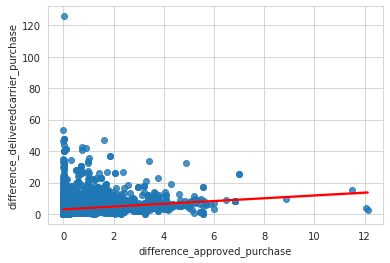

SpearmanrResult(correlation=0.2328632922120269, pvalue=2.006896275623344e-167)
__________________________________________________
3 difference_approved_purchase - difference_deliveredcustomer_purchase


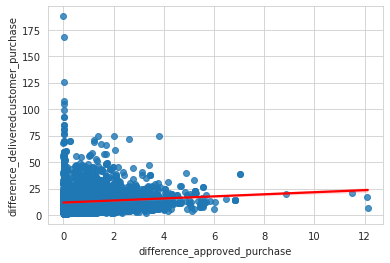

SpearmanrResult(correlation=0.0906547087518974, pvalue=2.665386262961153e-26)
__________________________________________________
5 difference_approved_purchase - difference_deliveredcarrier_approved


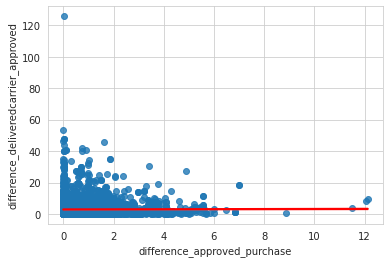

SpearmanrResult(correlation=-0.04369789554606166, pvalue=3.2835096986045145e-07)
__________________________________________________
7 difference_approved_purchase - difference_deliveredcustomer_approved


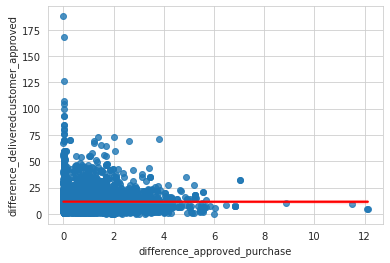

SpearmanrResult(correlation=-0.0018860249728977262, pvalue=0.8256452984100072)
__________________________________________________
9 difference_approved_purchase - difference_deliveredcarrier_delivered_customer


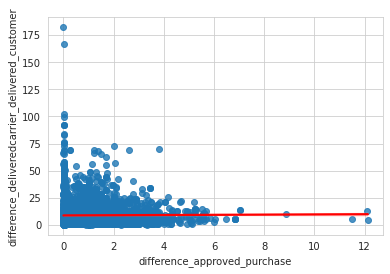

SpearmanrResult(correlation=0.0038910462427317865, pvalue=0.649483202187588)
__________________________________________________
11 difference_deliveredcarrier_purchase - difference_deliveredcustomer_purchase


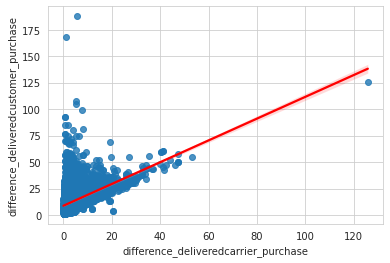

SpearmanrResult(correlation=0.44310178548300544, pvalue=0.0)
__________________________________________________
13 difference_deliveredcarrier_purchase - difference_deliveredcarrier_approved


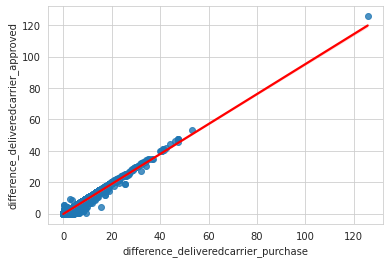

SpearmanrResult(correlation=0.9009695001585131, pvalue=0.0)
__________________________________________________
15 difference_deliveredcarrier_purchase - difference_deliveredcustomer_approved


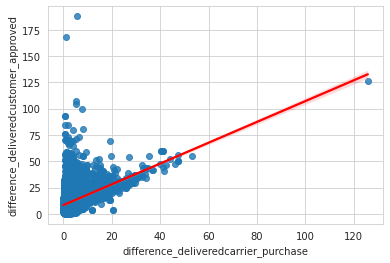

SpearmanrResult(correlation=0.4067920115774151, pvalue=0.0)
__________________________________________________
17 difference_deliveredcarrier_purchase - difference_deliveredcarrier_delivered_customer


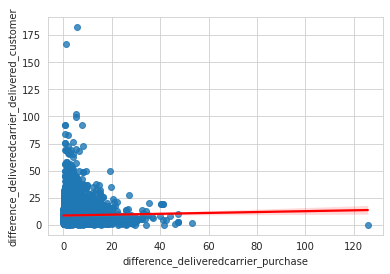

SpearmanrResult(correlation=0.05249469942858296, pvalue=8.480115661382786e-10)
__________________________________________________
19 difference_deliveredcustomer_purchase - difference_deliveredcarrier_approved


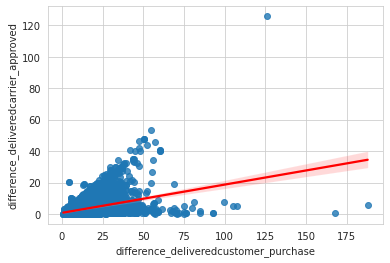

SpearmanrResult(correlation=0.41072811602284454, pvalue=0.0)
__________________________________________________
21 difference_deliveredcustomer_purchase - difference_deliveredcustomer_approved


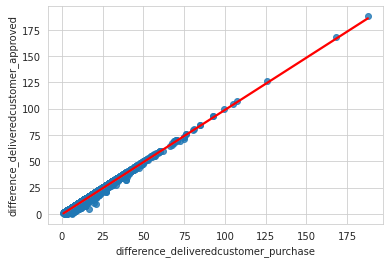

SpearmanrResult(correlation=0.9889191799393298, pvalue=0.0)
__________________________________________________
23 difference_deliveredcustomer_purchase - difference_deliveredcarrier_delivered_customer


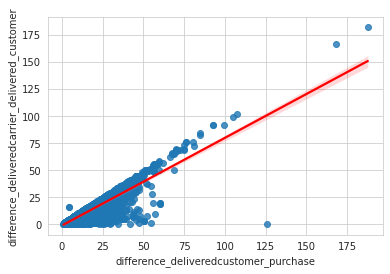

SpearmanrResult(correlation=0.8728866003414127, pvalue=0.0)
__________________________________________________
25 difference_deliveredcarrier_approved - difference_deliveredcustomer_approved


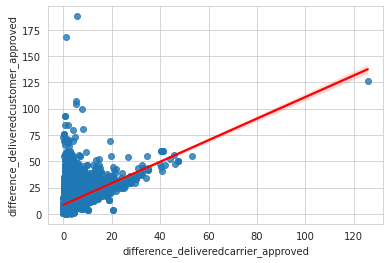

SpearmanrResult(correlation=0.42341269407684407, pvalue=0.0)
__________________________________________________
27 difference_deliveredcarrier_approved - difference_deliveredcarrier_delivered_customer


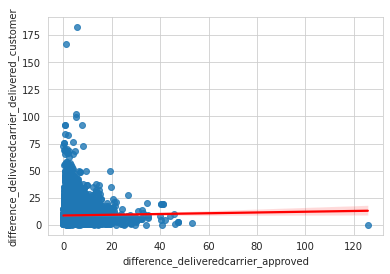

SpearmanrResult(correlation=0.04969292037830326, pvalue=6.33079741990524e-09)
__________________________________________________
29 difference_deliveredcustomer_approved - difference_deliveredcarrier_delivered_customer


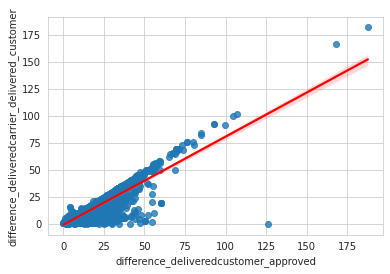

SpearmanrResult(correlation=0.8775069990589492, pvalue=0.0)
__________________________________________________


In [ ]:
a = 1
for x, y, in itertools.combinations(difference_new, 2):

    print (a,'{} - {}'.format(x,y))

    sns.set_style('whitegrid')
    sns.regplot(data = difference_new_l, x=x, y=y, line_kws={'color':'red'})#, hue='label', palette='bright', alpha=0.8)
    plt.show()
    
    # normal test
    stats, pvalue = normaltest(difference_new[x])
    stats2, pvalue2 = normaltest(difference_new[y])

    if pvalue > 0.05:
        if pvalue2 > 0.05:
            print(pearsonr(difference_new[x], difference_new[y]))
    else:
        print(spearmanr(difference_new[x], difference_new[y]))
                
    print('_'*50)
    a += 1
    done.append([x,y])        

    a+=1

1 difference_approved_purchase - difference_deliveredcarrier_purchase


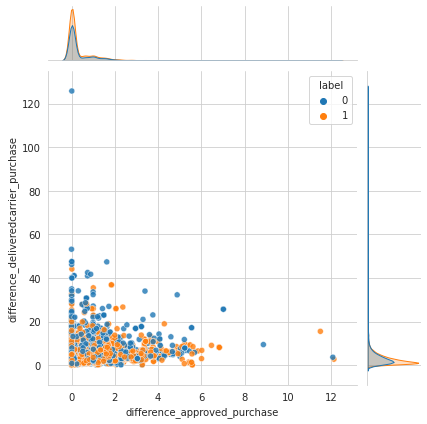

2 difference_approved_purchase - difference_deliveredcustomer_purchase


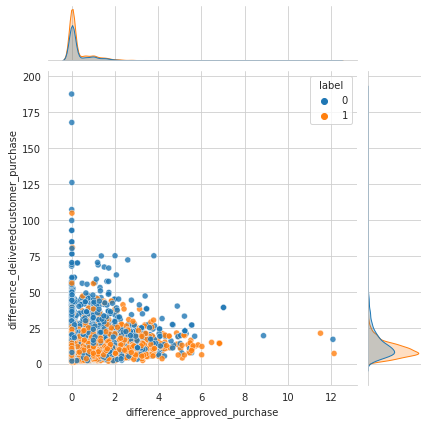

3 difference_approved_purchase - difference_deliveredcarrier_approved


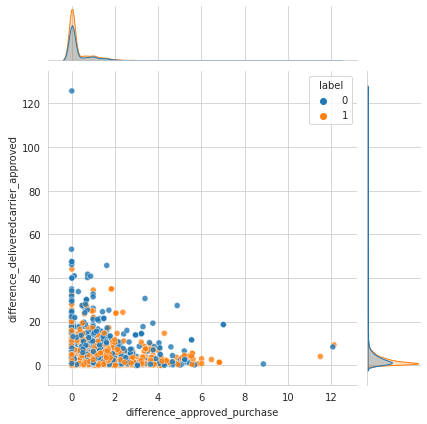

4 difference_approved_purchase - difference_deliveredcustomer_approved


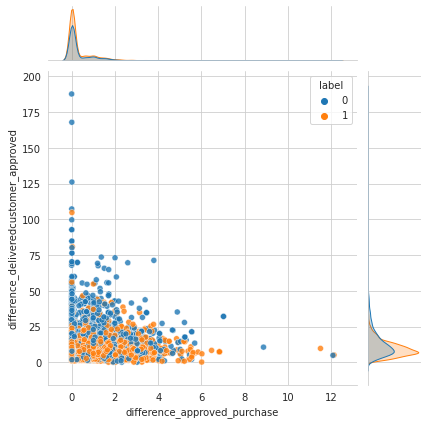

5 difference_approved_purchase - difference_deliveredcarrier_delivered_customer


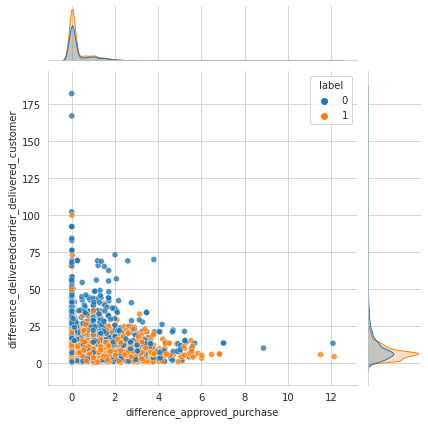

6 difference_deliveredcarrier_purchase - difference_deliveredcustomer_purchase


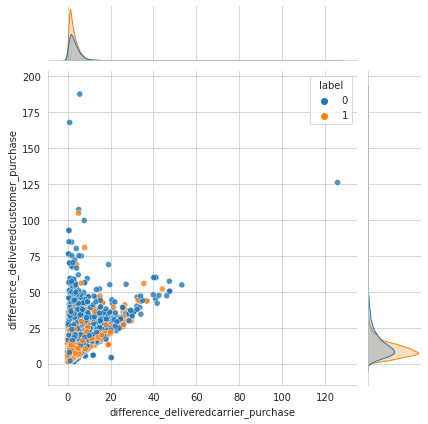

7 difference_deliveredcarrier_purchase - difference_deliveredcarrier_approved


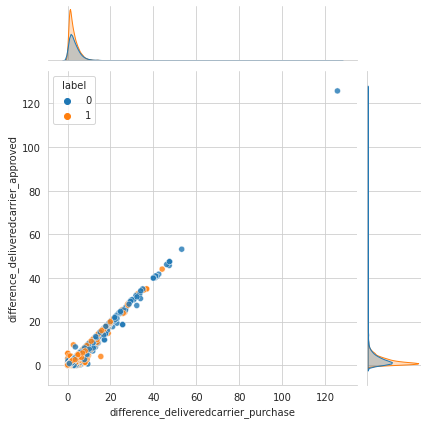

8 difference_deliveredcarrier_purchase - difference_deliveredcustomer_approved


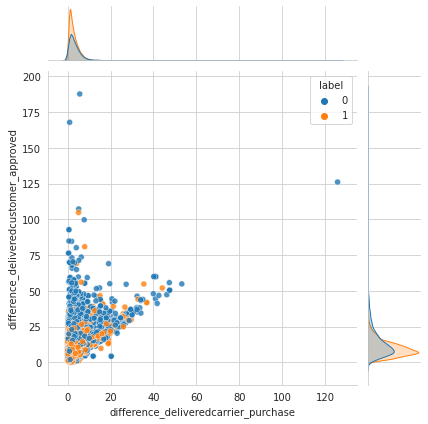

9 difference_deliveredcarrier_purchase - difference_deliveredcarrier_delivered_customer


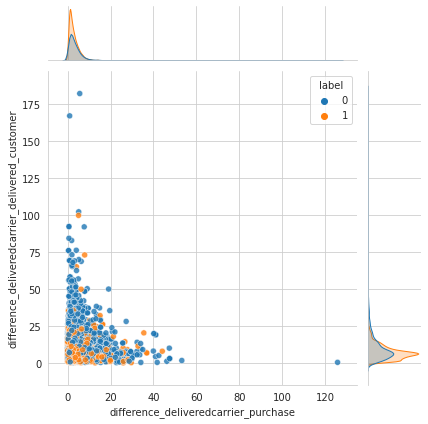

10 difference_deliveredcustomer_purchase - difference_deliveredcarrier_approved


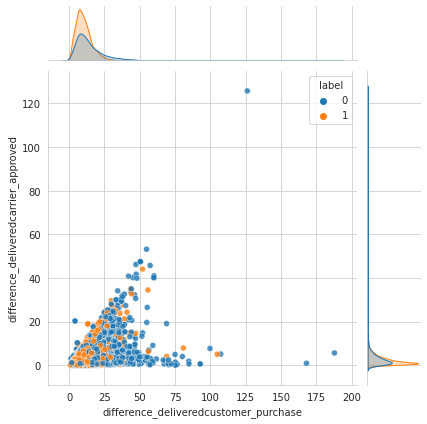

11 difference_deliveredcustomer_purchase - difference_deliveredcustomer_approved


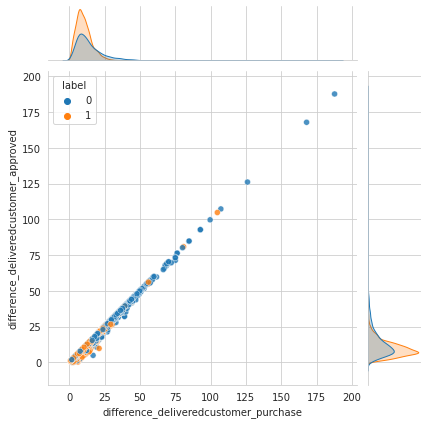

12 difference_deliveredcustomer_purchase - difference_deliveredcarrier_delivered_customer


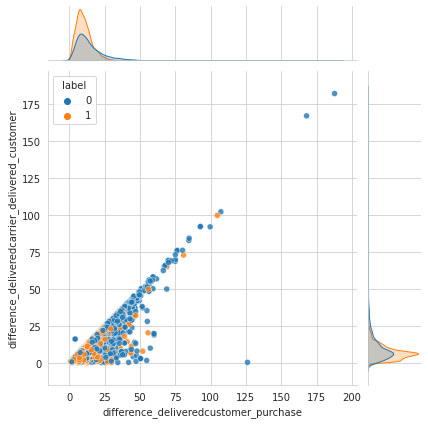

13 difference_deliveredcarrier_approved - difference_deliveredcustomer_approved


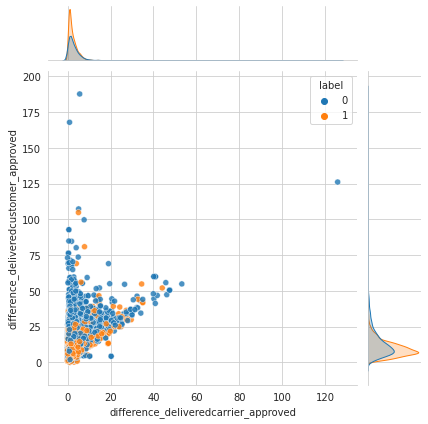

14 difference_deliveredcarrier_approved - difference_deliveredcarrier_delivered_customer


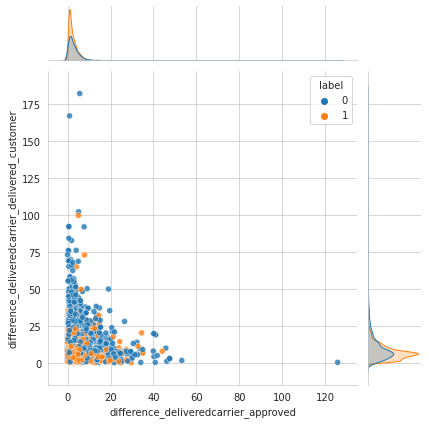

15 difference_deliveredcustomer_approved - difference_deliveredcarrier_delivered_customer


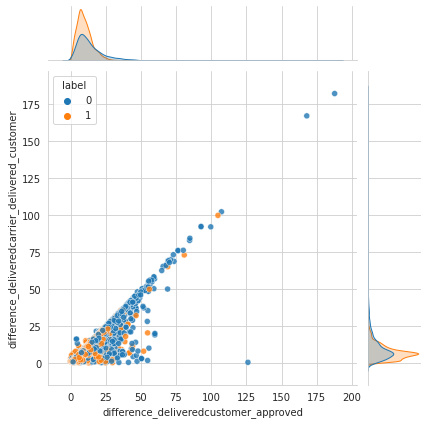

In [ ]:
a = 1
for x, y, in itertools.combinations(difference_new, 2):

    print (a,'{} - {}'.format(x,y))

    sns.set_style('whitegrid')
    sns.jointplot(data = difference_new_l, x=x, y=y, hue='label', alpha=0.8)
    plt.show()
    a+=1

### Data Preparation & feature Engineering

drop fitur yang tidak diperlukan (untuk pembuatan model)

In [ ]:
devset_fs = devset.drop(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
                             'geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng',
                             'order_id', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date',
                             'order_delivered_customer_date', 'order_estimated_delivery_date', 'product_id', 
                             'seller_id', 'shipping_limit_date', 'order_item_id', 'seller_zip_code_prefix'], axis = 1)

Subset

In [ ]:
X = devset_fs.drop(['label'], axis =1)
y = devset_fs['label']

#### train test split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state =42)

In [ ]:
X_train.shape

(10916, 22)

In [ ]:
X_test.shape

(2729, 22)

#### Training set

#### Missing value Handling

In [ ]:
X_train.isna().sum()/len(X_train)*100

customer_city                    0.000000
customer_state                   0.000000
geolocation_city                 0.000000
geolocation_state                0.000000
order_status                     0.000000
price                            0.000000
freight_value                    0.000000
payment_sequential               0.009161
payment_type                     0.009161
payment_installments             0.009161
payment_value                    0.009161
product_category_name            1.310004
product_name_lenght              1.310004
product_description_lenght       1.310004
product_photos_qty               1.310004
product_weight_g                 0.036643
product_length_cm                0.036643
product_height_cm                0.036643
product_width_cm                 0.036643
seller_city                      0.000000
seller_state                     0.000000
product_category_name_english    1.328325
dtype: float64

In [ ]:
# numerik dan kategorik
X_train_num = X_train.select_dtypes('number')
X_train_cat = X_train.select_dtypes('object')

In [ ]:
X_train_num.head()

,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
10212,56.90,11.90,1.0,2.0,26.54,56.0,1245.0,5.0,350.0,22.0,8.0,19.0
11331,99.90,14.47,1.0,1.0,114.37,54.0,1594.0,2.0,1600.0,60.0,5.0,36.0
9838,219.90,16.65,1.0,8.0,473.10,60.0,233.0,1.0,2600.0,46.0,8.0,38.0
4835,59.90,23.35,1.0,1.0,83.25,60.0,1953.0,1.0,750.0,69.0,11.0,11.0
10064,37.99,1.09,1.0,8.0,224.83,38.0,437.0,1.0,1900.0,45.0,6.0,20.0


In [ ]:
#simple imputer (strategy = median) untuk fitur numerik
si_num = SimpleImputer(strategy='median')
X_train_imp_num = pd.DataFrame(si_num.fit_transform(X_train_num), columns=si_num.feature_names_in_)

In [ ]:
X_train_imp_num.isna().sum()/len(X_train)

price                         0.0
freight_value                 0.0
payment_sequential            0.0
payment_installments          0.0
payment_value                 0.0
product_name_lenght           0.0
product_description_lenght    0.0
product_photos_qty            0.0
product_weight_g              0.0
product_length_cm             0.0
product_height_cm             0.0
product_width_cm              0.0
dtype: float64

In [ ]:
#simple imputer (strategy = mode) untuk kategorik
si_cat = SimpleImputer(strategy='most_frequent')
X_train_imp_cat = pd.DataFrame(si_cat.fit_transform(X_train_cat), columns=si_cat.feature_names_in_)

In [ ]:
X_train_imp_cat.isna().sum()/len(X_train_imp_cat)

customer_city                    0.0
customer_state                   0.0
geolocation_city                 0.0
geolocation_state                0.0
order_status                     0.0
payment_type                     0.0
product_category_name            0.0
seller_city                      0.0
seller_state                     0.0
product_category_name_english    0.0
dtype: float64

#### Transformasi

Train set

In [ ]:
# Scaling untuk fitur numerik
minmax = MinMaxScaler()
X_train_imp_num_scaled = pd.DataFrame(minmax.fit_transform(X_train_imp_num), columns = minmax.feature_names_in_)

In [ ]:
# OneHotEncoder
ohe = OneHotEncoder(handle_unknown = 'ignore')
X_train_imp_cat_ohe = pd.DataFrame(ohe.fit_transform(X_train_imp_cat).toarray(), columns=ohe.get_feature_names_out(ohe.feature_names_in_))

In [ ]:
# merge
X_train_transformed = pd.concat([X_train_imp_num_scaled, X_train_imp_cat_ohe], axis =1)

In [ ]:
X_train_transformed.shape

(10916, 2934)

#### Feature Selection

multicolinearity reduction

In [ ]:
#feature_comb = list(itertools.combinations(X_train_transformed.columns, 2))

In [ ]:
# drop = []
# for a, b in feature_comb:
#     coef, pvalue = spearmanr(X_train_transformed[a], X_train_transformed[b])
#     if pvalue < 0.05:
#         if coef > 0.8:
#             if b not in drop and a not in drop:
#                 drop.append(b)
#         elif coef < -0.8:
#             if b not in drop and a not in drop:
#                 drop.append(b)
        
# drop

In [ ]:
# X_train_sel = X_train_transformed.drop(drop, axis=1)

In [ ]:
# X_train_sel.shape

In [ ]:
# X_train_sel.to_csv('X_train_sel.csv', index = False)
# files.download('X_train_sel.csv')

mutual information

In [ ]:
# mi = mutual_info_classif(X_train_sel, y_train, random_state=42)
# X_train_sel_mi = pd.DataFrame({'feature': X_train_sel.columns, 'mi': mi}).sort_values('mi', ascending=False)

In [ ]:
# X_train_sel_mi

In [ ]:
# drop fitur dengan mi =0
# X_train_sel_mi([mi])

In [ ]:
# mi_0 = X_train_sel_mi['mi'] == 0
# X_train_sel_mi0 = X_train_sel_mi[mi_0]

In [ ]:
#X_train_sel_mi0

In [ ]:
# drop2 = X_train_sel_mi0['feature'].unique()

In [ ]:
#drop2

In [ ]:
# # featur selection2 (mi)
# X_train_sel2 = X_train_sel.drop(drop2, axis=1)

In [ ]:
# X_train_sel2.to_csv('X_train_sel2.csv', index = False)
# files.download('X_train_sel2.csv')

In [ ]:
#X_train_sel2 = pd.read_csv('X_train_sel2.csv')

In [ ]:
#X_train_sel2.shape

#### Testing set 

missing value handling

In [ ]:
# numerik dan kategorik
X_test_num = X_test.select_dtypes('number')
X_test_cat = X_test.select_dtypes('object')

In [ ]:
# simple imputer numerik
X_test_imp_num = pd.DataFrame(si_num.transform(X_test_num), columns=si_num.feature_names_in_)
# simple imputer kategorik
X_test_imp_cat = pd.DataFrame(si_cat.transform(X_test_cat), columns=si_cat.feature_names_in_)

transformasi

In [ ]:
# Scaling untuk fitur numerik
X_test_imp_cat_scaled = pd.DataFrame(minmax.transform(X_test_imp_num), columns = minmax.feature_names_in_)

# OneHotEncoder
X_test_imp_cat_ohe = pd.DataFrame(ohe.transform(X_test_imp_cat).toarray(), columns=ohe.get_feature_names_out(ohe.feature_names_in_))

In [ ]:
# merge
X_test_transformed = pd.concat([X_test_imp_cat_scaled, X_test_imp_cat_ohe], axis =1)

In [ ]:
X_test_transformed.shape

(2729, 2934)

features selection

In [ ]:
#X_test_sel = X_test_transformed[X_train_sel2.columns]

In [ ]:
X_test_sel.shape

(2729, 872)

In [ ]:
#X_test_sel.to_csv('X_test_sel.csv', index = False)
#files.download('X_test_sel.csv')

#### Backtesting set (evaluasi)

In [ ]:
backtest_fs = backtest[X_train.columns]

In [ ]:
# missing value handling
eval_num = backtest_fs.select_dtypes('number')
eval_cat = backtest_fs.select_dtypes('object')

In [ ]:
# simple imputer numerik
eval_imp_num = pd.DataFrame(si_num.transform(eval_num), columns=si_num.feature_names_in_)
# simple imputer kategorik
eval_imp_cat = pd.DataFrame(si_cat.transform(eval_cat), columns=si_cat.feature_names_in_)

In [ ]:
# Scaling untuk fitur numerik
eval_imp_num_scaled = pd.DataFrame(minmax.transform(eval_imp_num), columns = minmax.feature_names_in_)

# OneHotEncoder
eval_imp_cat_ohe = pd.DataFrame(ohe.transform(eval_imp_cat).toarray(), columns=ohe.get_feature_names_out(ohe.feature_names_in_))

In [ ]:
# merge
eval_transformed = pd.concat([eval_imp_num_scaled, eval_imp_cat_ohe], axis =1)

In [ ]:
# # feature selcetion
# eval_sel = eval_transformed[X_train_sel2.columns]

In [ ]:
# # eval_sel.to_csv('eval_sel.csv', index = False)
# files.download('eval_sel.csv')

In [ ]:
#y_train.to_csv('y_train.csv', index =False)
# files.download('y_train.csv')

In [ ]:
# y_test.to_csv('y_test.csv', index = False)
# files.download('y_test.csv')

### Model

In [ ]:
# training dan testing set final
X_train_sel2 = pd.read_csv('X_train_sel2.csv')
X_test_sel   = pd.read_csv('X_test_sel.csv')
y_train = pd.read_csv('y_train.csv')
y_test = pd.read_csv('y_test.csv')
eval_sel = pd.read_csv('eval_sel.csv')

#### Logistic Regression

In [ ]:
param_grid = {'penalty': ['l1', 'l2', 'elasticnet', 'none']}
logreg = LogisticRegression(random_state=42, solver='saga')
gscv = GridSearchCV(logreg, param_grid, cv=5, return_train_score=False)

In [ ]:
gscv1 = gscv.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

In [ ]:
gscv1.best_params_

{'penalty': 'l1'}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

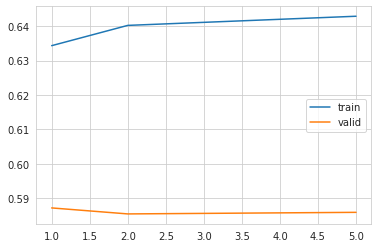

In [ ]:
# C
c = [1, 2, 5]
train = []
valid = []

for par in c:
    logreg2 = LogisticRegression(random_state=42,
                                 penalty='l2',
                                 C=par,
                                 solver='saga')
    result = cross_validate(logreg2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = c, y = train, label = 'train')
sns.lineplot( x = c, y = valid, label = 'valid')
plt.show()

In [ ]:
logreg_final = LogisticRegression(C=1, penalty = 'l2', random_state=42, solver='saga')
logreg_final.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=1, random_state=42, solver='saga')

In [ ]:
# treshold
y_pred_train = logreg_final.predict_proba(X_train_sel2)[:,1]
fpr, tpr, thre_roc = roc_curve(y_train, y_pred_train)

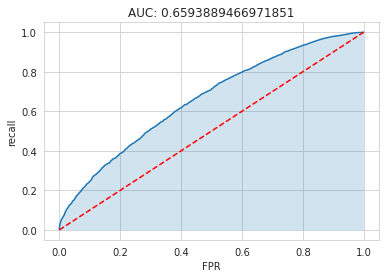

In [ ]:
sns.lineplot(x = fpr, y = tpr)
plt.plot([0, 1], [0,1], color='red', linestyle='--')
plt.fill_between(fpr, 0, tpr, alpha=0.2)
plt.xlabel('FPR')
plt.ylabel('recall')
plt.title('AUC: {}'.format(roc_auc_score(y_train, y_pred_train)))
plt.show()

In [ ]:
roc_auc_score(y_train, y_pred_train)

0.6593889466971851

In [ ]:
np.argmax((1-fpr)*tpr)

2837

In [ ]:
thre_roc[2837]

0.5734889033333656

In [ ]:
classif_pr(X_train_sel2, y_train, logreg_final, thre_roc[2837])

              precision    recall  f1-score   support

           1       0.68      0.63      0.66      6359
           0       0.53      0.59      0.56      4557

    accuracy                           0.61     10916
   macro avg       0.61      0.61      0.61     10916
weighted avg       0.62      0.61      0.62     10916



In [ ]:
classif_pr(X_test_sel, y_test, logreg_final, 0.5734889033333656)

              precision    recall  f1-score   support

           1       0.63      0.57      0.60      1590
           0       0.47      0.52      0.50      1139

    accuracy                           0.55      2729
   macro avg       0.55      0.55      0.55      2729
weighted avg       0.56      0.55      0.56      2729



#### Decision Tree

In [ ]:
# tuning

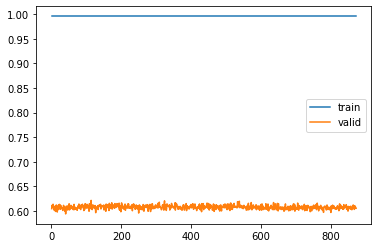

113

In [ ]:
# max_features
params = np.arange(1, len(X_train_sel2.columns)+1,1)
train = []
valid = []

for par in params:
    tree2 = DecisionTreeClassifier(random_state=42,
                                   max_features=par)
    result = cross_validate(tree2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
np.argmax(valid)

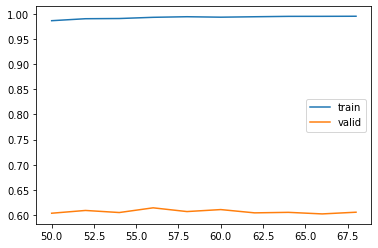

56

In [ ]:
# max_depth
params = np.arange(50,70,2)
train = []
valid = []

for par in params:
    tree2 = DecisionTreeClassifier(random_state=42,
                                   max_features=113,
                                   max_depth = par)
    result = cross_validate(tree2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

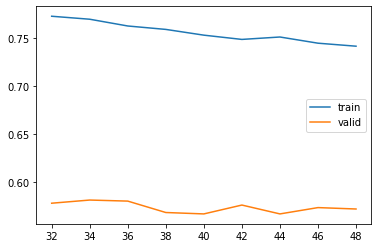

34

In [ ]:
# min_samples_split
params = np.arange(32, 50 , 2)
train = []
valid = []

for par in params:
    tree2 = DecisionTreeClassifier(random_state=42,
                                   max_features=113,
                                   max_depth = 56, 
                                   min_samples_split= par)
    result = cross_validate(tree2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

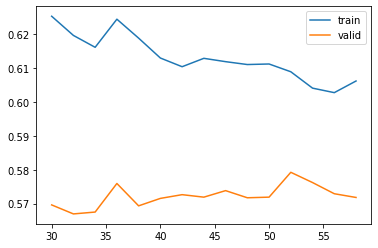

52

In [ ]:
# min_samples_leaf
params = np.arange(30, 60, 2)
train = []
valid = []

for par in params:
    tree2 = DecisionTreeClassifier(random_state=42,
                                   max_features=113,
                                   max_depth = 56, 
                                   min_samples_split= 34,
                                   min_samples_leaf = par)
    result = cross_validate(tree2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

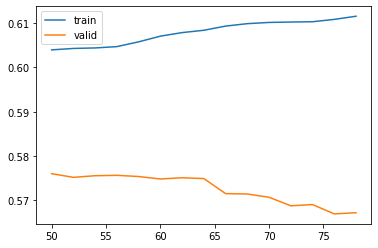

50

In [ ]:
# max_leaf_nodes
params = np.arange(50,80, 2)
train = []
valid = []

for par in params:
    tree2 = DecisionTreeClassifier(random_state=42,
                                   max_features=113,
                                   max_depth = 56, 
                                   min_samples_split= 34,
                                   min_samples_leaf = 52,
                                   max_leaf_nodes = par)
    result = cross_validate(tree2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

In [ ]:
tree_final = DecisionTreeClassifier(random_state=42, max_features=113,
                                   max_depth = 56, 
                                   min_samples_split= 34,
                                   min_samples_leaf = 52,
                                   max_leaf_nodes = 50)

In [ ]:
tree_final.fit(X_train_sel2, y_train)

DecisionTreeClassifier(max_depth=56, max_features=113, max_leaf_nodes=50,
                       min_samples_leaf=52, min_samples_split=34,
                       random_state=42)

In [ ]:
classif(X_train_sel2, y_train, tree_final)

              precision    recall  f1-score   support

           1       0.60      0.92      0.73      6359
           0       0.57      0.15      0.24      4557

    accuracy                           0.60     10916
   macro avg       0.59      0.54      0.48     10916
weighted avg       0.59      0.60      0.52     10916



In [ ]:
classif(X_test_sel, y_test, tree_final)

              precision    recall  f1-score   support

           1       0.59      0.91      0.72      1590
           0       0.50      0.13      0.21      1139

    accuracy                           0.58      2729
   macro avg       0.55      0.52      0.46      2729
weighted avg       0.55      0.58      0.50      2729



In [ ]:
# pakai gscv
param_grid = {'max_features': [113, 121, 139],
             'max_depth': [56, 60],
             'min_samples_split': [34, 36, 42],
             'min_samples_leaf': [46, 52],
             'max_leaf_nodes': [50, 64]}

In [ ]:
gscv_dt = GridSearchCV(DecisionTreeClassifier(random_state=42, criterion='gini'),
                    param_grid,
                    cv=5)

In [ ]:
gscv_dt.fit(X_train_sel2, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [56, 60], 'max_features': [113, 121, 139],
                         'max_leaf_nodes': [50, 64],
                         'min_samples_leaf': [46, 52],
                         'min_samples_split': [34, 36, 42]})

In [ ]:
gscv_dt.best_params_

{'max_depth': 56,
 'max_features': 113,
 'max_leaf_nodes': 64,
 'min_samples_leaf': 46,
 'min_samples_split': 34}

In [ ]:
tree_final2 = DecisionTreeClassifier(random_state=42, **gscv_dt.best_params_)

In [ ]:
tree_final2.fit(X_train_sel2, y_train)

DecisionTreeClassifier(max_depth=56, max_features=113, max_leaf_nodes=64,
                       min_samples_leaf=46, min_samples_split=34,
                       random_state=42)

In [ ]:
classif(X_train_sel2, y_train, tree_final2)

              precision    recall  f1-score   support

           1       0.61      0.88      0.72      6359
           0       0.57      0.22      0.31      4557

    accuracy                           0.60     10916
   macro avg       0.59      0.55      0.52     10916
weighted avg       0.59      0.60      0.55     10916



In [ ]:
classif(X_test_sel, y_test, tree_final2)

              precision    recall  f1-score   support

           1       0.59      0.85      0.70      1590
           0       0.47      0.18      0.26      1139

    accuracy                           0.57      2729
   macro avg       0.53      0.52      0.48      2729
weighted avg       0.54      0.57      0.52      2729



#### Random Forest

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

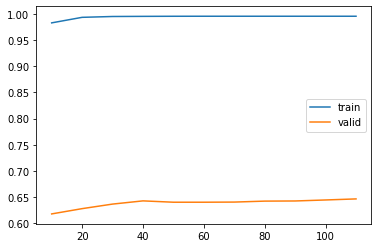

110

In [ ]:
# n_estimators
params = np.arange(10,120, 10)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

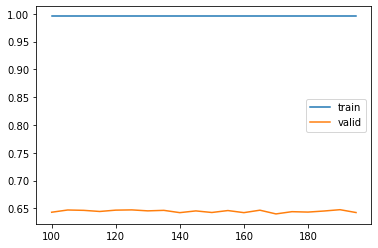

In [ ]:
params = np.arange(100, 200,5)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=110,
                                max_features=par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [ ]:
params[np.argmax(valid)]

190

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

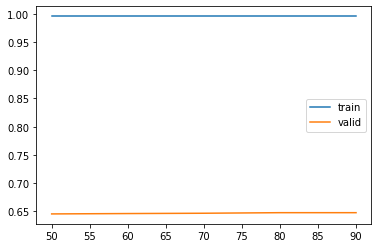

80

In [ ]:
# max depth
params = np.arange(50, 100, 10)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=110,
                                max_features=190,
                                max_depth = par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

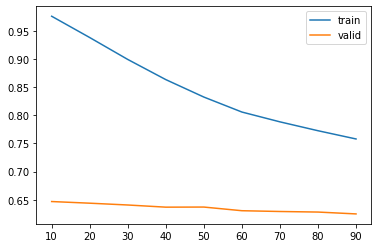

10

In [ ]:
# min samples split
params = np.arange(10, 100, 10)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=110,
                                max_features=190,
                                max_depth = 80,
                                min_samples_split = par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

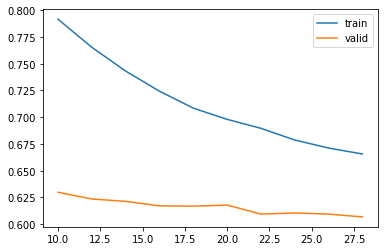

10

In [ ]:
# min samples leaf
params = np.arange(10, 30 , 2)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=110,
                                max_features=190,
                                max_depth = 80,
                                min_samples_split = 10,
                                min_samples_leaf = par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

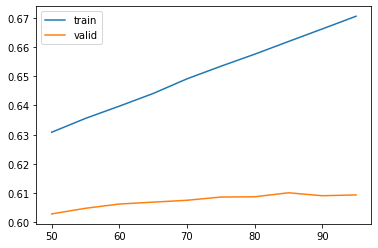

85

In [ ]:
# max leaf nodes
params = np.arange(50,100, 5)
train = []
valid = []

for par in params:
    rf2 = RandomForestClassifier(random_state=42,
                                n_estimators=110,
                                max_features=190,
                                max_depth = 80,
                                min_samples_split = 10,
                                min_samples_leaf = 10,
                                 max_leaf_nodes = par)
    result = cross_validate(rf2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

In [ ]:
rf_final = RandomForestClassifier(random_state=42, criterion='gini',
                                  n_estimators=110,
                                  max_features=190,
                                  max_depth = 80,
                                  min_samples_split = 10,
                                  min_samples_leaf = 10,
                                  max_leaf_nodes = 85)

In [ ]:
rf_final.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


RandomForestClassifier(max_depth=80, max_features=190, max_leaf_nodes=85,
                       min_samples_leaf=10, min_samples_split=10,
                       n_estimators=110, random_state=42)

In [ ]:
classif_pr(X_train_sel2, y_train, rf_final, 0.58 )

              precision    recall  f1-score   support

           1       0.77      0.75      0.76      6359
           0       0.66      0.68      0.67      4557

    accuracy                           0.72     10916
   macro avg       0.71      0.72      0.71     10916
weighted avg       0.72      0.72      0.72     10916



In [ ]:
classif_pr(X_test_sel, y_test, rf_final, 0.58)

              precision    recall  f1-score   support

           1       0.65      0.64      0.65      1590
           0       0.51      0.53      0.52      1139

    accuracy                           0.59      2729
   macro avg       0.58      0.58      0.58      2729
weighted avg       0.60      0.59      0.59      2729



In [ ]:
# pakai gscv
param_grid = {'n_estimators':[100, 110,],
              'max_features': [180, 190],
             'max_depth': [80],
             'min_samples_split': [10, 20, 50],
             'min_samples_leaf': [10, 20],
             'max_leaf_nodes': [85,90]}

In [ ]:
gscv_rf = GridSearchCV(RandomForestClassifier(random_state=42, criterion='gini'),
                    param_grid,
                    cv=5)

In [ ]:
gscv_rf.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [80], 'max_features': [180, 190],
                         'max_leaf_nodes': [85, 90],
                         'min_samples_leaf': [10, 20],
                         'min_samples_split': [10, 20, 50],
                         'n_estimators': [100, 110]})

In [ ]:
gscv_rf.best_params_

{'max_depth': 80,
 'max_features': 180,
 'max_leaf_nodes': 90,
 'min_samples_leaf': 10,
 'min_samples_split': 50,
 'n_estimators': 110}

In [ ]:
rf_final2 = RandomForestClassifier(random_state=42, **gscv_rf.best_params_)

In [ ]:
rf_final2.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


RandomForestClassifier(max_depth=80, max_features=180, max_leaf_nodes=90,
                       min_samples_leaf=10, min_samples_split=50,
                       n_estimators=110, random_state=42)

In [ ]:
classif_pr(X_train_sel2, y_train, rf_final2, 0.57)

              precision    recall  f1-score   support

           1       0.75      0.80      0.77      6359
           0       0.69      0.62      0.65      4557

    accuracy                           0.72     10916
   macro avg       0.72      0.71      0.71     10916
weighted avg       0.72      0.72      0.72     10916



In [ ]:
classif_pr(X_test_sel, y_test, rf_final2, 0.57)

              precision    recall  f1-score   support

           1       0.65      0.70      0.68      1590
           0       0.53      0.47      0.50      1139

    accuracy                           0.61      2729
   macro avg       0.59      0.59      0.59      2729
weighted avg       0.60      0.61      0.60      2729



#### AdaBoost

In [ ]:
ada =AdaBoostClassifier()

In [ ]:
ada.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostClassifier()

In [ ]:
classif_pr(X_train_sel2, y_train, ada, 0.5)

              precision    recall  f1-score   support

           1       0.61      0.92      0.73      6359
           0       0.60      0.17      0.27      4557

    accuracy                           0.61     10916
   macro avg       0.60      0.55      0.50     10916
weighted avg       0.60      0.61      0.54     10916



In [ ]:
classif_pr(X_test_sel, y_test, ada, 0.5)

              precision    recall  f1-score   support

           1       0.60      0.90      0.72      1590
           0       0.54      0.16      0.25      1139

    accuracy                           0.59      2729
   macro avg       0.57      0.53      0.48      2729
weighted avg       0.58      0.59      0.52      2729



/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

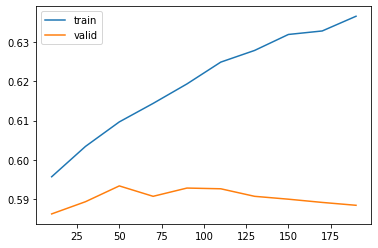

In [ ]:
params = np.arange(10,200,20)
train = []
valid = []

for par in params:
    ada2 = AdaBoostClassifier(random_state=42,
                                n_estimators=par)
    result = cross_validate(ada2, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [ ]:
params[np.argmax(valid)]

50

In [ ]:
ada_final = AdaBoostClassifier(n_estimators= 50)

In [ ]:
ada_final.fit(X_train_sel2, y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostClassifier()

In [ ]:
classif_pr(X_train_sel2, y_train, ada_final, 0.5)

              precision    recall  f1-score   support

           1       0.61      0.92      0.73      6359
           0       0.60      0.17      0.27      4557

    accuracy                           0.61     10916
   macro avg       0.60      0.55      0.50     10916
weighted avg       0.60      0.61      0.54     10916



In [ ]:
classif_pr(X_test_sel, y_test, ada_final, 0.5)

              precision    recall  f1-score   support

           1       0.60      0.90      0.72      1590
           0       0.54      0.16      0.25      1139

    accuracy                           0.59      2729
   macro avg       0.57      0.53      0.48      2729
weighted avg       0.58      0.59      0.52      2729



#### XGBoost

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

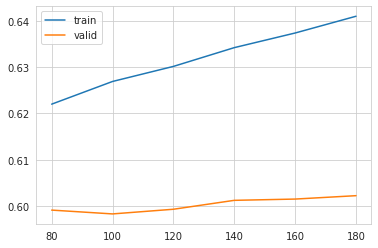

180

In [ ]:
params = np.arange(80, 200, 20)
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

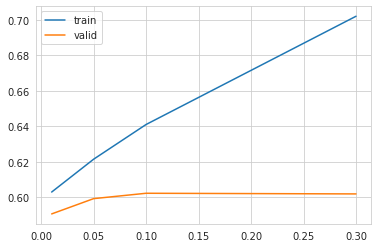

0.1

In [ ]:
params = [0.01, 0.05, 0.1, 0.3]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

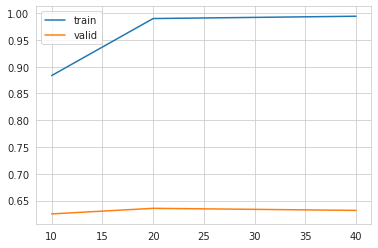

20

In [ ]:
params = [10,20,40]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=0.1,
                        max_depth=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

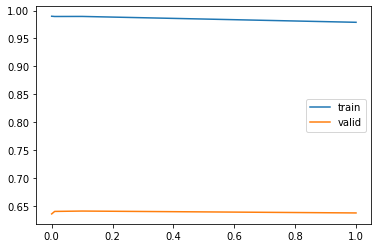

0.1

In [ ]:
params = [0, 0.01, 0.1, 1]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=0.1,
                        max_depth=20,
                        gamma=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

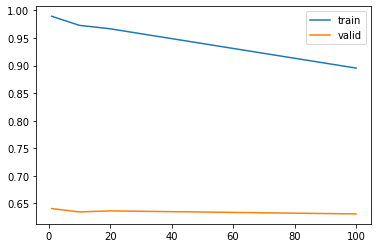

1

In [ ]:
params = [1, 10, 20, 100]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=0.1,
                        max_depth=20,
                        gamma=0.1,
                        reg_lambda = par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

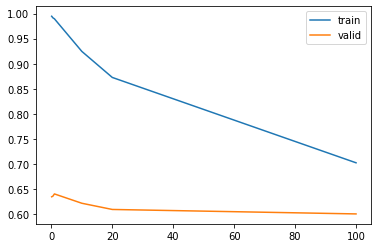

1

In [ ]:
params = [0.1, 0.5, 1, 10, 20, 100]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=0.1,
                        max_depth=20,
                        gamma=0.1,
                        reg_lambda = 1,
                        min_child_weight=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()
params[np.argmax(valid)]

In [ ]:
xgbfinal = XGBClassifier(random_state=42,
                        n_estimators=180,
                        learning_rate=0.1,
                        max_depth=20,
                        gamma=0.01,
                        reg_lambda = 1,
                        min_child_weight=1)

In [ ]:
xgbfinal.fit(X_train_sel2, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


XGBClassifier(gamma=0.01, max_depth=20, n_estimators=180, random_state=42)

In [ ]:
classif_pr(X_train_sel2, y_train, xgbfinal, 0.57)

              precision    recall  f1-score   support

           1       0.99      0.99      0.99      6359
           0       0.98      0.99      0.98      4557

    accuracy                           0.99     10916
   macro avg       0.98      0.99      0.99     10916
weighted avg       0.99      0.99      0.99     10916



In [ ]:
classif_pr(X_test_sel, y_test, xgbfinal, 0.57)

              precision    recall  f1-score   support

           1       0.69      0.71      0.70      1590
           0       0.58      0.56      0.57      1139

    accuracy                           0.65      2729
   macro avg       0.63      0.63      0.63      2729
weighted avg       0.64      0.65      0.64      2729



#### best model

###Evaluasi

In [ ]:
y_pred = xgbfinal.predict_proba(eval_sel)[:,1] > 0.57

In [ ]:
y_pred

array([ True,  True, False, ...,  True,  True, False])

In [ ]:
y_pred_int = y_pred.astype(int)

In [ ]:
label_btest = pd.DataFrame(y_pred_int, columns= ['label'])
label_btest.head()

,label
0,1
1,1
2,0
3,1
4,1


In [ ]:
#label_btest.to_csv('Labelint.csv', index = False)
#files.download('Labelint.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>